In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import seaborn as sns
from torch import nn
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader
from torchvision import datasets
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.backends.backend_agg import FigureCanvasAgg
import plotly.graph_objects as go
import plotly.express as px
import time
import sys
import torchvision
from scipy.special import binom
from scipy.integrate import odeint
from scipy.integrate import solve_ivp
from torchvision.utils import make_grid
sns.set()

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [3]:
class VAE(nn.Module):
    def __init__(self, input_shape, z_dim):
        super().__init__()

        self.z_dim = z_dim
        self.input_shape = input_shape

        # encoder
        self.encoder_conv = nn.Sequential(
            nn.Conv2d(3, 32, 3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 64, 3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, 64, 3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU()
        )
        self.conv_out_size = self._get_conv_out_size(input_shape)
        self.mu = nn.Sequential(
            nn.Linear(self.conv_out_size, z_dim),
            #nn.LeakyReLU(),
            #nn.Dropout(0.2)
        )
        self.log_var = nn.Sequential(
            nn.Linear(self.conv_out_size, z_dim),
            nn.LeakyReLU(),
            #nn.Dropout(0.2)
        )

        # decoder
        self.decoder_linear = nn.Sequential(
            nn.Linear(z_dim, self.conv_out_size),
            nn.LeakyReLU(),
            #nn.Dropout(0.2)
        )
        self.decoder_conv = nn.Sequential(
            nn.UpsamplingNearest2d(scale_factor=2),
            nn.ConvTranspose2d(64, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.UpsamplingNearest2d(scale_factor=2),
            nn.ConvTranspose2d(64, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.UpsamplingNearest2d(scale_factor=2),
            nn.ConvTranspose2d(64, 32, 3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.UpsamplingNearest2d(scale_factor=2),
            nn.ConvTranspose2d(32, 3, 3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def sampling(self, mu, log_var):
        ## TODO: epsilon should be at the model's device (not CUDA)
        epsilon = torch.Tensor(np.random.normal(size=(self.z_dim), scale=1.0))
        return mu

    def forward_encoder(self, x):
        x = self.encoder_conv(x)
        x = x.reshape(x.size()[0], -1)
        mu_p = self.mu(x)
        log_var_p = self.log_var(x)
        return [mu_p, log_var_p]

    def forward_decoder(self, x):
        x = self.decoder_linear(x)
        x = x.view(x.size()[0], *self.conv_out_shape[1:])
        x = self.decoder_conv(x)
        return x

    def forward(self, x):
        mu_p, log_var_p = self.forward_encoder(x)
        x = self.sampling(mu_p, log_var_p)
        images_p = self.forward_decoder(x)
        return [mu_p, log_var_p, images_p,x]

    def _get_conv_out_size(self, shape):
        out = self.encoder_conv(torch.zeros(1, *shape))
        self.conv_out_shape = out.size()
        return int(np.prod(self.conv_out_shape))

    def save(self, where):
        dump = {'z_dim': self.z_dim,
                'input_shape': self.input_shape,
                'state_dict': self.state_dict()}
        torch.save(dump, where)

    def forward_no_epsilon(self, x):
        mu_p, log_var_p = self.forward_encoder(x)
        x = mu_p
        images_p = self.forward_decoder(x)
        return images_p

In [4]:
class Sindy:
  def __init__(self,dataset,time_vec,poly_order,model_order,use_sine,use_const):
    self.X = dataset
    self.time_vec = time_vec
    self.poly_order = poly_order
    self.use_sine = use_sine
    self.use_const = use_const
    self.model_order = model_order
    self.grads = self.data_grad(model_order)

  def data_grad(self,order=1):
    dX = np.zeros(self.X.shape)
    n = len(self.X)
    dX[0] = (self.X[1] - self.X[0])/(self.time_vec[1] - self.time_vec[0])
    dX[n-1] = (self.X[n-1] - self.X[n-2])/(self.time_vec[n-1] - self.time_vec[n-2])
    for i in range(1,n-1):
      t2,t1 = self.time_vec[i+1],self.time_vec[i-1]
      dX[i] = (self.X[i+1] - self.X[i-1])/(t2 - t1)
    if order == 2:
      ddX = np.zeros(dX.shape)
      ddX[0] = (dX[1] - dX[0])/(self.time_vec[1] - self.time_vec[0])
      ddX[n-1] =(dX[n-1] - dX[n-2])/(self.time_vec[n-1] - self.time_vec[n-2])
      for i in range(1,n-2):
        ddX[i] = (self.X[i+1] - 2*self.X[i] + self.X[i-1])/((self.time_vec[i+1] - self.time_vec[i])**2)
      return {1:dX,2:ddX}
    return {1:dX}

  def get_library_size(self,n):
    l=0
    for k in range(self.poly_order+1):
      l += int(binom(n+k-1,k))
    if self.use_sine == True:
      l +=n
    if self.use_const == True:
      l +=1
    return l

  def library(self,data):
    m,n = data.shape
    l = self.get_library_size(n)
    lib = np.ones((m,l))
    idx = 1
    for i in range(n):
      lib[:,idx] = data[:,i]
      idx +=1

    if self.poly_order > 1:
      for i in range(n):
        for j in range(i,n):
          lib[:,idx] = data[:,i]*data[:,j]
          idx += 1

    if self.poly_order > 2:
      for i in range(n):
        for j in range(i,n):
          for k in range(j,n):
            lib[:,idx] = data[:,i]*data[:,j]*data[:,k]
            idx += 1

    if self.poly_order >3:
        for i in range(n):
            for j in range(i,n):
                for k in range(j,n):
                    for q in range(k,n):
                        lib[:,idx] = data[:,i]*data[:,j]*data[:,k]*data[:,q]
                        idx += 1

    if self.poly_order > 4:
        for i in range(n):
            for j in range(i,n):
                for k in range(j,n):
                    for q in range(k,n):
                        for r in range(q,n):
                            lib[:,idx] = data[:,i]*data[:,j]*data[:,k]*data[:,q]*data[:,r]
                            idx += 1

    if self.use_sine == True:
      for i in range(n):
        lib[:,idx] = np.sin(data[:,i])
        idx +=1


    return lib[:,1:]

  def library_high_order(self):
    res = (self.X,)
    for i in range(1,self.model_order):
      grad = self.grads[i]
      res = res + (grad,)
    res = np.concatenate(res,axis = 1)
    lib = self.library(res)
    return lib

  def fit(self,xdot, theta):
    m,n = theta.shape
    ksi = np.linalg.lstsq(theta,xdot, rcond = None)[0]

    return ksi



In [5]:
# This function is specific for second order models
def sindy_simulate(x0, t, Xi, lib_func):
    m = t.size
    n = x0.size
    f = lambda x,t : torch.dot(lib_func(torch.tensor(x).reshape((1,n))), Xi).reshape((n,))

    x = odeint(f, x0, t)
    return x


def sindy_simulate_order2(x0, dx0, t, ksi, lib_func):
    m = t.size
    n = 2*x0.size
    l = ksi.shape[0]
    print(n,l)
    Xi_order1 = np.zeros((l,n))
    for i in range(n//2):
        Xi_order1[2*(i+1)-1,i] = 1.
        Xi_order1[:,i+n//2] = ksi[:,i]

    x = sindy_simulate(np.concatenate((x0,dx0)), t, Xi_order1, lib_func)
    return x

In [6]:
class CircularGen:
  def __init__(self,A,centerx,centery,ball_r,T,snap_num,n_period):
    self.im_size =64
    self.A = A
    self.centerx = centerx
    self.centery = centery
    self.ball_r = ball_r
    self.T = T
    self.snap_num = snap_num
    self.n_period = n_period
    self.time_vec = np.linspace(0,self.n_period*self.T,self.snap_num)

  def fig2data (self,fig):
    # draw the renderer
    fig.canvas.draw ( )

    # Get the RGBA buffer from the figure
    w,h = fig.canvas.get_width_height()
    buf = np.fromstring ( fig.canvas.tostring_argb(), dtype=np.uint8 )
    buf.shape = ( w, h,3)

    # canvas.tostring_argb give pixmap in ARGB mode. Roll the ALPHA channel to have it in RGBA mode
    buf = np.roll ( buf, 3, axis = 2 )
    return buf

  def pos(self,t):
    # A: radius of the circular trajectory
    # T: period
    # time
    # returns a snapshot of the positions of a ball
    w = (2*np.pi)/self.T
    x,y = self.A*np.cos(w*t) + 0.0 * np.random.randn(1),self.A*np.sin(w*t) + 0.0 * np.random.randn(1)
    return x,y

  def generate(self):
    data = {}
    t_vec = self.time_vec
    trajecx = []
    trajecy = []
    bx_,by_ = np.meshgrid(np.linspace(-1,1, self.im_size//8), np.linspace(-1,1, self.im_size//8))
    ball = bx_**2 + by_**2 < 1
    for t in t_vec:
      x,y = self.pos(t)
      trajecx.append(x)
      trajecy.append(y)
      eps = 1e-2
      matrix = np.ones((self.im_size,self.im_size,3))
      x_, y_ = np.meshgrid(np.linspace(-2*self.A, 2*self.A, self.im_size), np.linspace(-2*self.A, 2*self.A, self.im_size))
      ball = (x_.T - x)**2 + (y_.T - y)**2 < eps
      matrix = matrix * ball[:,:,np.newaxis]
      data[t] = matrix
    keys   = list(data.keys())
    values = tuple(data.values())
    res = np.stack(values)
    return res,self.time_vec,trajecx,trajecy

def data_grad(data,order=1):
  """"
  data: dict with snapshot time as key: image as value
  order: order of the derivative

  returns: derivatives of the data wrt to time
  """""

  n_snapshots = len(data.keys())
  dx = {}
  keys = list(data.keys())
  for i in range(len(keys)):
    if i ==0:
      t1 = keys[i]
      t2 = keys[i+1]
    elif i == len(keys)-1:
      t1 = keys[i-1]
      t2 = keys[i]
    else:
      t1 = keys[i-1]
      t2 = keys[i+1]
    grad = (data[t2] - data[t1])/(t2 - t1)
    dx[keys[i]] = grad
  if order == 2:
    ddx = {}
    keys = list(dx.keys())
    for i in range(len(keys)):
      if i ==0:
        t1 = keys[i]
        t2 = keys[i+1]
      elif i == len(keys)-1:
        t1 = keys[i-1]
        t2 = keys[i]
      else:
        t1 = keys[i-1]
        t2 = keys[i+1]
      grad = (data[t2] - data[t1])/(t2 - t1)
      ddx[keys[i]] = grad
    return dx,ddx

  return dx


def to_batches(df,batch_size):
  data_len = len(df)
  n = data_len//batch_size
  res = []
  for i in range(1,n+1):
    a = torch.tensor(df[batch_size*(i-1):batch_size*i])
    res.append(a)
  if data_len%batch_size != 0:
    a = torch.tensor(df[batch_size*i:])
    res.append(a)
  return res

In [7]:
# Generate data with initial conditions
def get_dataset():
  res = []
  true_trajec = {}
  A,centerx,centery,ball_r,T,snap_num,n_period = 0.25,0.5,0.5,0.1,1,500,2
  data_object = CircularGen(A,centerx,centery,ball_r,T,snap_num,n_period)
  df,time_vec,trajecx,trajecy = data_object.generate()
  true_trajec = [trajecx,trajecy]
  res.append(df)
  dataset = np.concatenate(res)
  return dataset,true_trajec,time_vec,trajecx,trajecy

In [8]:
dataset,true_trajec,time_vec,truex,truey = get_dataset()
print("Dataset shape = {}".format(dataset.shape))
torch.cuda.empty_cache()

Dataset shape = (500, 64, 64, 3)


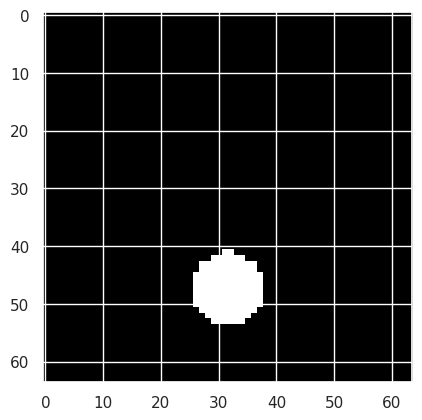

In [9]:
# Initial position of the ball
plt.imshow(dataset[0])
plt.show()

In [10]:
def data_grad(X,time_vec, device, order=1):
  dX = torch.zeros(X.shape, device=device)
  n = len(X)
  dX[0] = (X[1] - X[0])/(time_vec[1] - time_vec[0])
  dX[n-1] = (X[n-1] - X[n-2])/(time_vec[n-1] - time_vec[n-2])
  for i in range(1,n-1):
    t2,t1 = time_vec[i+1],time_vec[i-1]
    dX[i] = (X[i+1] - X[i-1])/(t2 - t1)
  if order == 2:
    ddX = np.zeros(dX.shape)
    ddX[0] = (dX[1] - dX[0])/(time_vec[1] - time_vec[0])
    ddX[n-1] =(dX[n-1] - dX[n-2])/(time_vec[n-1] - time_vec[n-2])
    for i in range(1,n-2):
      ddX[i] = (X[i+1] - 2*X[i] + X[i-1])/((time_vec[i+1] - time_vec[i])**2)
    return {1:dX,2:ddX}
  return {1:dX}

In [11]:
def integrate(z, f, delta_t):
    dyn = tuple()
    dyn+=(z[0],)
    for i in reversed(range(1, len(f))):
        dyn+=(z[0] + torch.sum(f[:-i], 0)*delta_t,)
    int_dynamics = torch.stack(dyn)
    return int_dynamics

In [12]:
def get_library_size(n,poly_order,use_sine=False, use_const = False):
    l=0
    for k in range(poly_order+1):
      l += int(binom(n+k-1,k))
    if use_sine == True:
      l +=n
    if use_const == True:
      l +=1
    return l

def library(latent, poly_order, use_sine, use_const, device):
    m,n = latent.shape
    l = get_library_size(n, poly_order, use_sine=use_sine, use_const = use_const)
    lib = torch.ones((m,l),device = device)
    idx = 1
    for i in range(n):
      lib[:,idx] = latent[:,i]
      idx +=1

    if poly_order > 1:
      for i in range(n):
        for j in range(i,n):
          lib[:,idx] = latent[:,i]*latent[:,j]
          idx += 1

    if poly_order > 2:
      for i in range(n):
        for j in range(i,n):
          for k in range(j,n):
            lib[:,idx] = latent[:,i]*latent[:,j]*latent[:,k]
            idx += 1

    if poly_order >3:
        for i in range(n):
            for j in range(i,n):
                for k in range(j,n):
                    for q in range(k,n):
                        lib[:,idx] = latent[:,i]*latent[:,j]*latent[:,k]*latent[:,q]
                        idx += 1

    if poly_order > 4:
        for i in range(n):
            for j in range(i,n):
                for k in range(j,n):
                    for q in range(k,n):
                        for r in range(q,n):
                            lib[:,idx] = latent[:,i]*latent[:,j]*latent[:,k]*latent[:,q]*latent[:,r]
                            idx += 1

    if use_sine == True:
      for i in range(n):
        lib[:,idx] = torch.sin(latent[:,i])
        idx +=1


    return lib[:,1:]

def fit(xdot, theta):
  m,n = theta.shape
  ksi = torch.linalg.lstsq(theta,xdot, rcond = None)[0]

  return ksi

In [13]:

# Latent space dimension
d = 2

# Intializing the model
vae = VAE((3,64,64), d)
coeff = torch.nn.Parameter(torch.rand((3,2), requires_grad=True, device="cuda", dtype=torch.float32))
params_to_optimize = [{"params":vae.parameters()},{"params": coeff}]

# Reconstruction loss function
loss_func = nn.MSELoss()

# Optimizer
learning_rate = 0.01
optimizer = torch.optim.AdamW(params_to_optimize,
                             lr = learning_rate)
vae.to(device)

VAE(
  (encoder_conv): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01)
  )
  (mu): Sequential(
    (0): Linear(in_features=1024, out_features=2, bias=True)
  )
  (log_var): Sequential(
    (0): Linear(in_features=1024, 

In [14]:
torch.cuda.empty_cache()

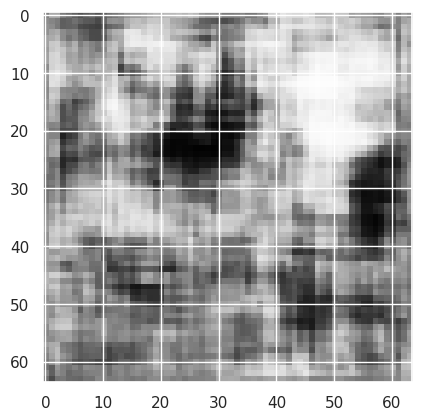

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


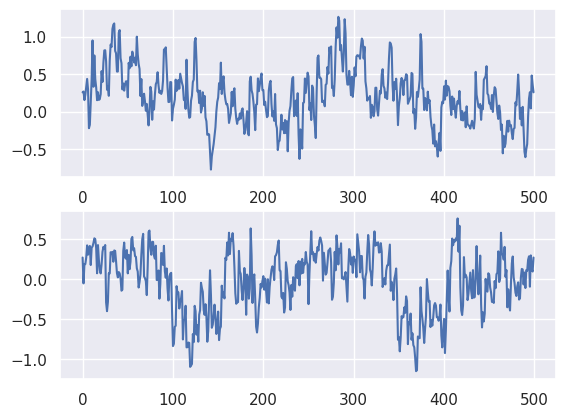

************************************************


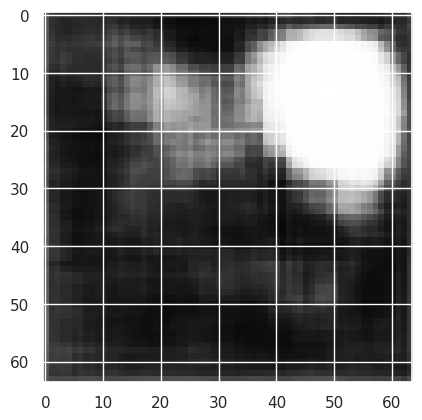

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


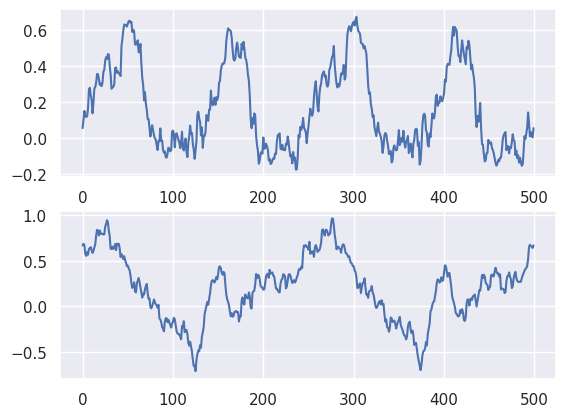

************************************************


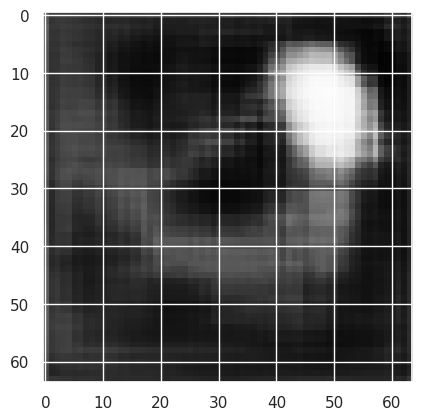

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


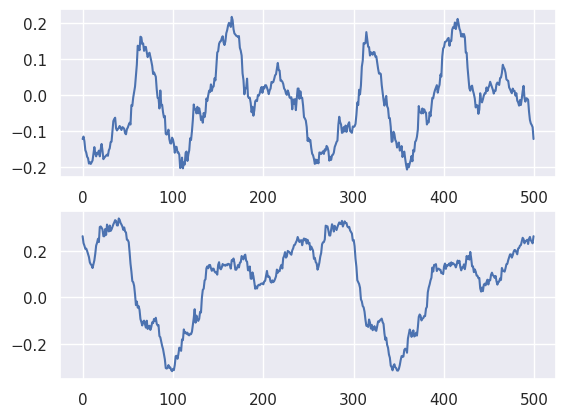

************************************************


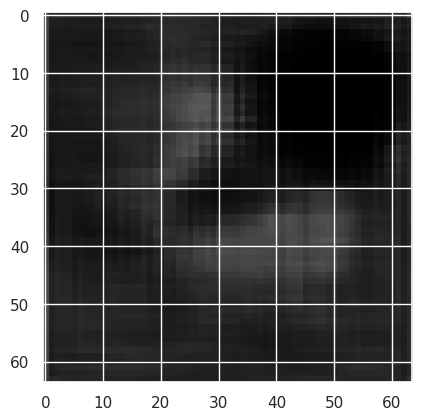

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


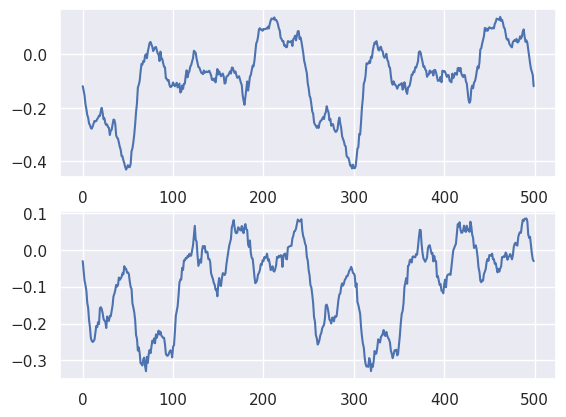

************************************************


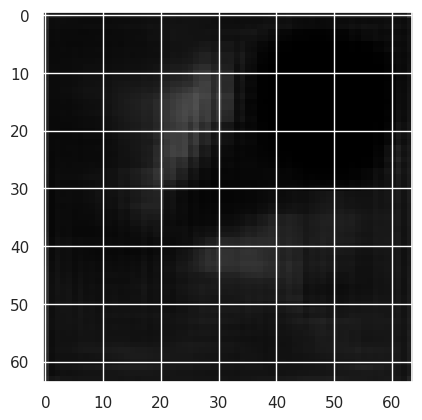

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


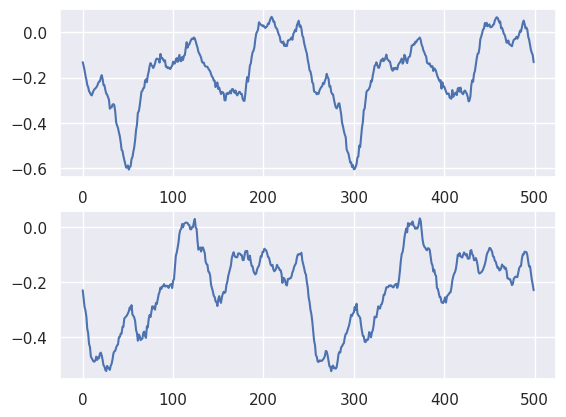

************************************************


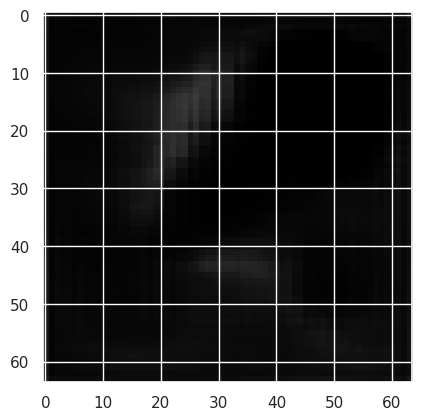

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


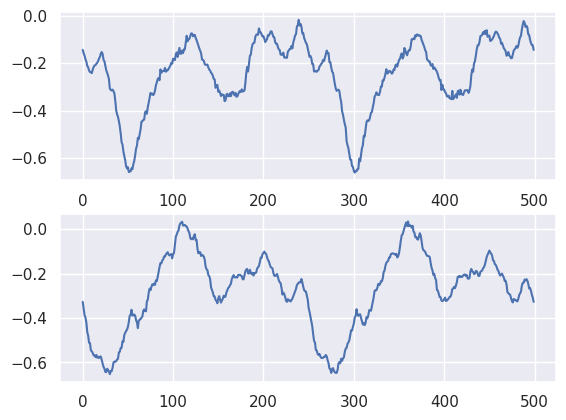

************************************************


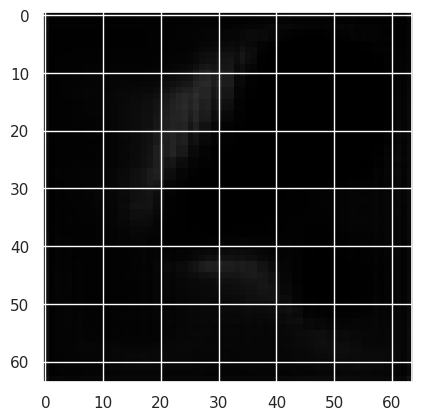

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


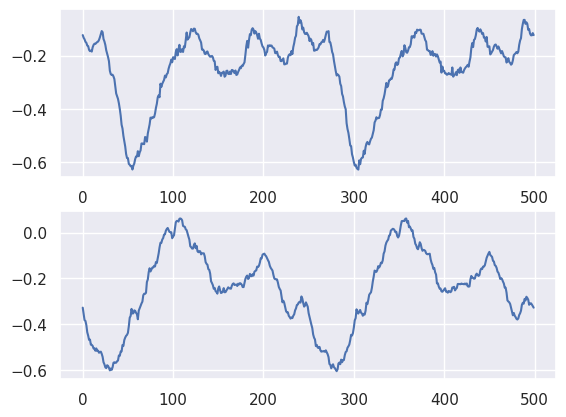

************************************************


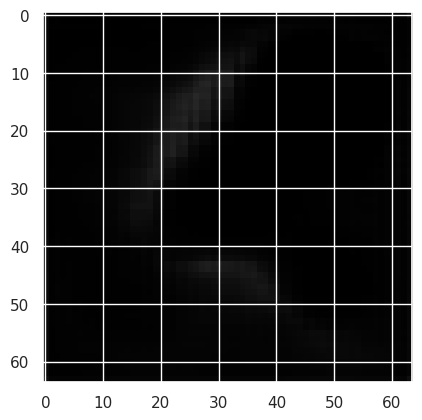

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


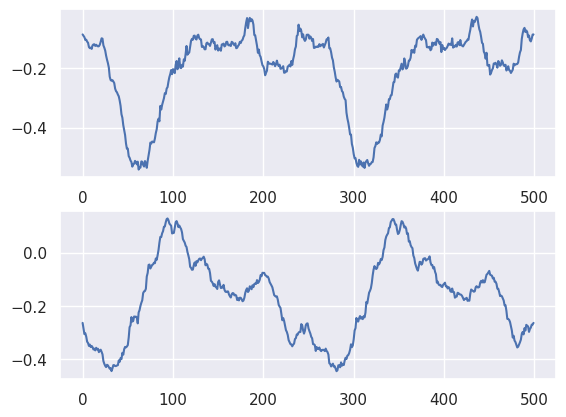

************************************************


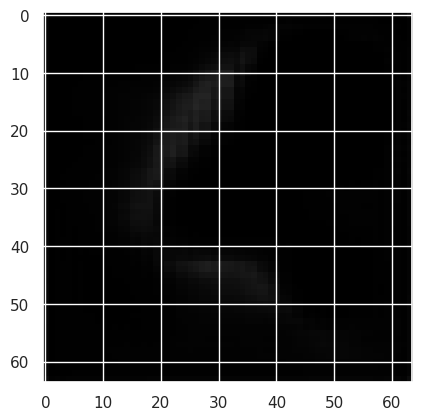

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


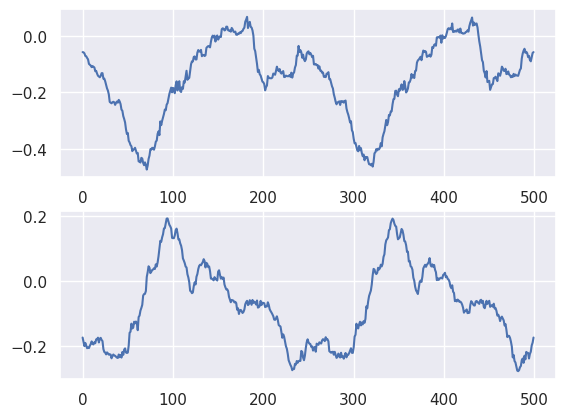

************************************************


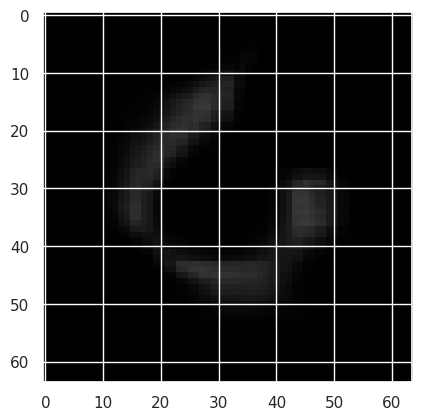

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


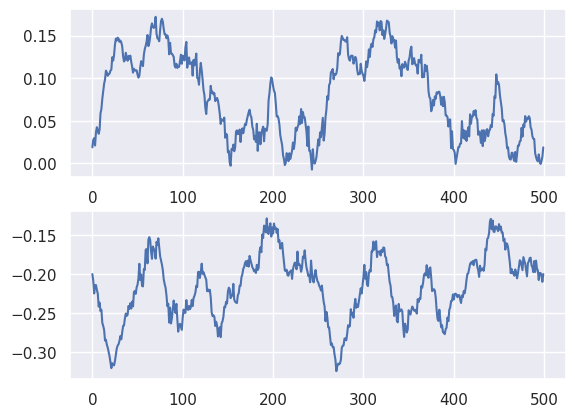

************************************************


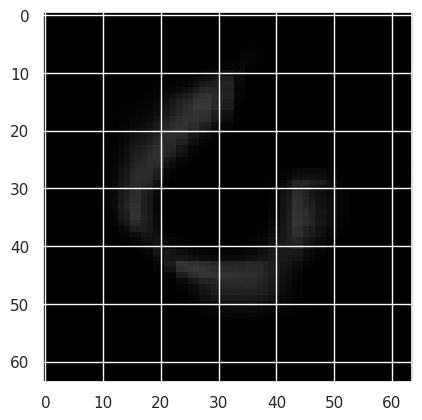

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


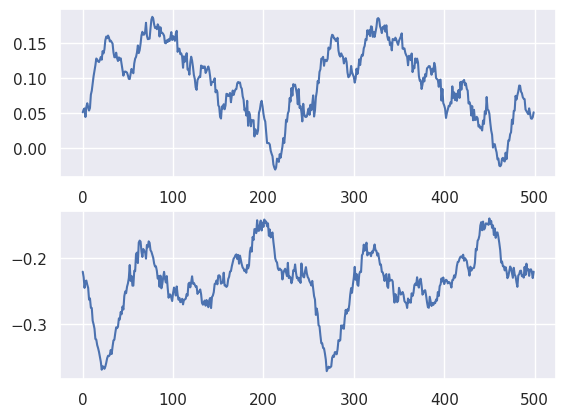

************************************************


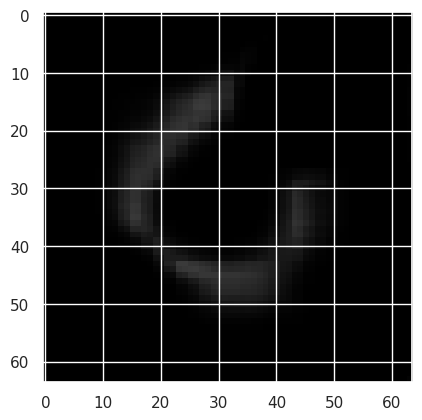

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


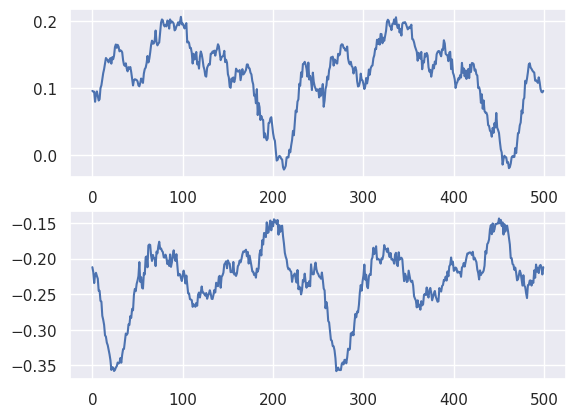

************************************************


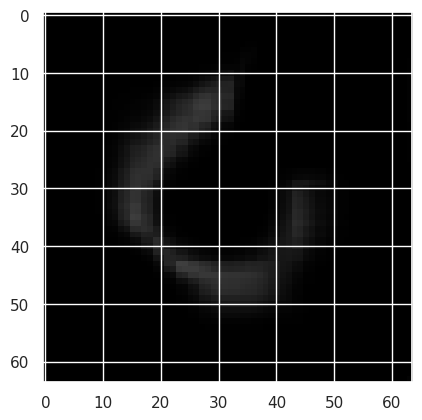

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


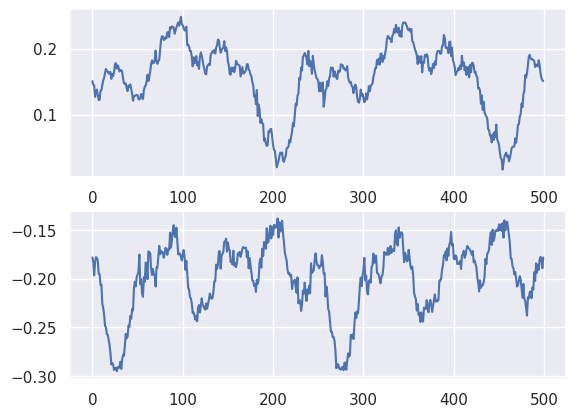

************************************************


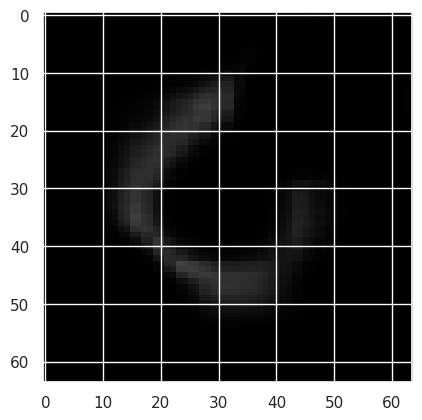

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


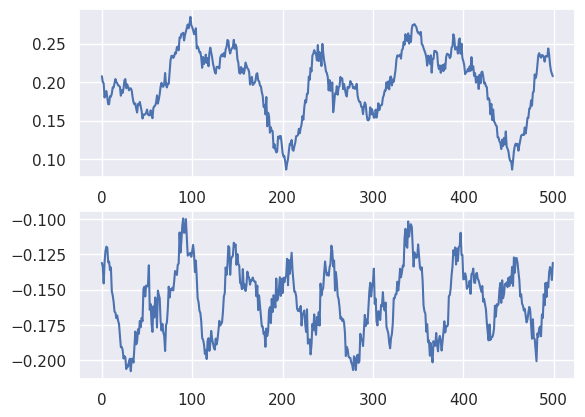

************************************************


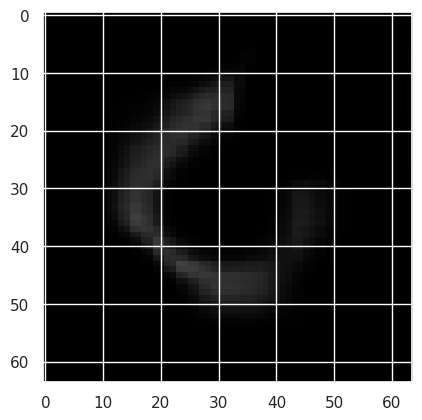

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


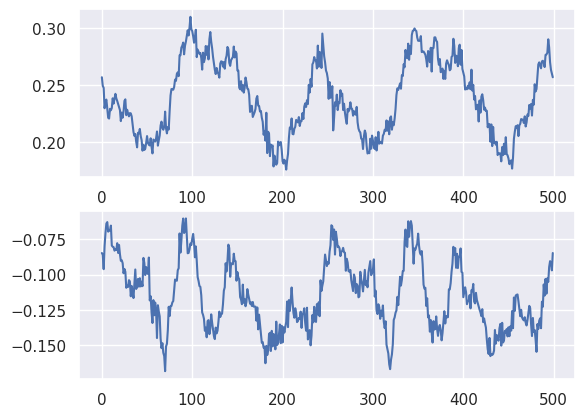

************************************************


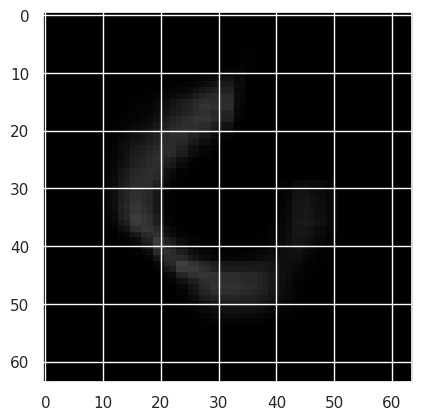

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


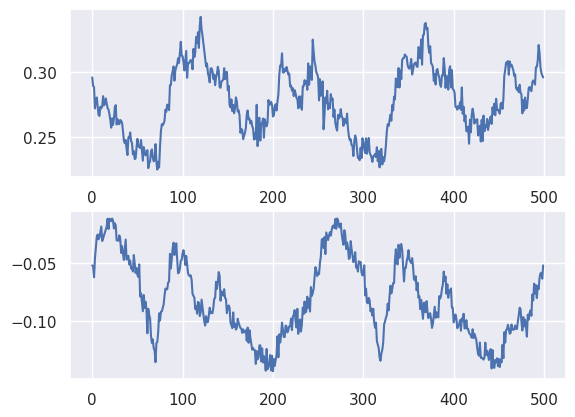

************************************************


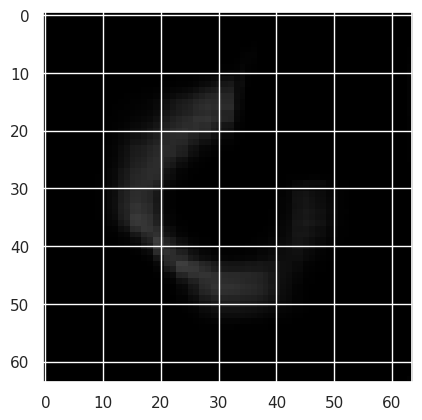

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


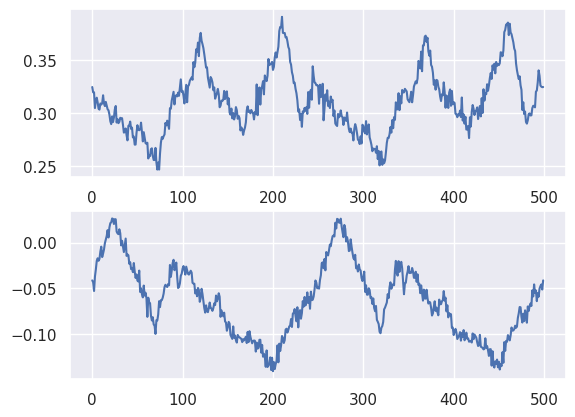

************************************************


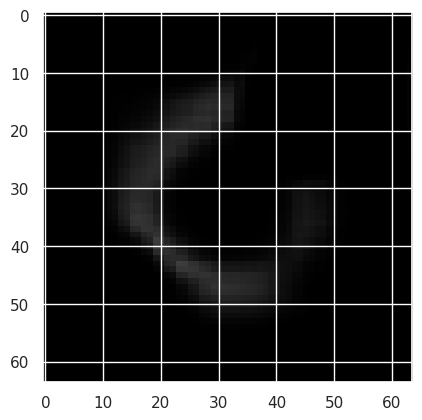

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


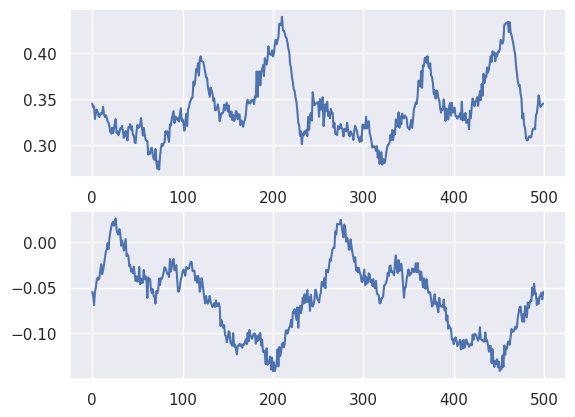

************************************************


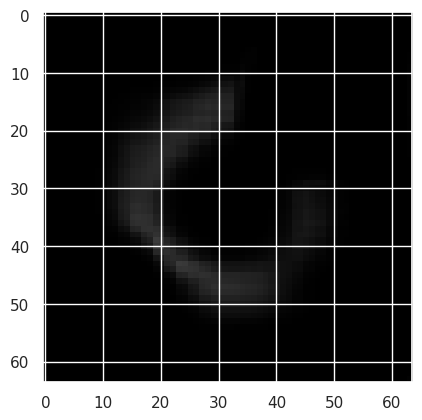

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


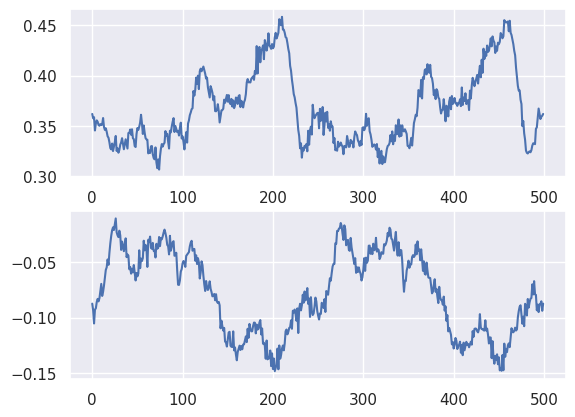

************************************************


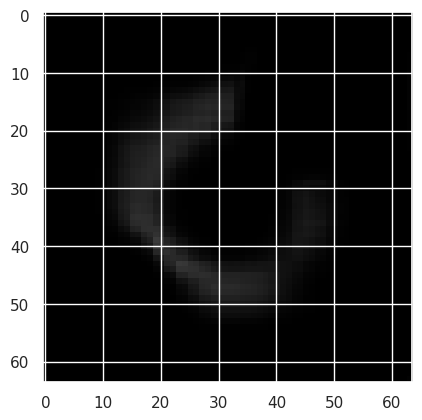

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


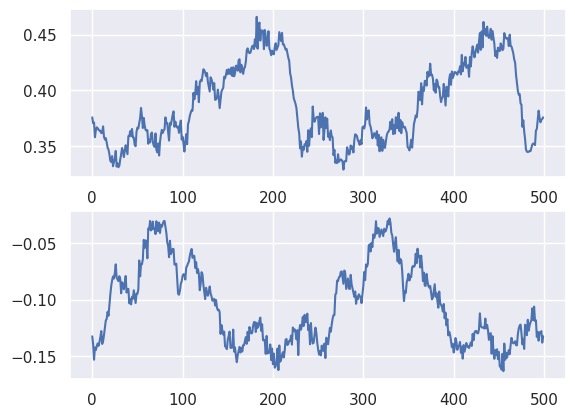

************************************************


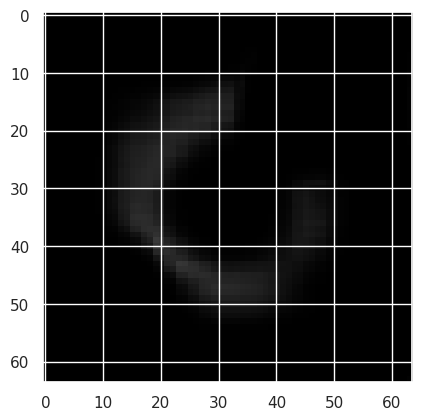

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


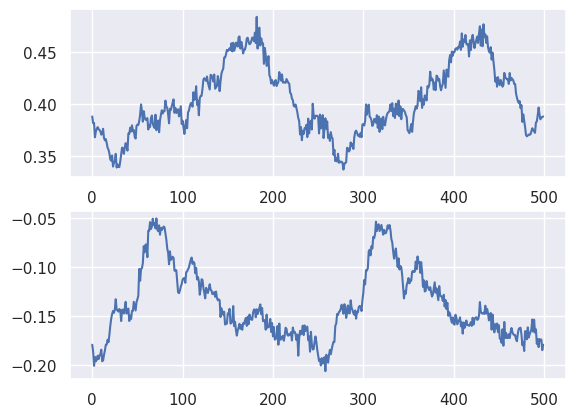

************************************************


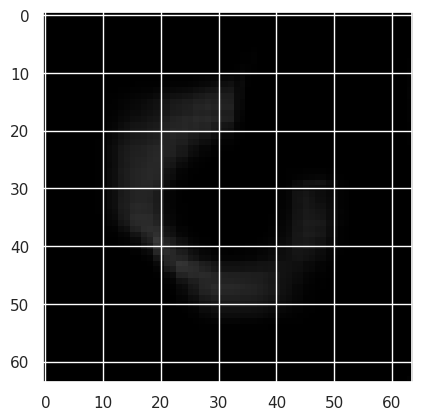

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


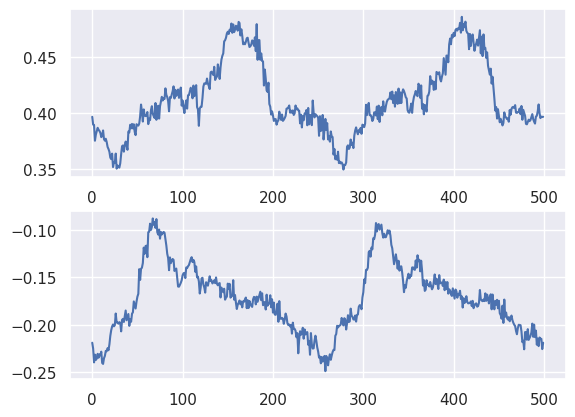

************************************************


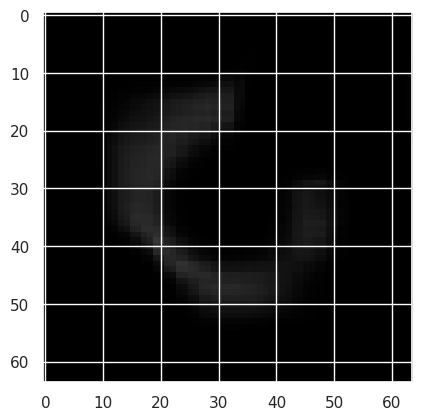

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


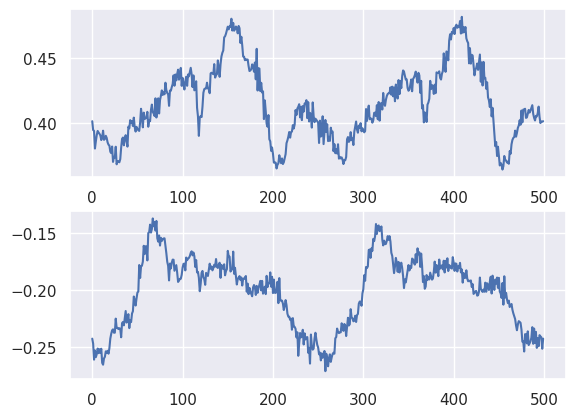

************************************************


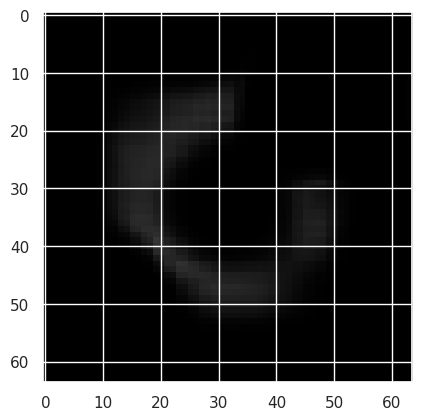

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


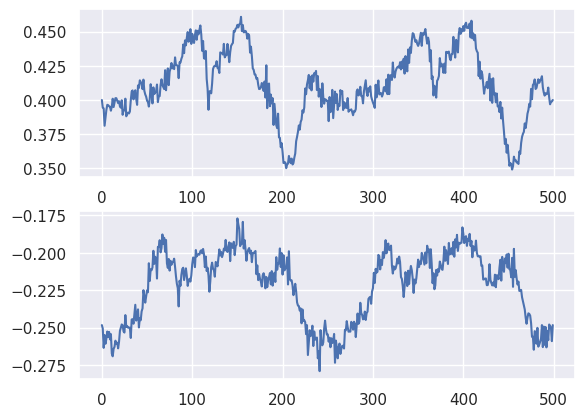

************************************************


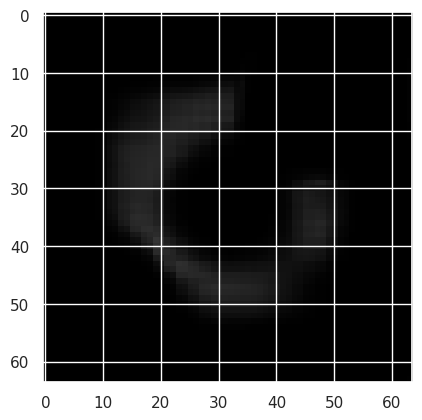

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


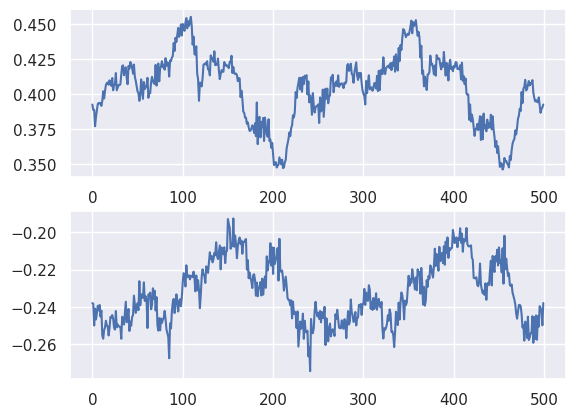

************************************************


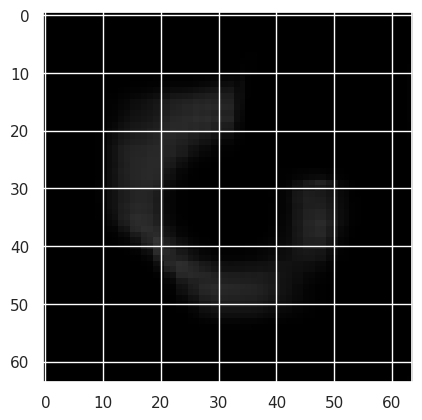

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


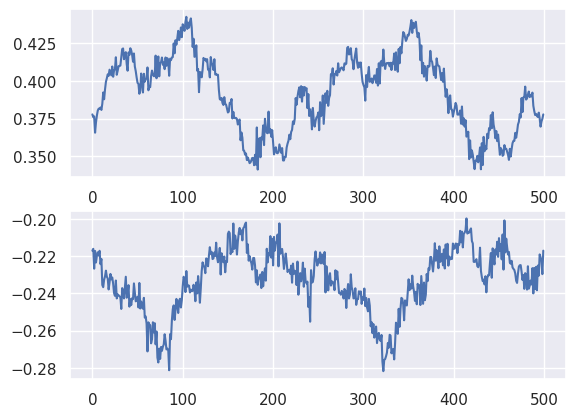

************************************************


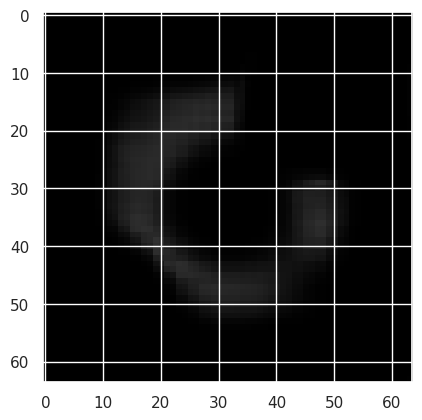

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


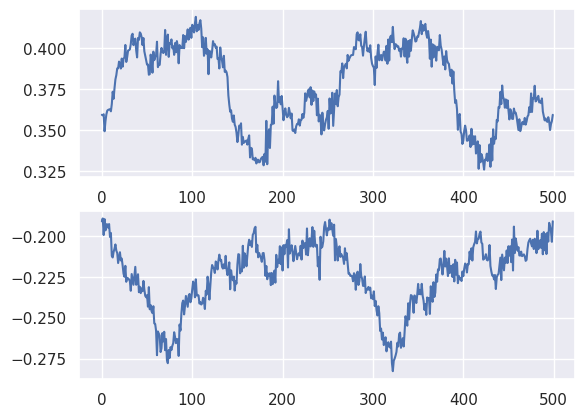

************************************************


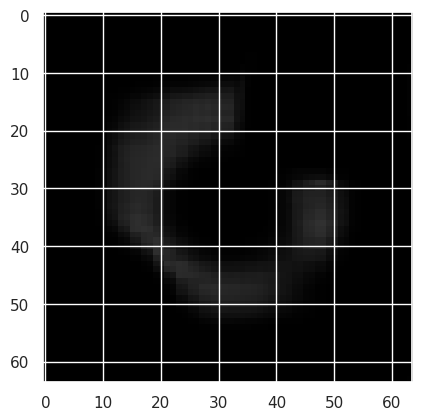

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


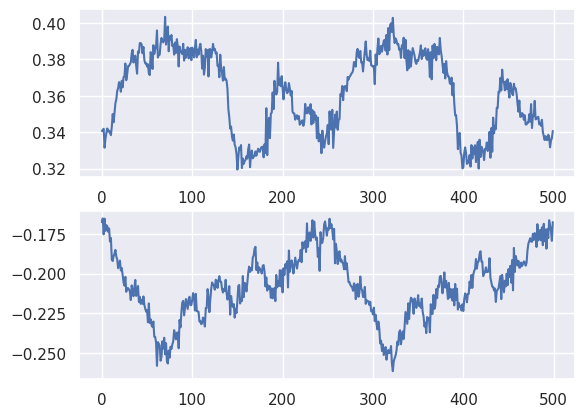

************************************************


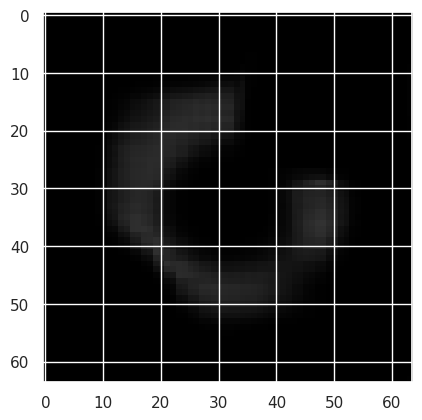

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


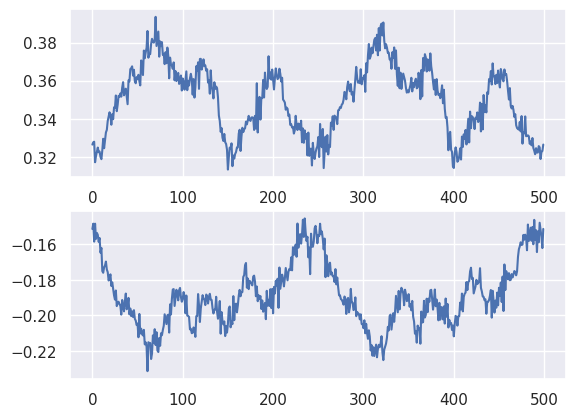

************************************************


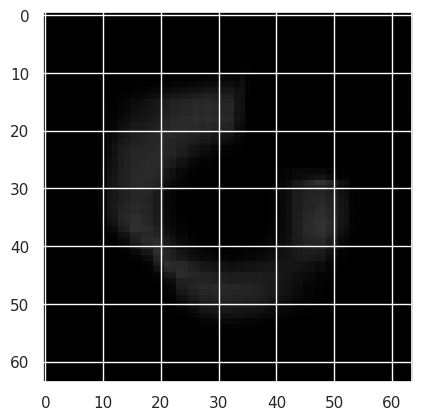

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


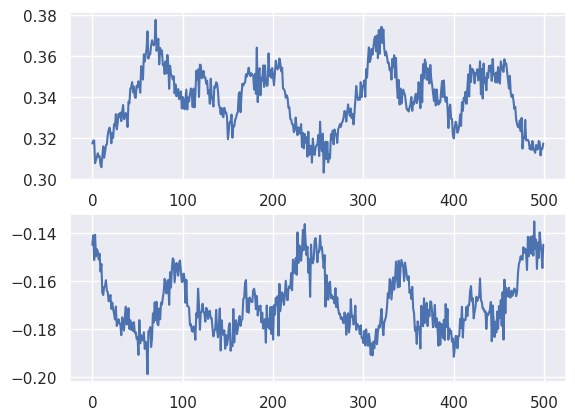

************************************************


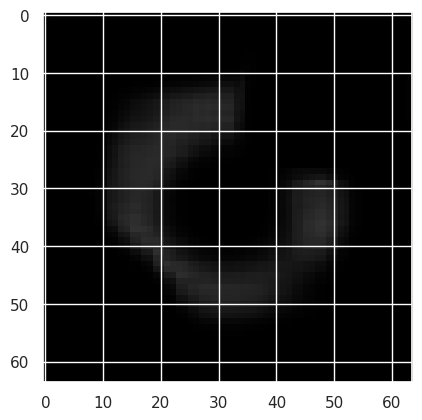

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


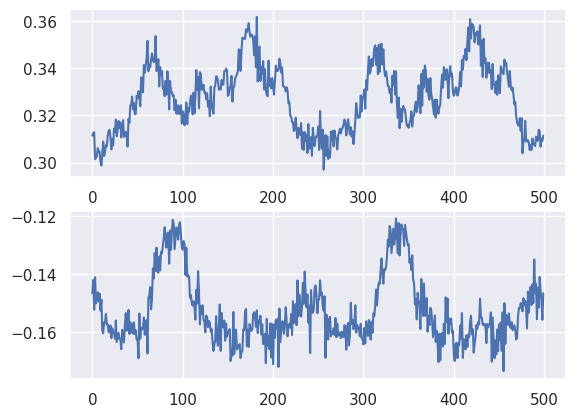

************************************************


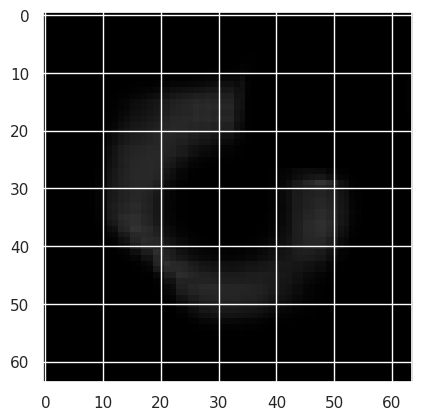

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


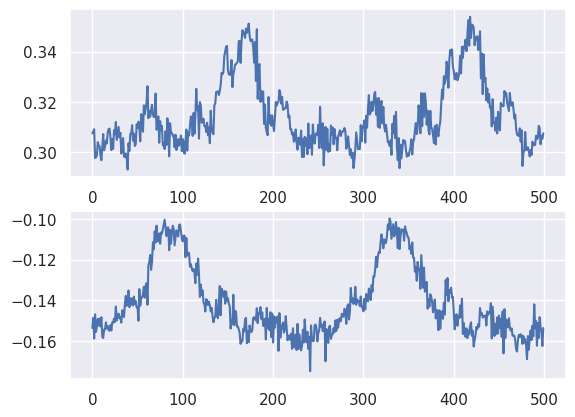

************************************************


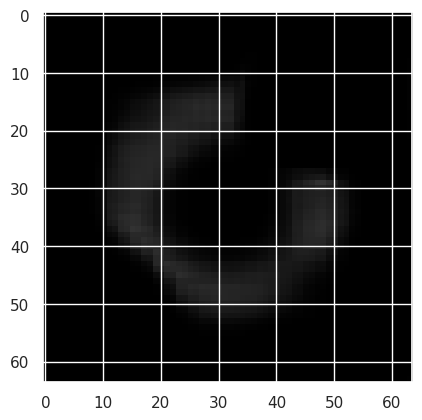

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


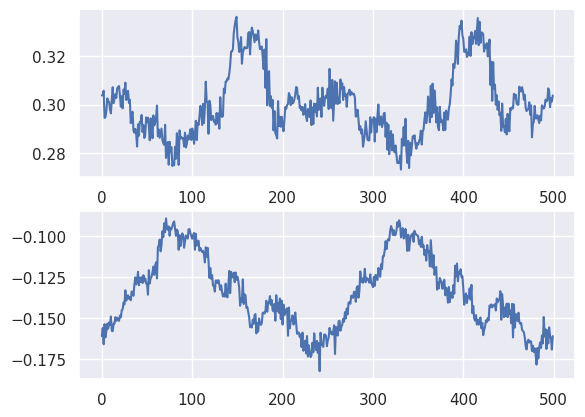

************************************************


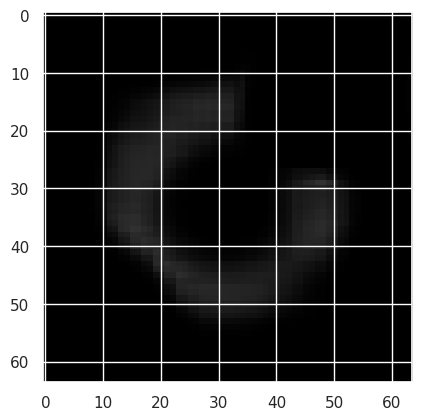

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


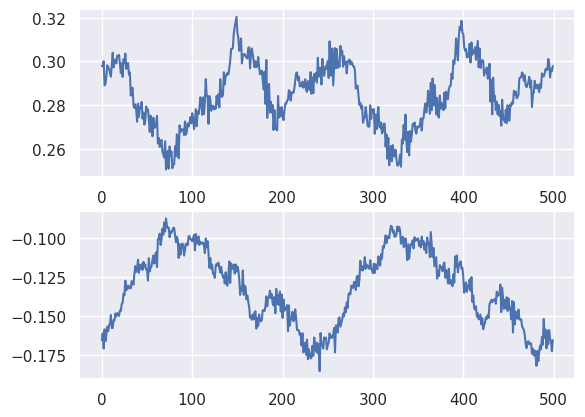

************************************************


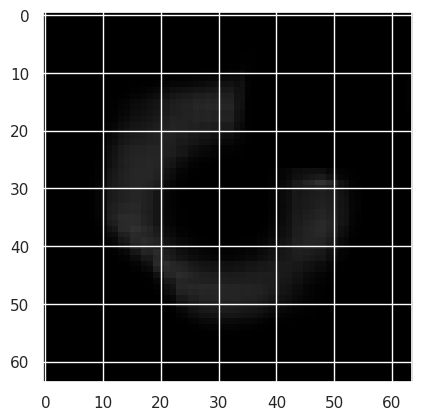

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


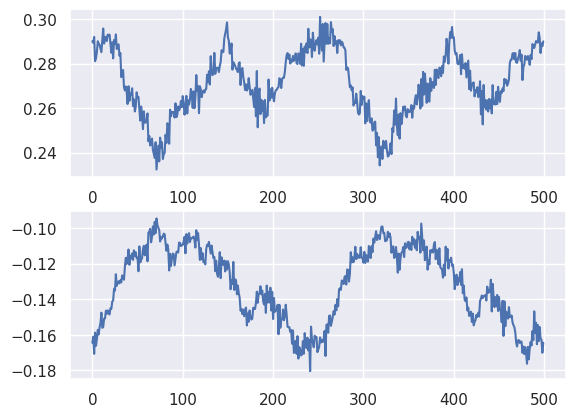

************************************************


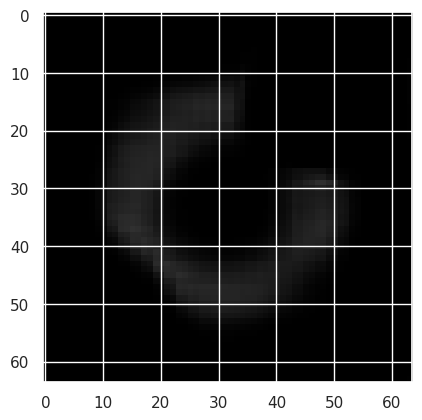

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


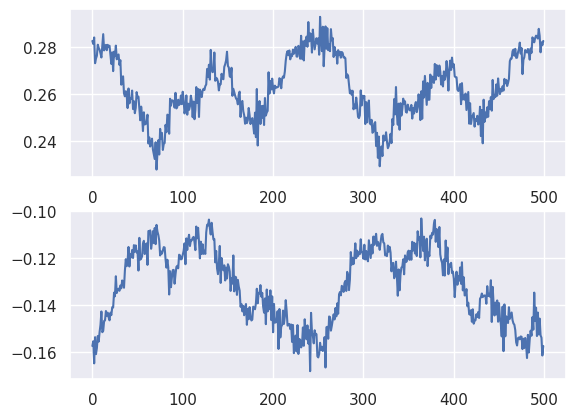

************************************************


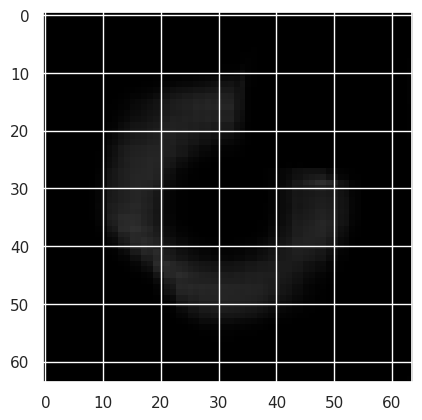

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


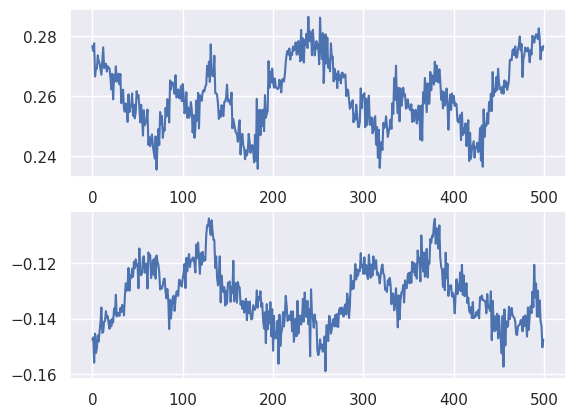

************************************************


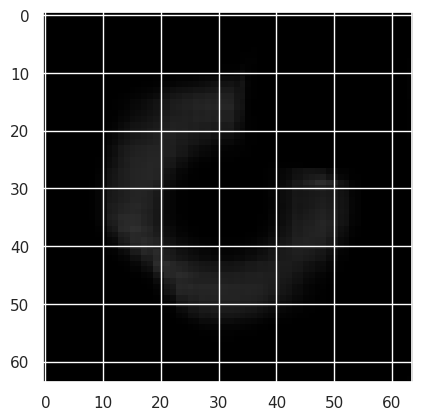

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


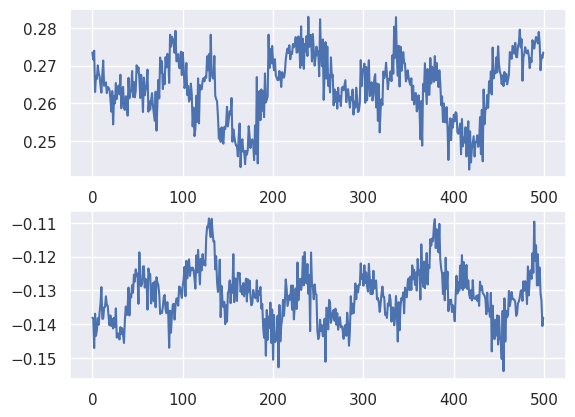

************************************************


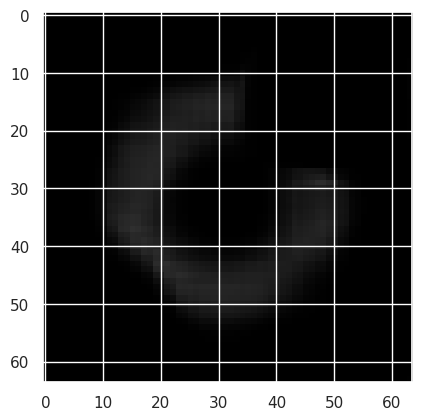

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


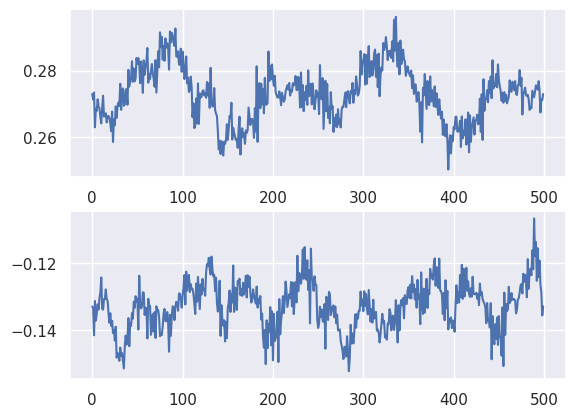

************************************************


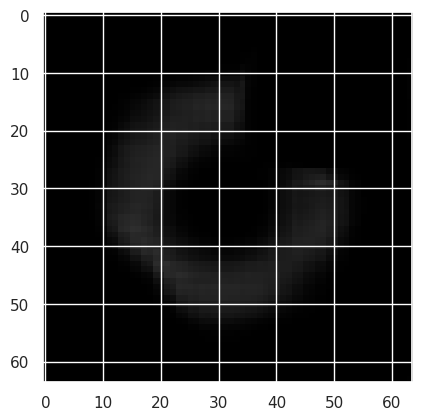

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


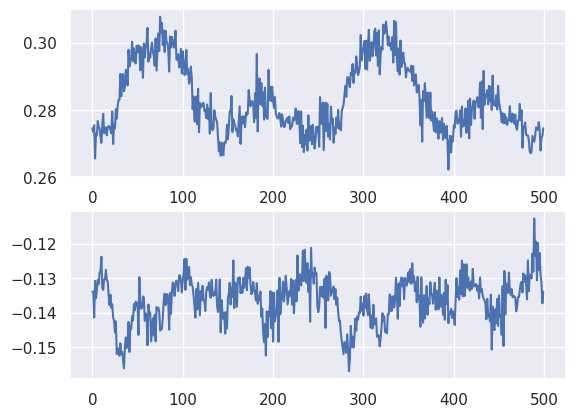

************************************************


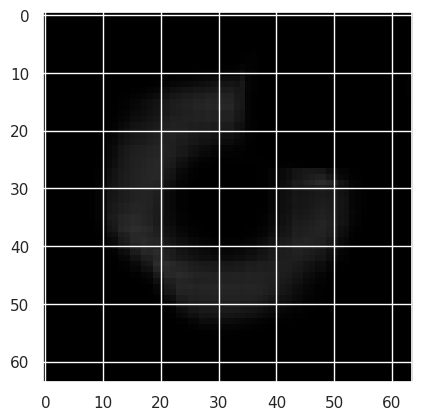

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


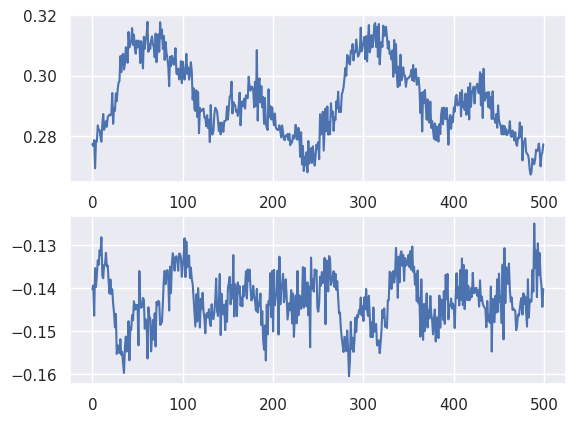

************************************************


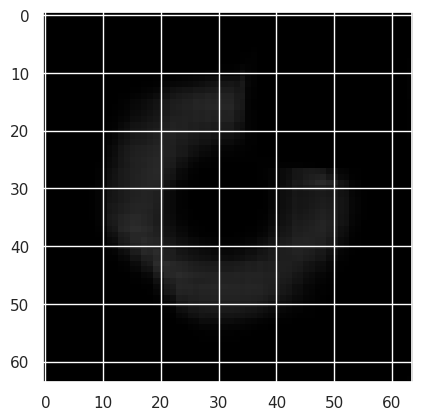

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


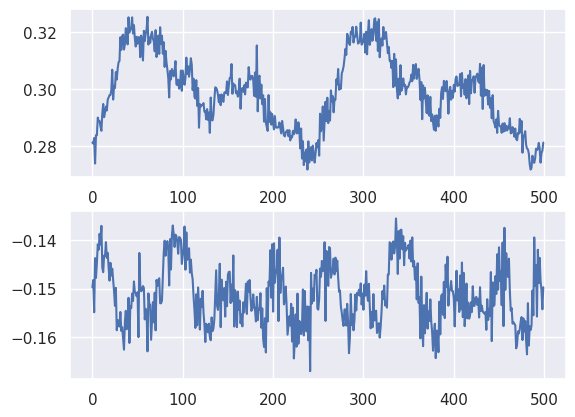

************************************************


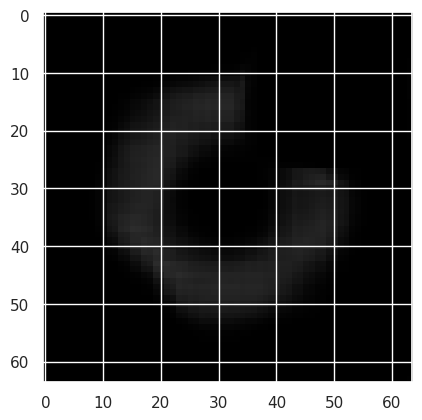

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


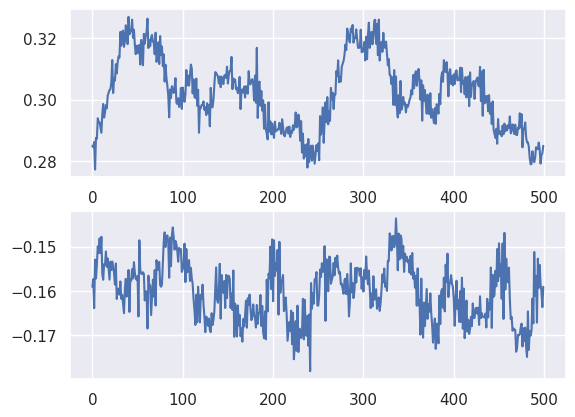

************************************************


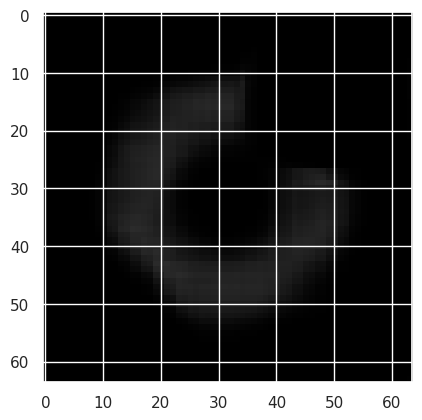

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


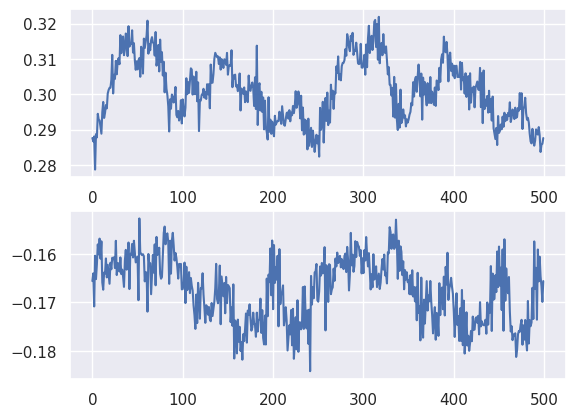

************************************************


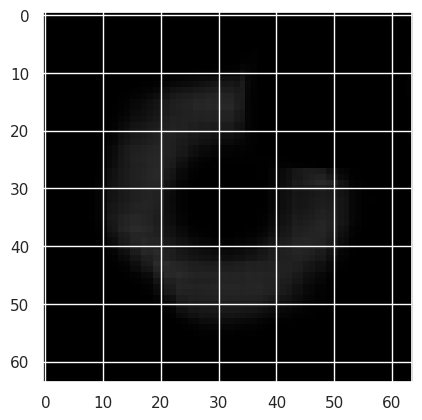

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


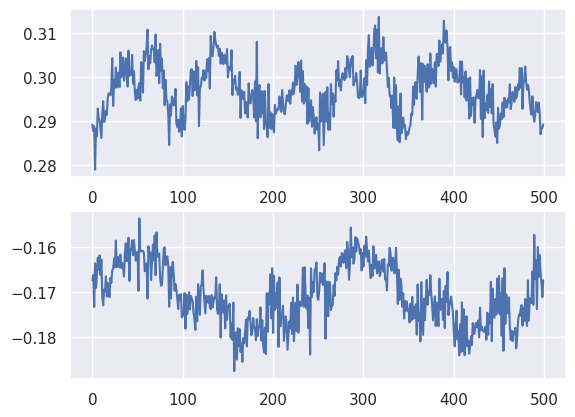

************************************************


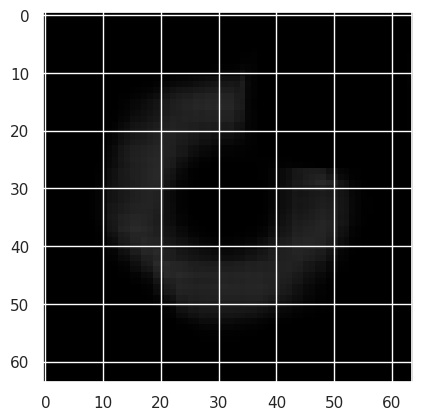

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


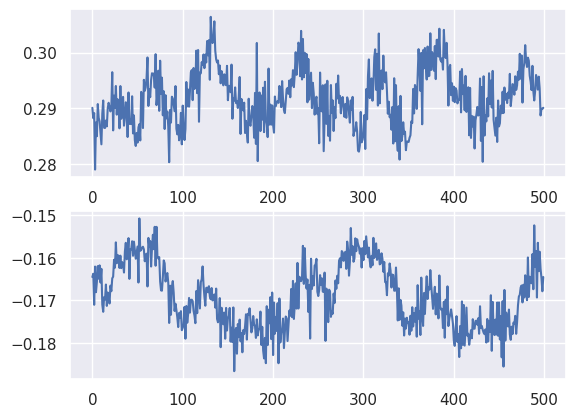

************************************************


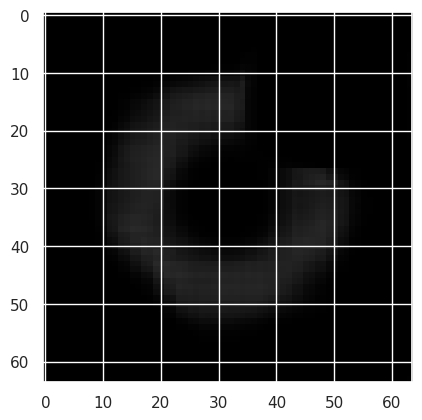

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


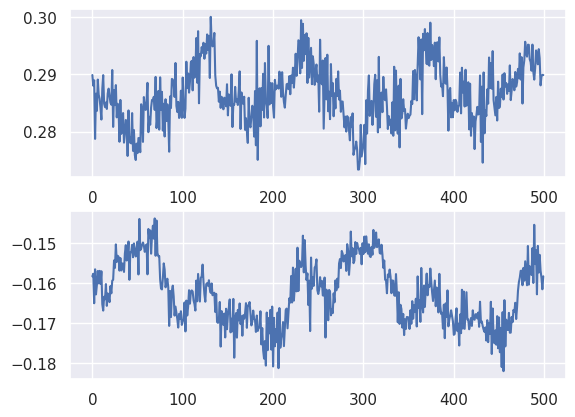

************************************************


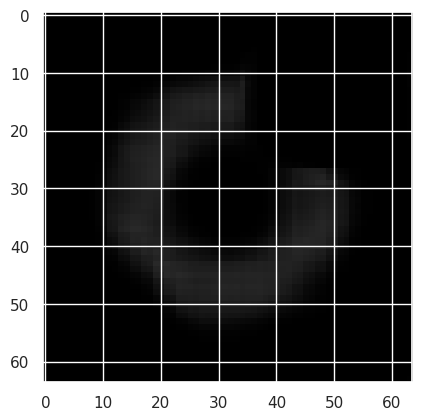

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


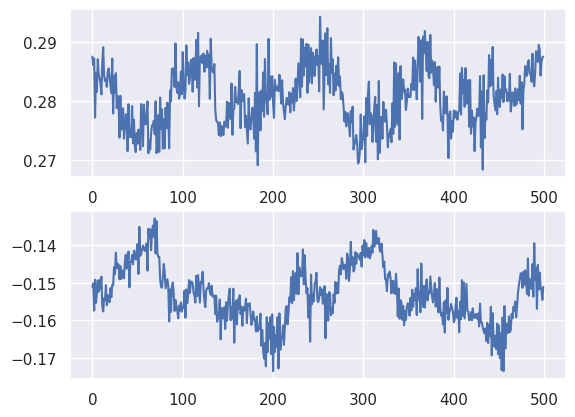

************************************************


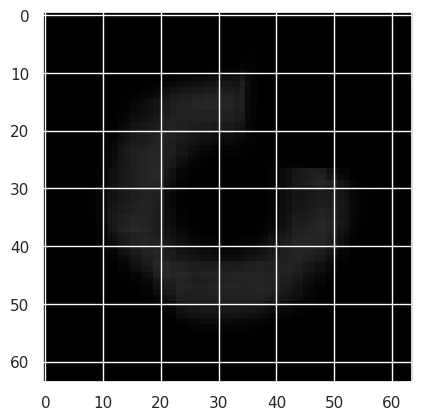

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


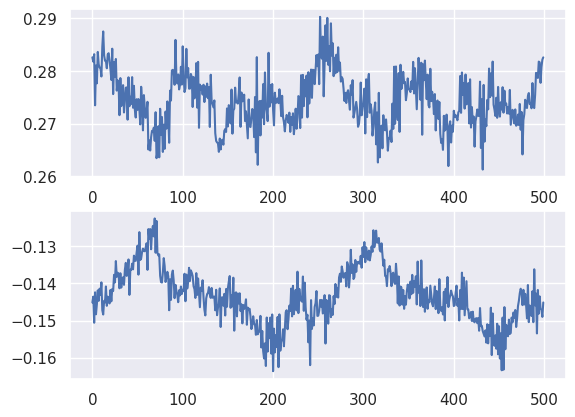

************************************************


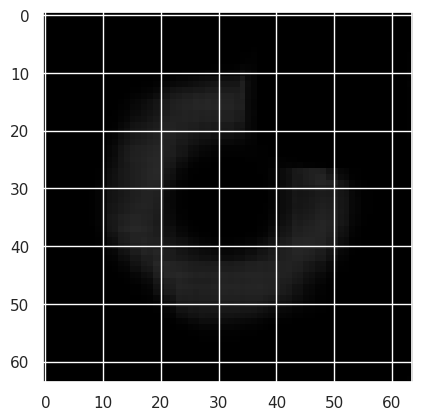

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


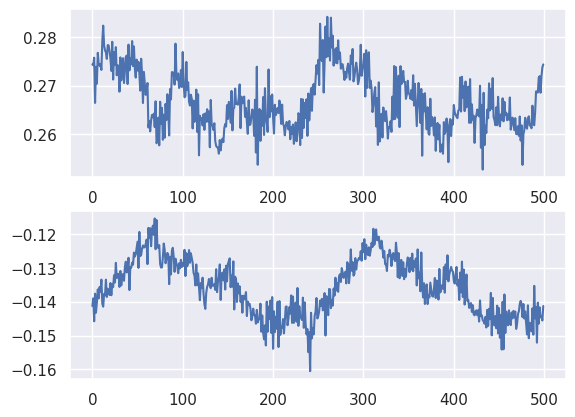

************************************************


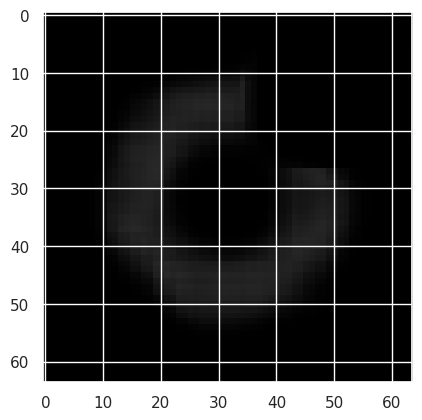

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


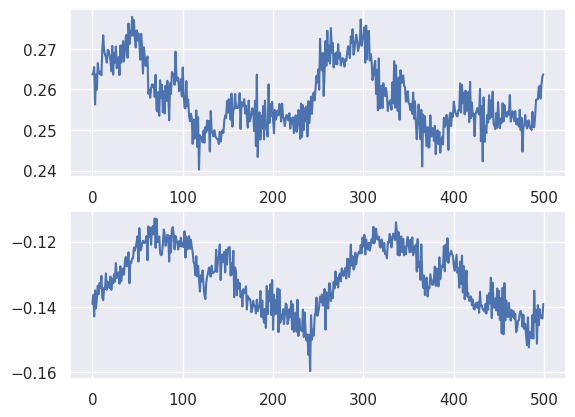

************************************************


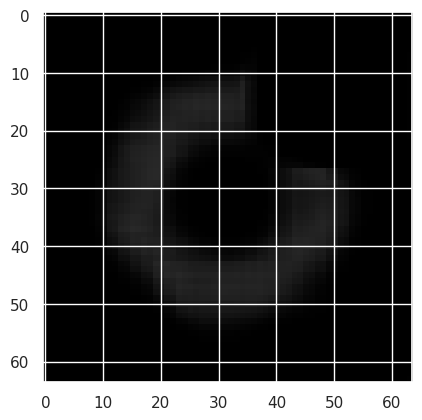

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


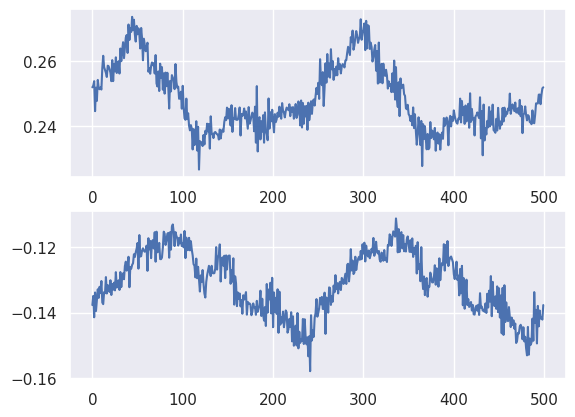

************************************************


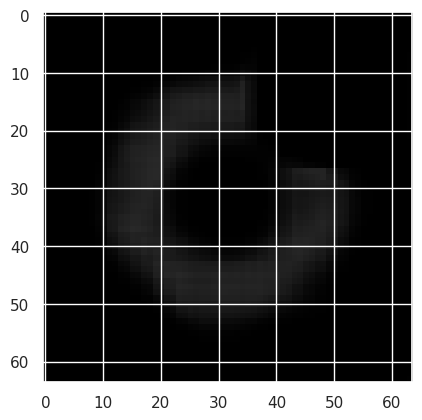

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


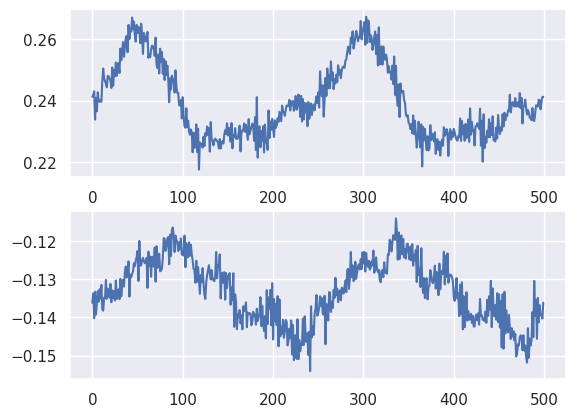

************************************************


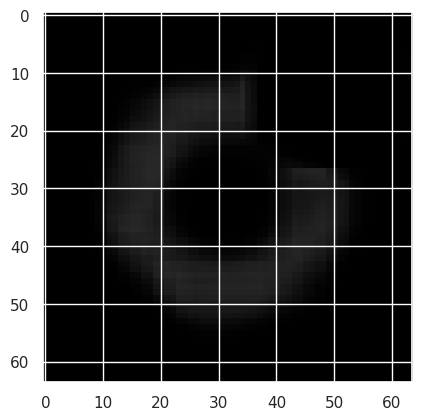

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


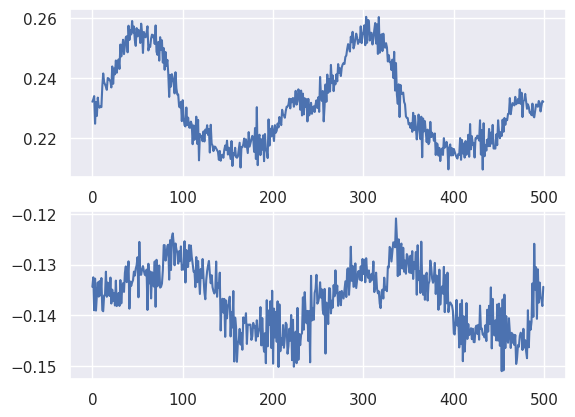

************************************************


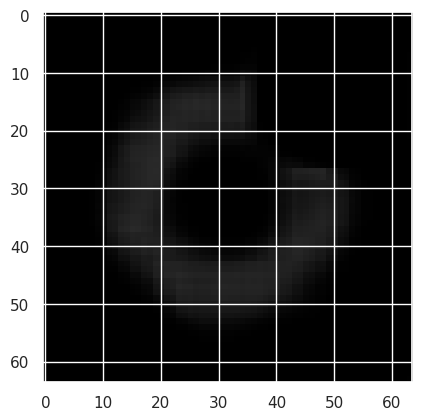

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


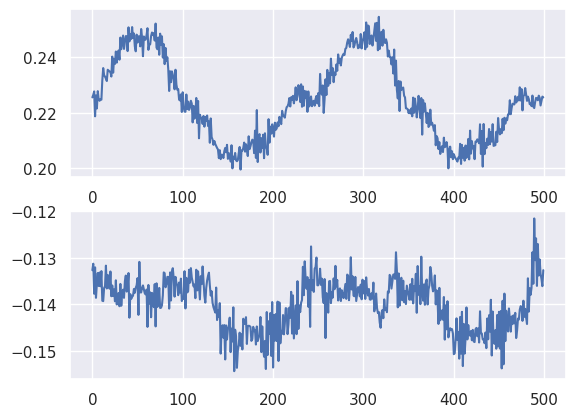

************************************************


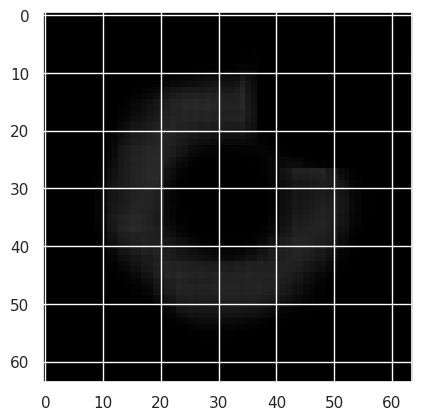

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


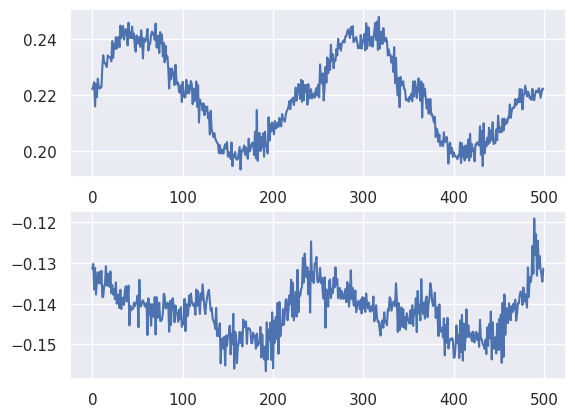

************************************************


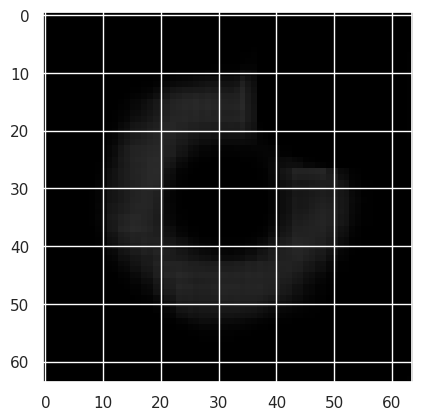

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


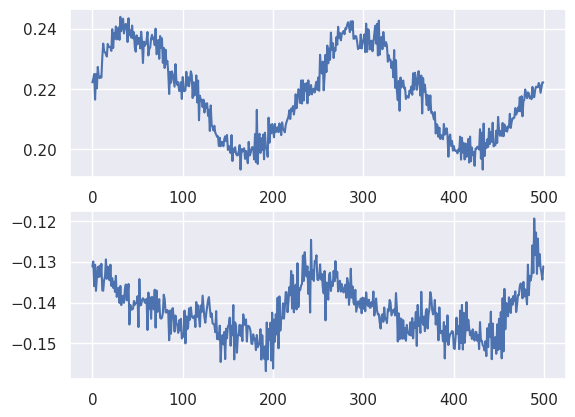

************************************************


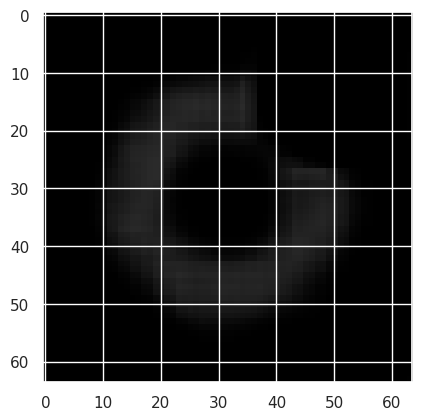

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


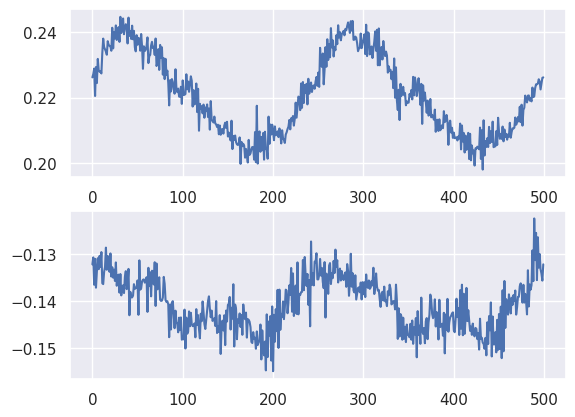

************************************************


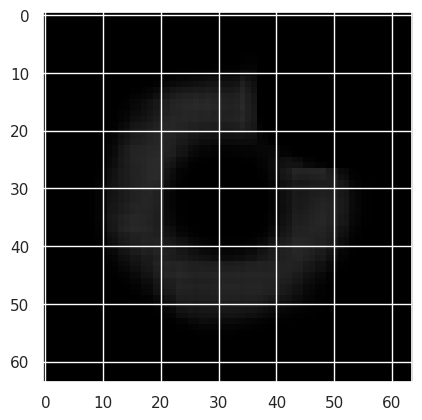

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


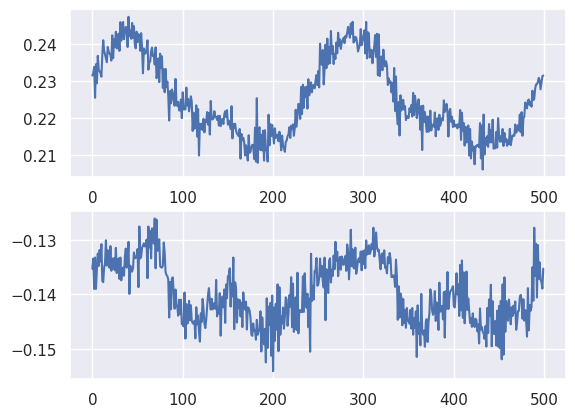

************************************************


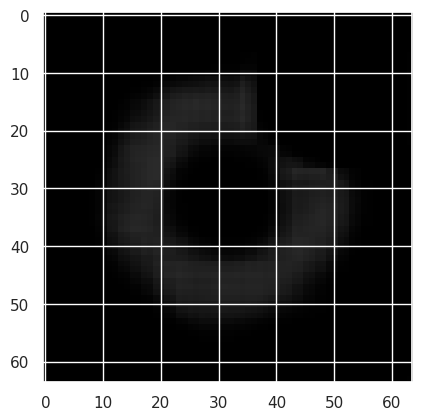

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


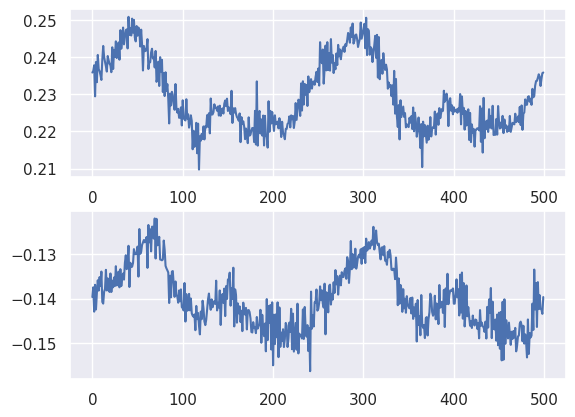

************************************************


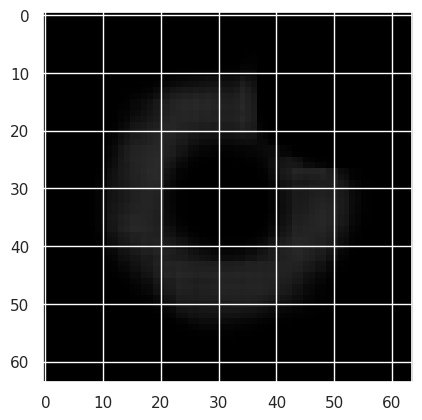

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


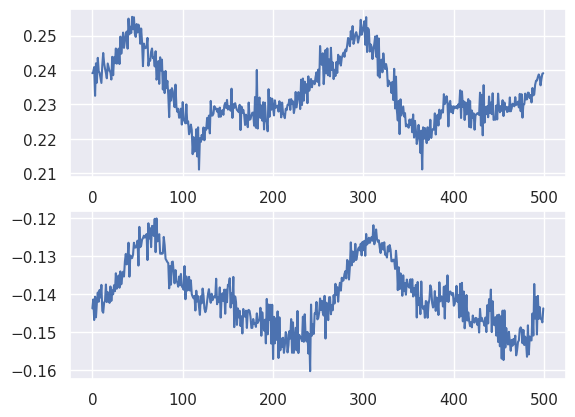

************************************************


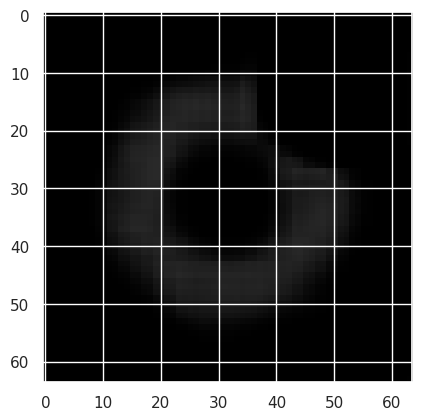

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


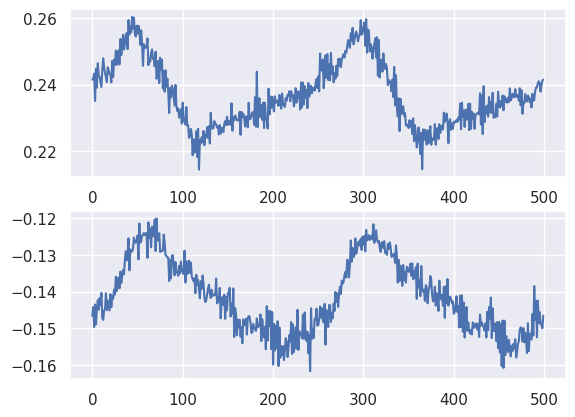

************************************************


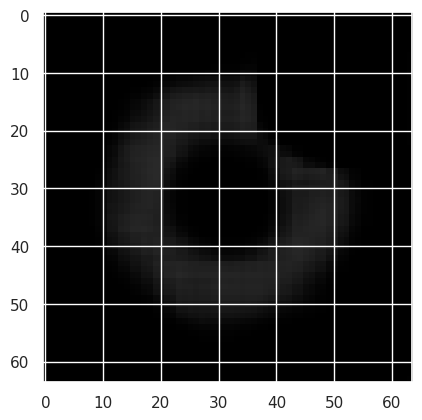

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


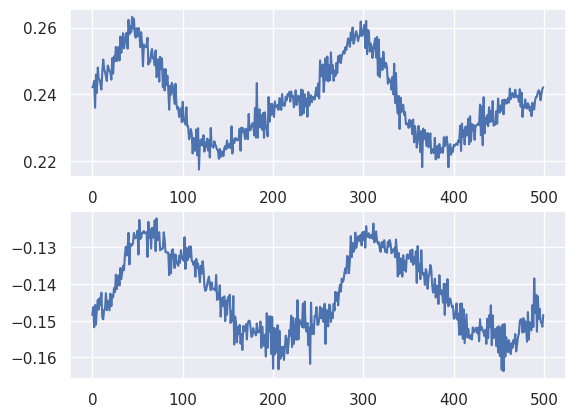

************************************************


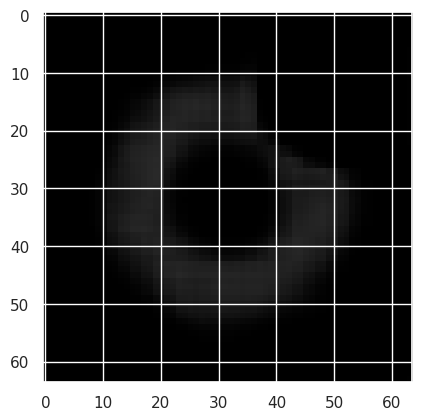

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


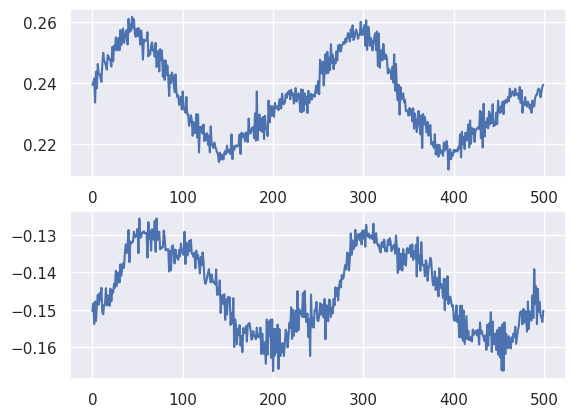

************************************************


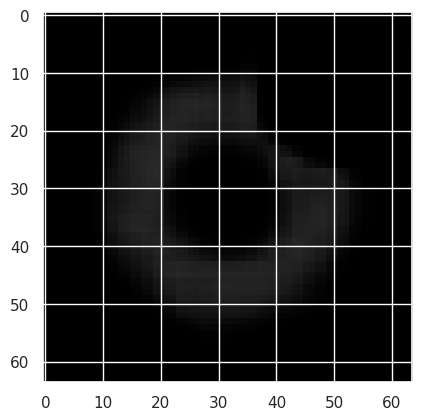

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


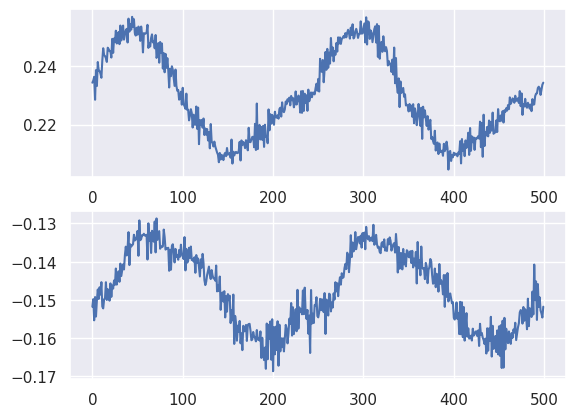

************************************************


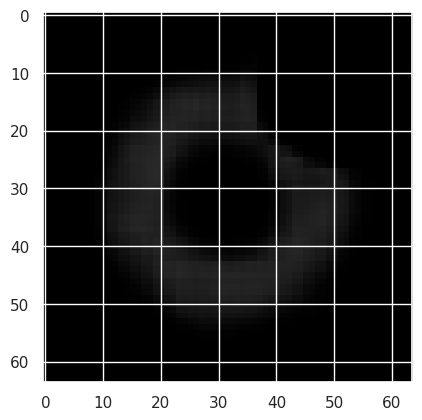

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


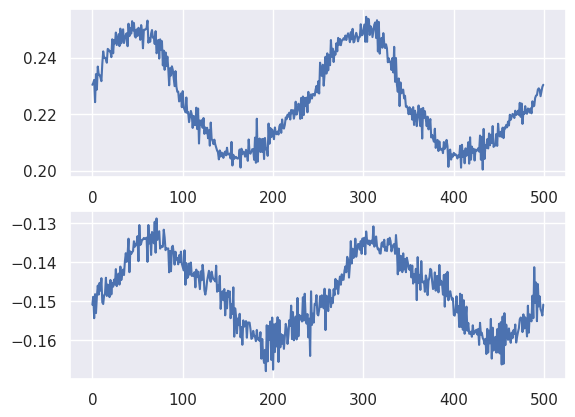

************************************************


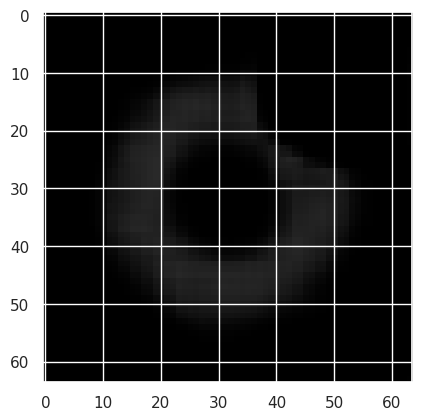

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


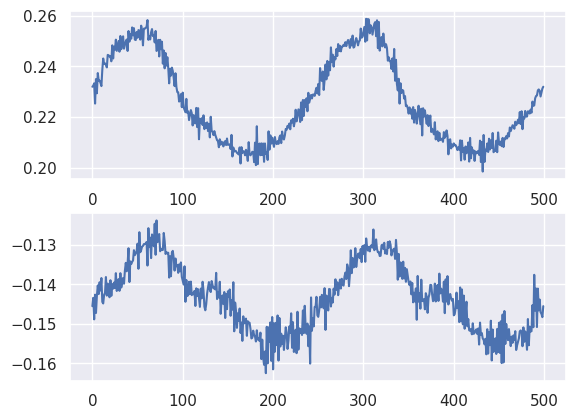

************************************************


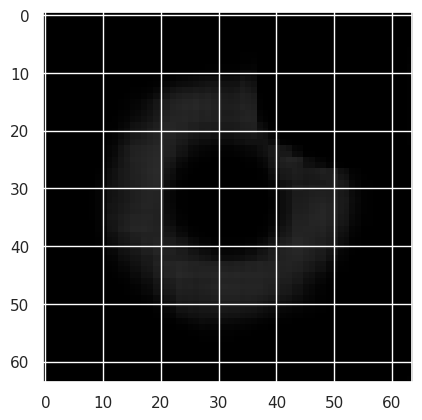

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


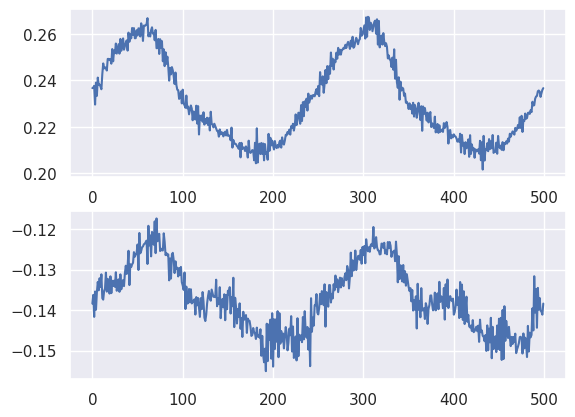

************************************************


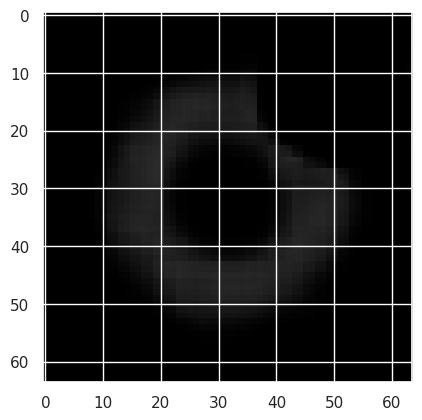

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


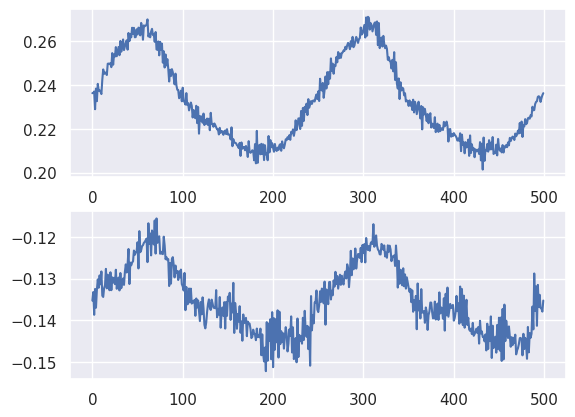

************************************************


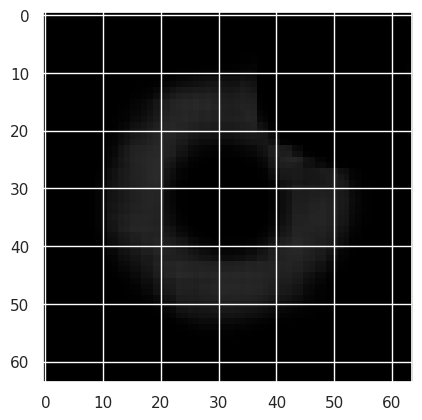

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


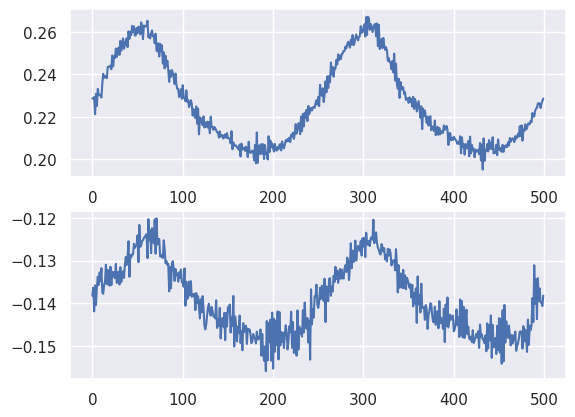

************************************************


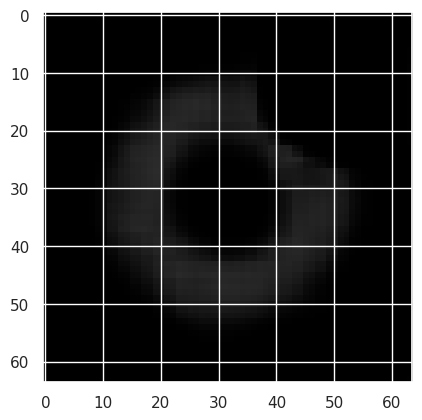

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


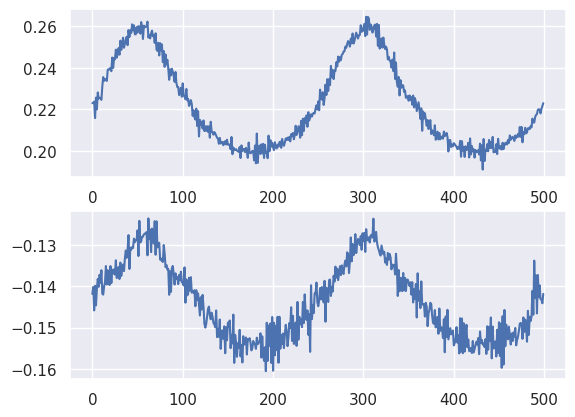

************************************************


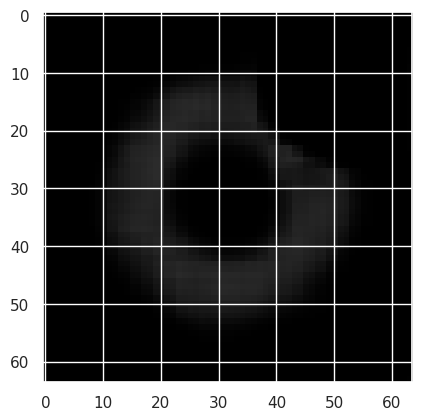

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


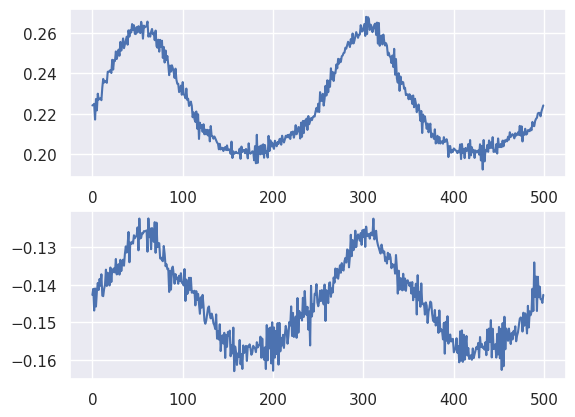

************************************************


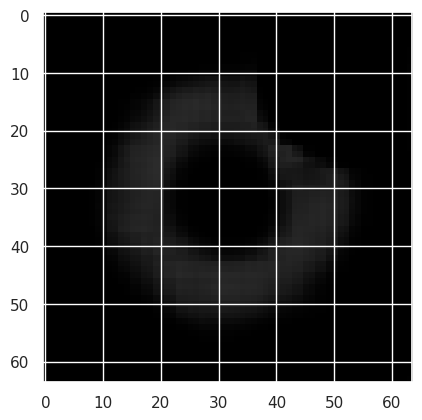

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


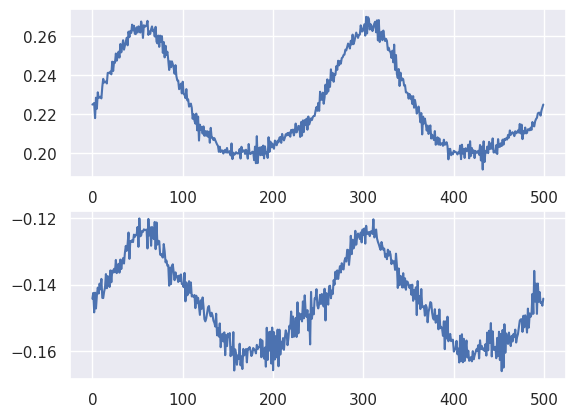

************************************************


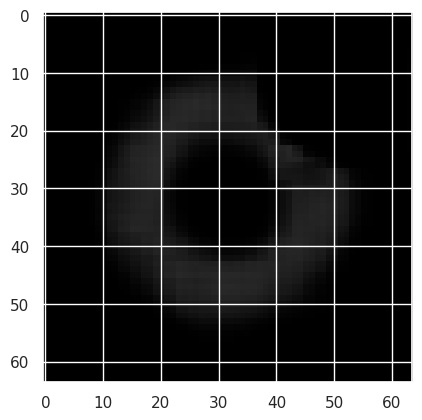

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


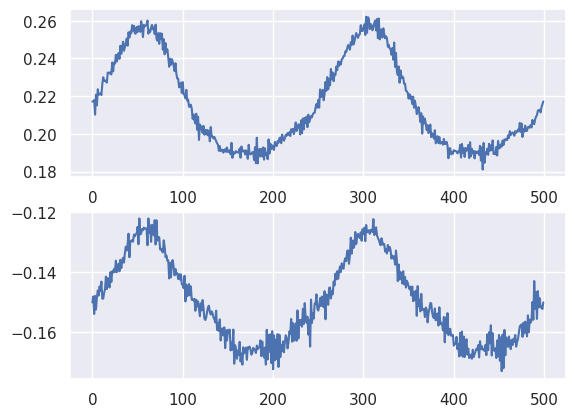

************************************************


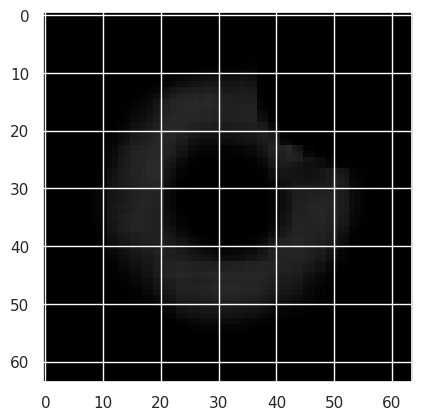

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


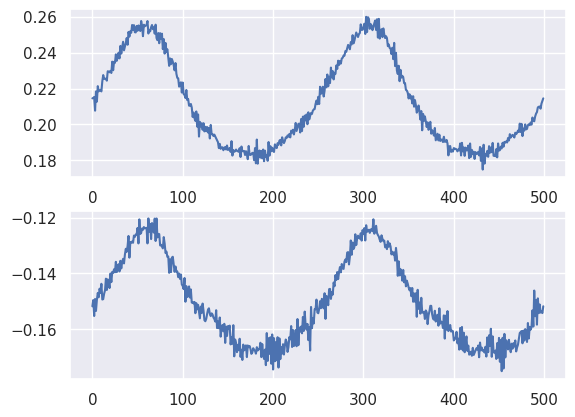

************************************************


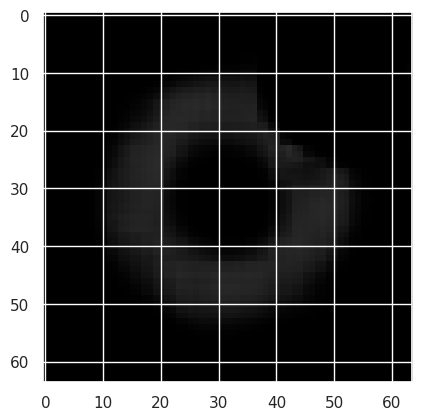

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


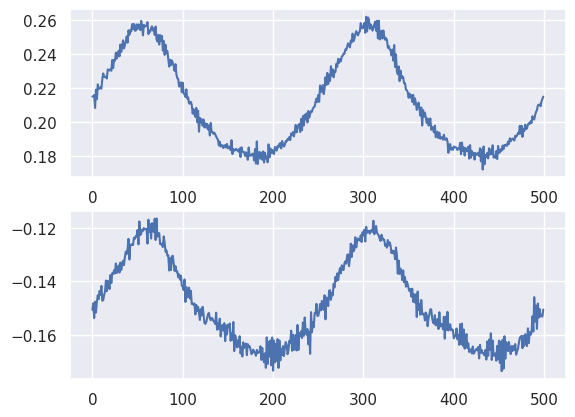

************************************************


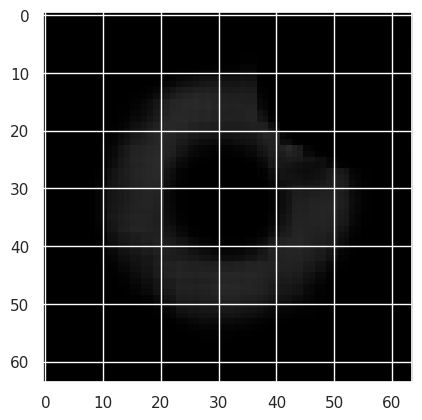

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


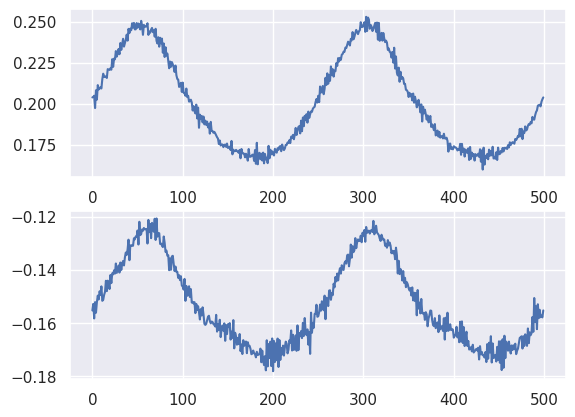

************************************************


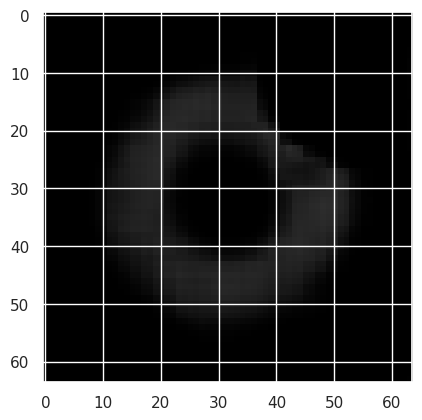

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


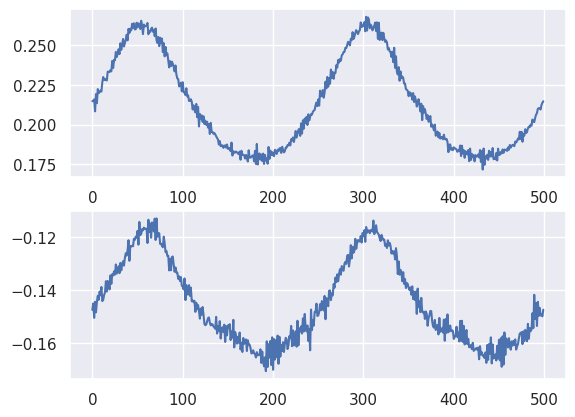

************************************************


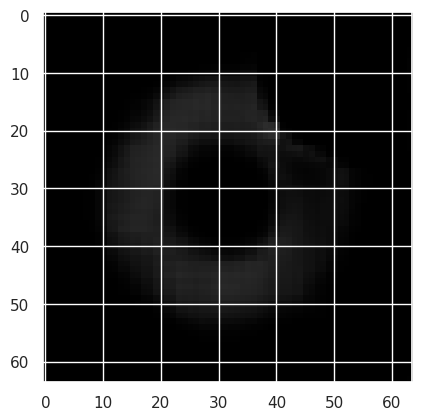

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


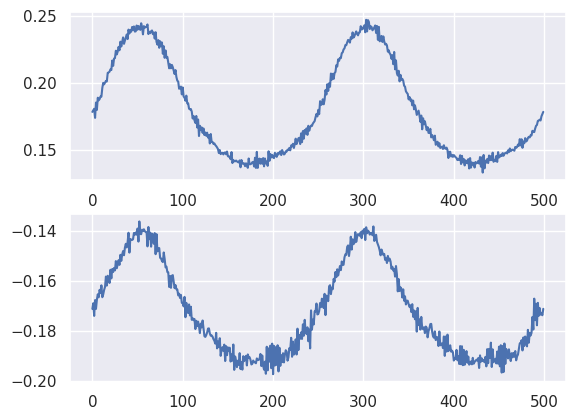

************************************************


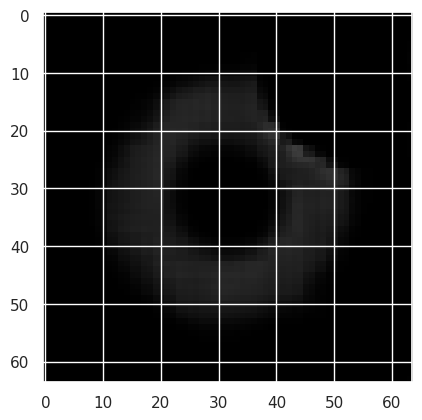

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


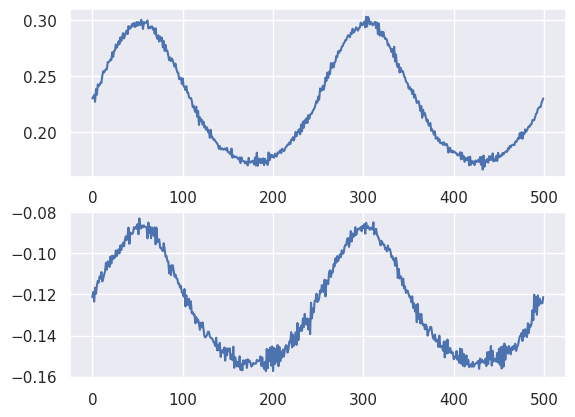

************************************************


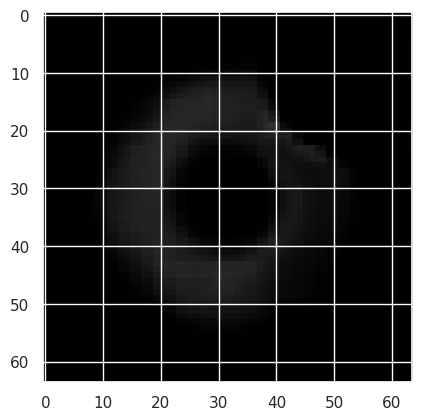

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


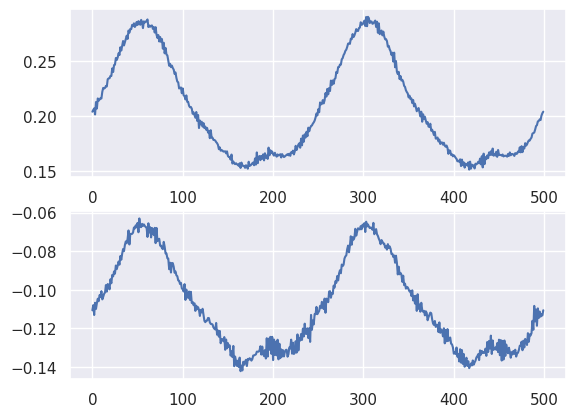

************************************************


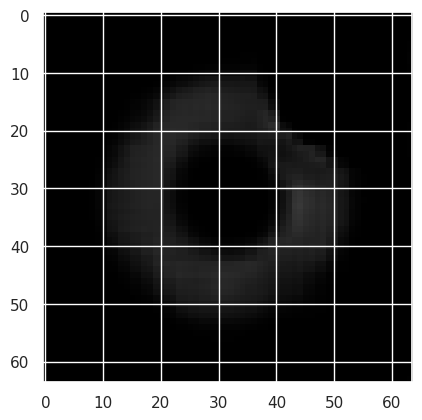

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


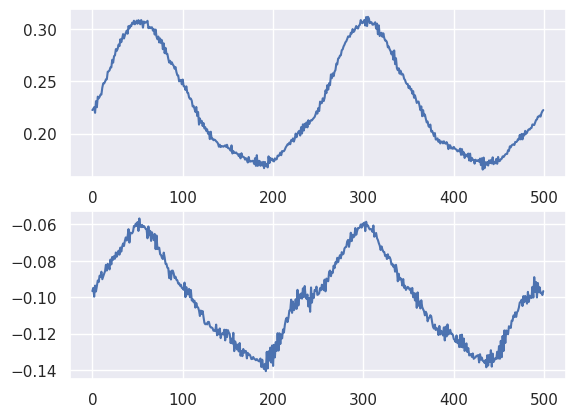

************************************************


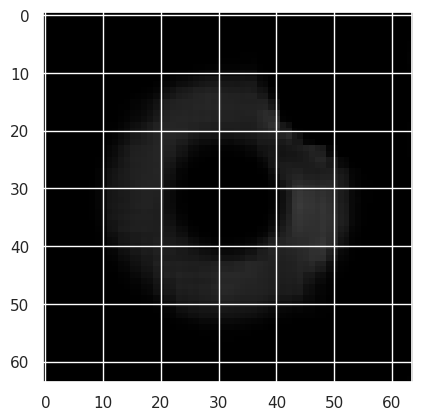

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


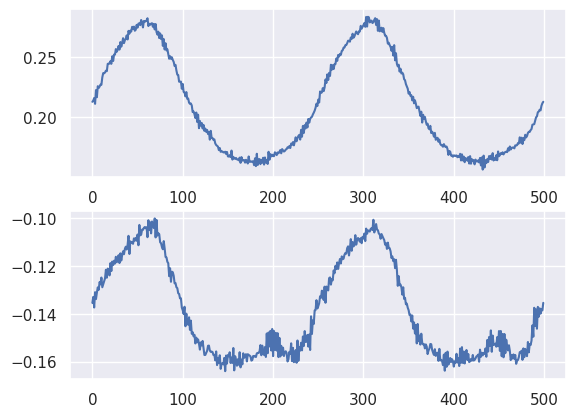

************************************************


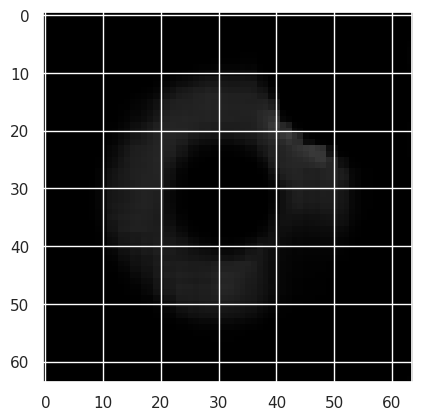

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


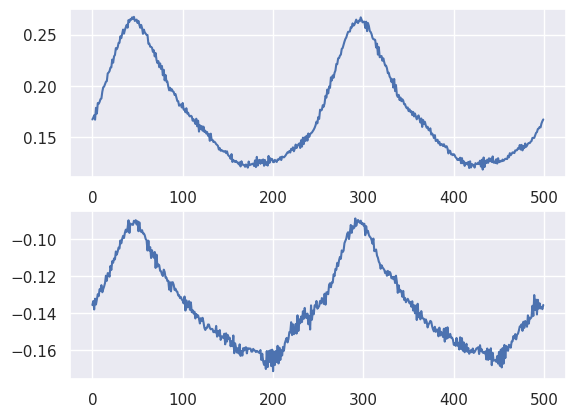

************************************************


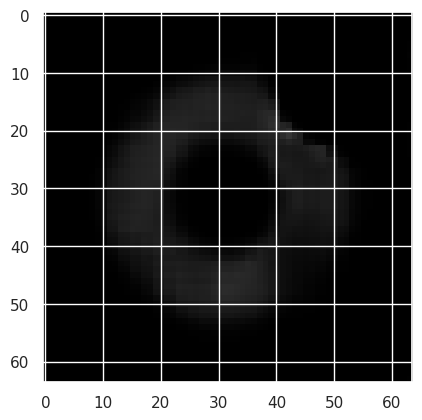

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


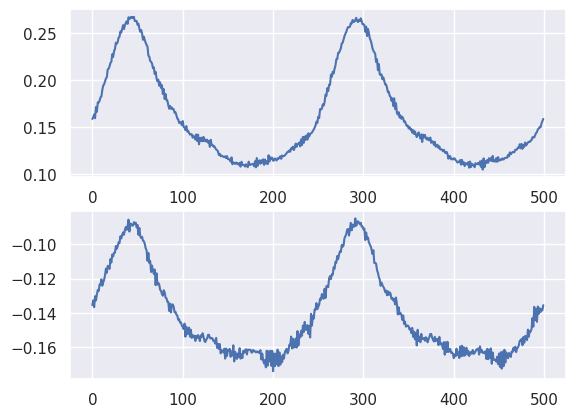

************************************************


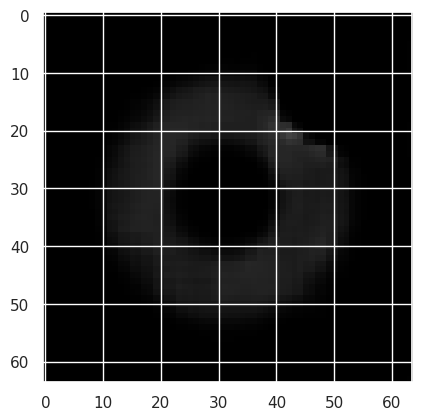

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


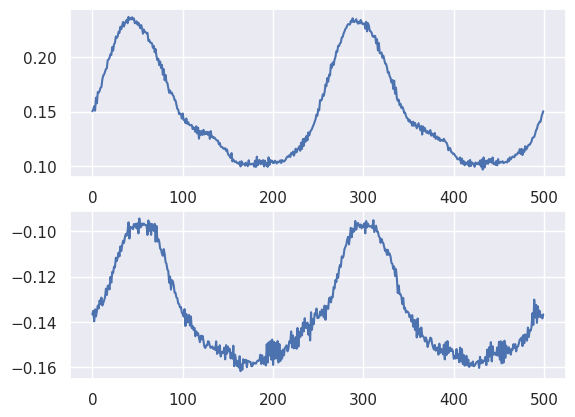

************************************************


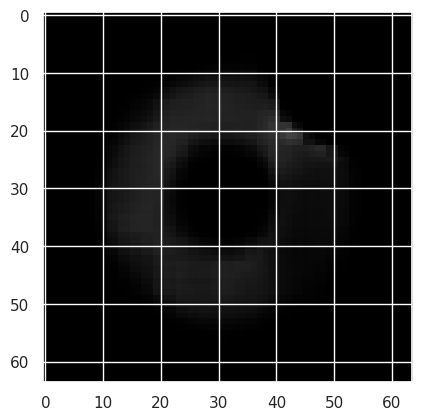

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


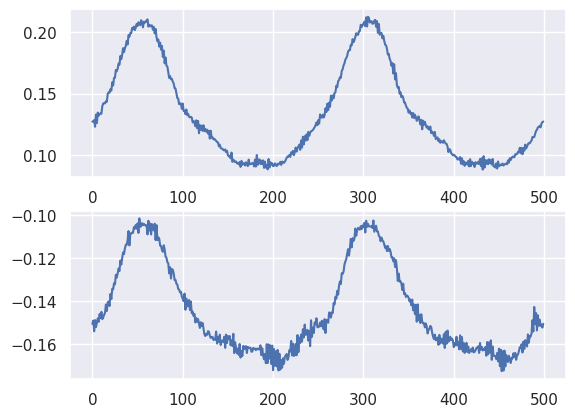

************************************************


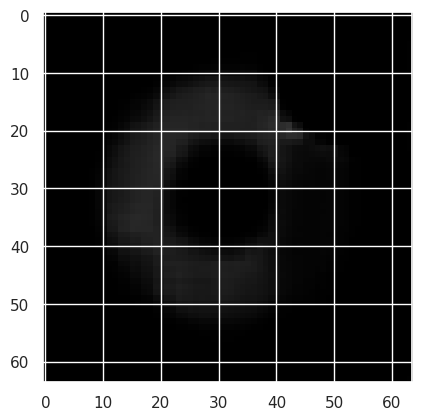

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


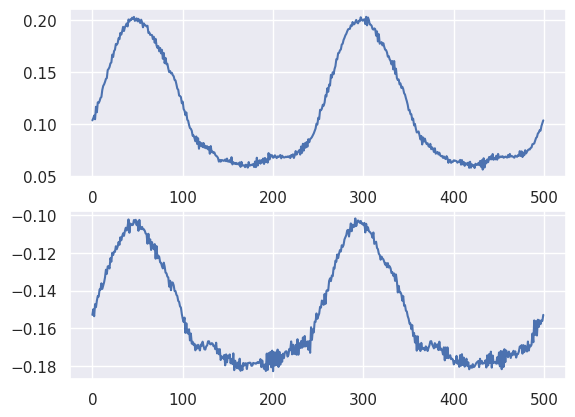

************************************************


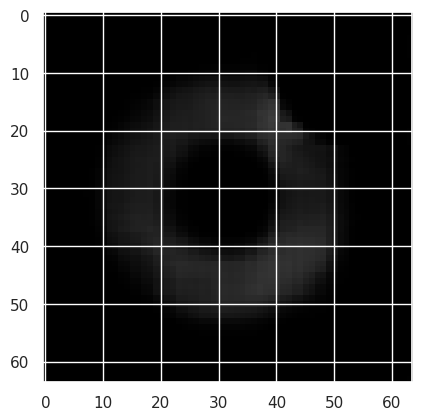

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


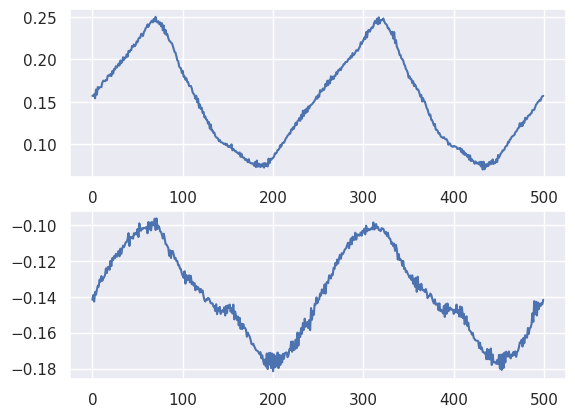

************************************************


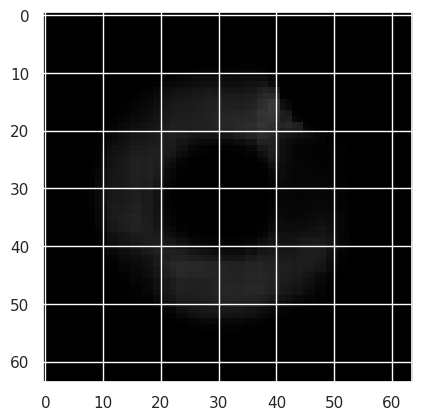

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


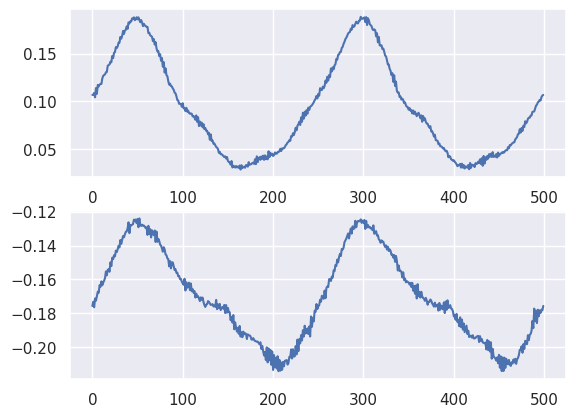

************************************************


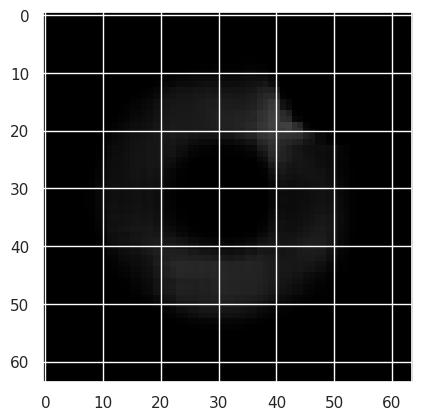

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


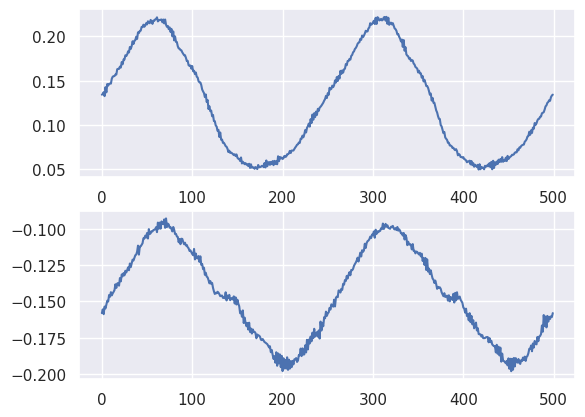

************************************************


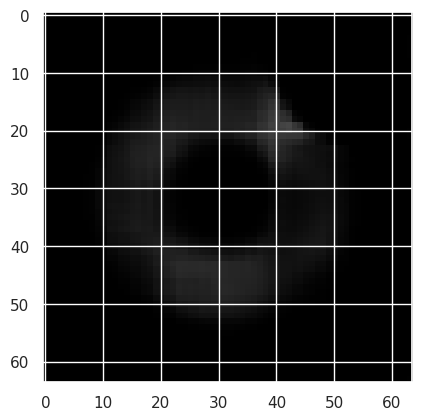

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


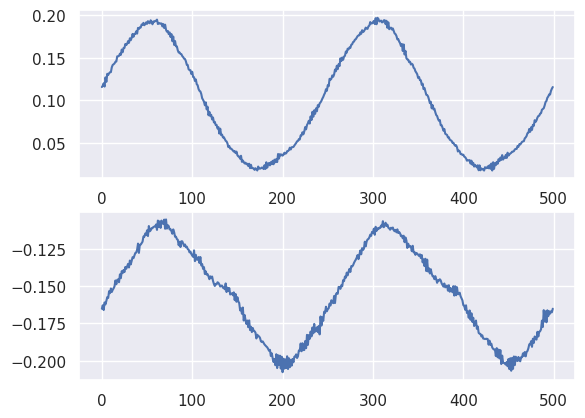

************************************************


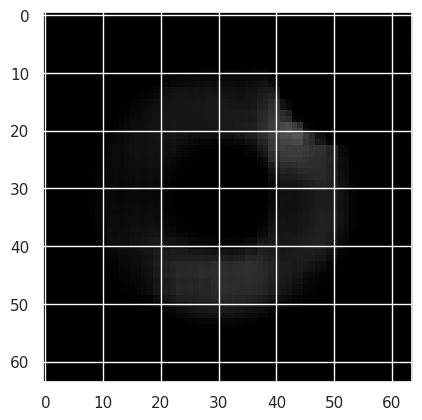

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


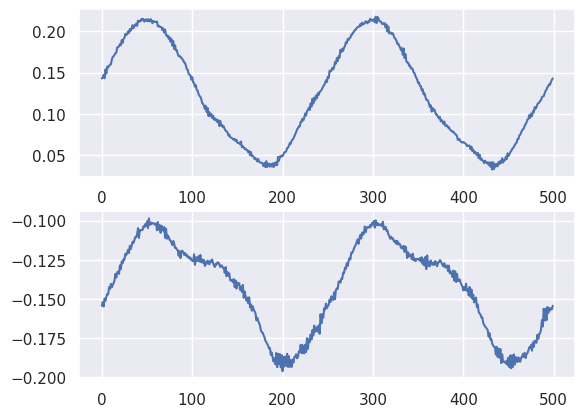

************************************************


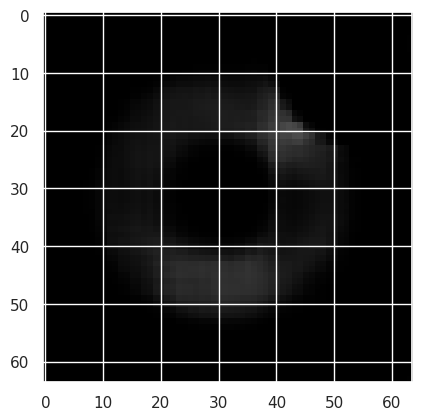

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


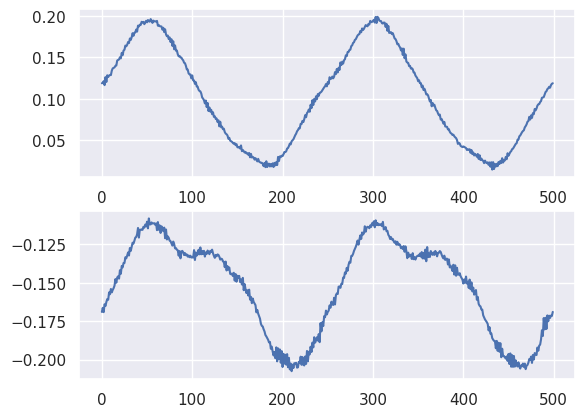

************************************************


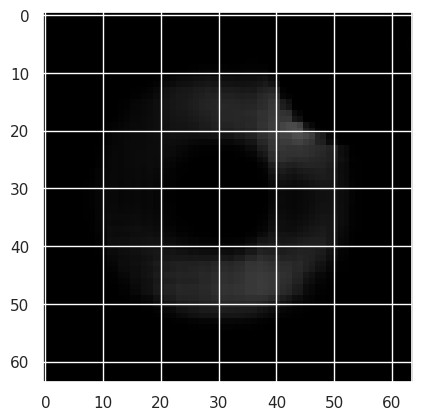

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


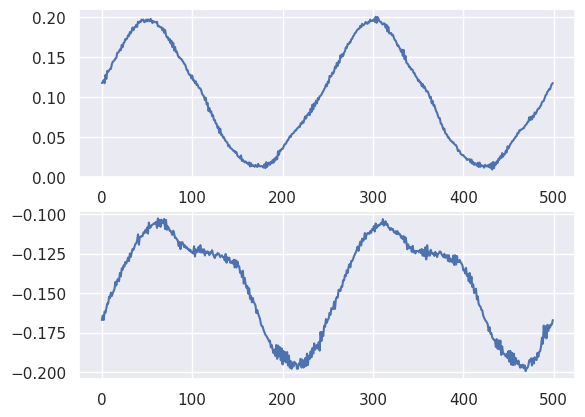

************************************************


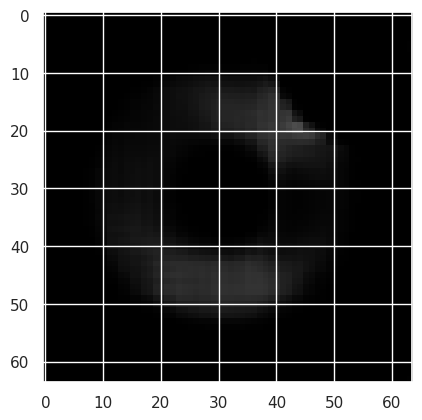

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


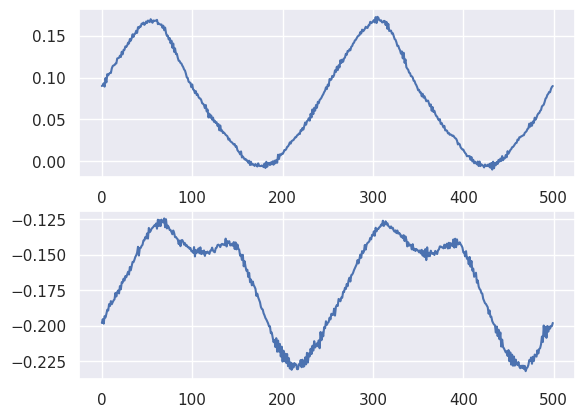

************************************************


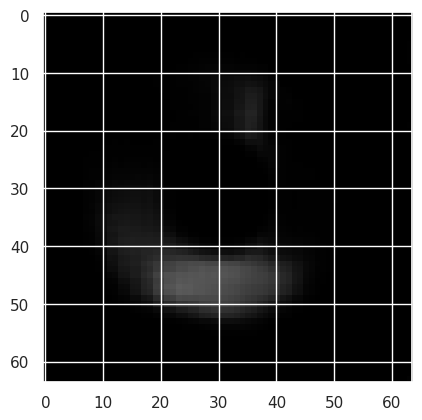

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


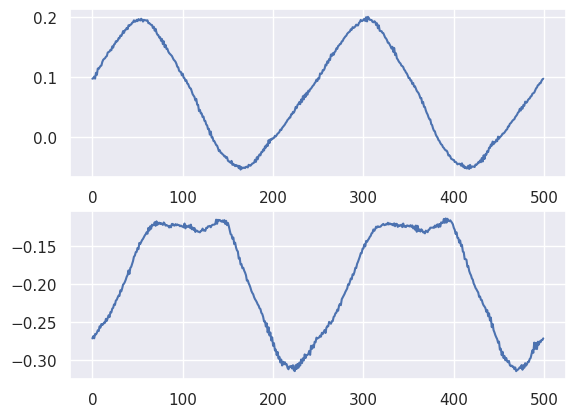

************************************************


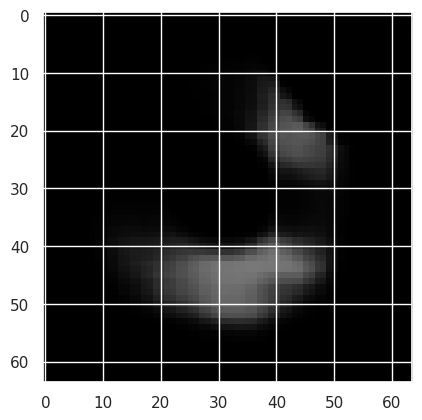

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


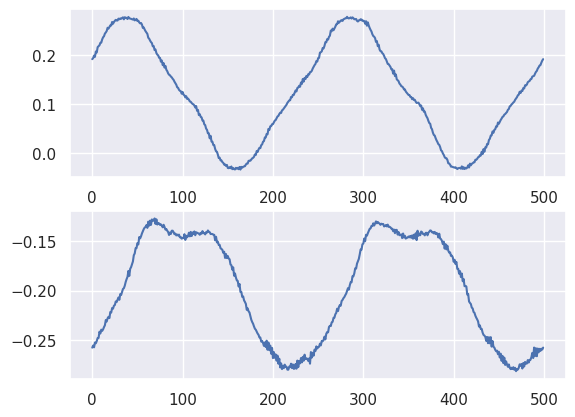

************************************************


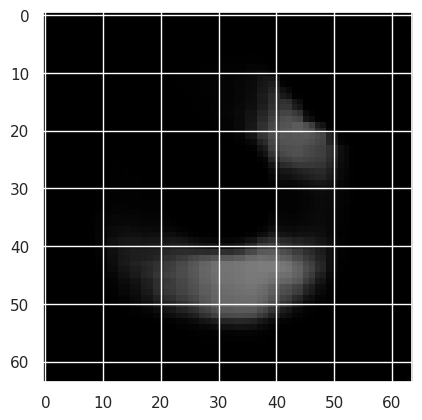

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


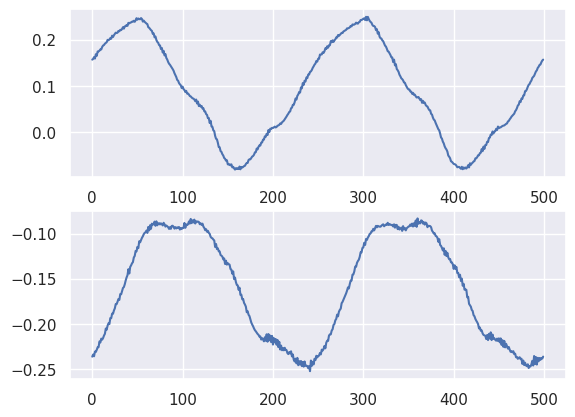

************************************************


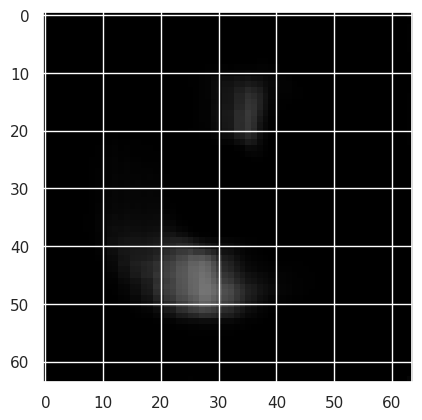

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


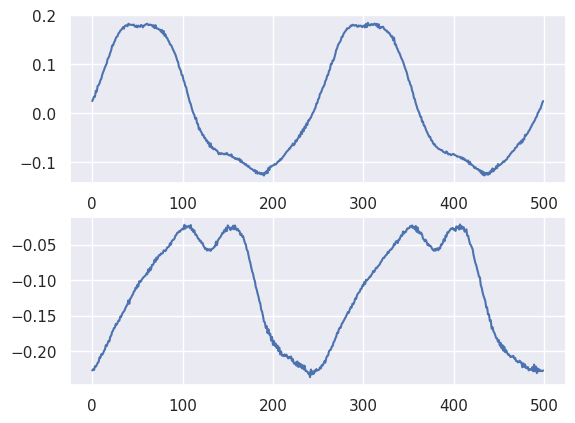

************************************************


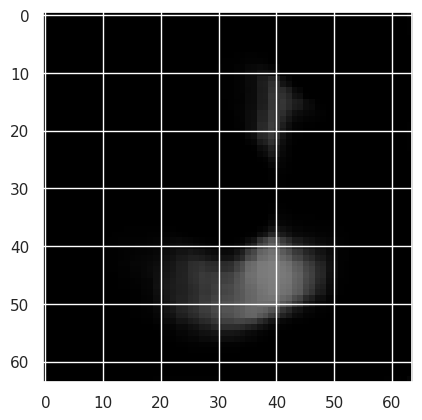

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


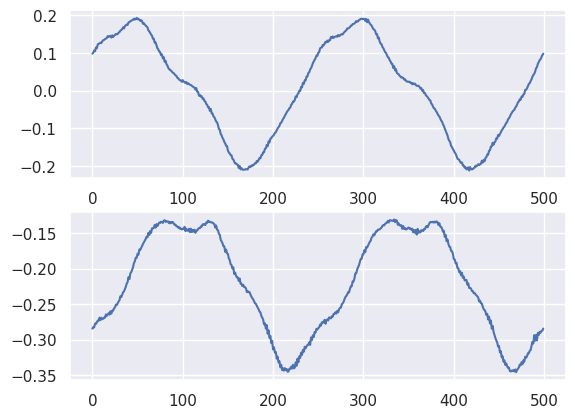

************************************************


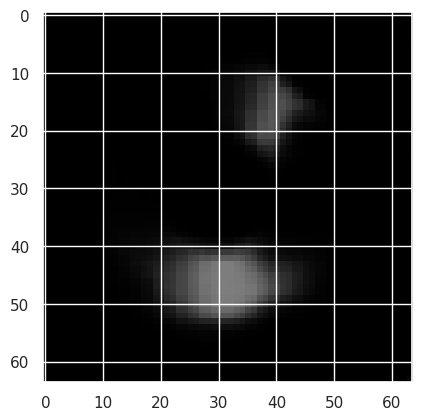

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


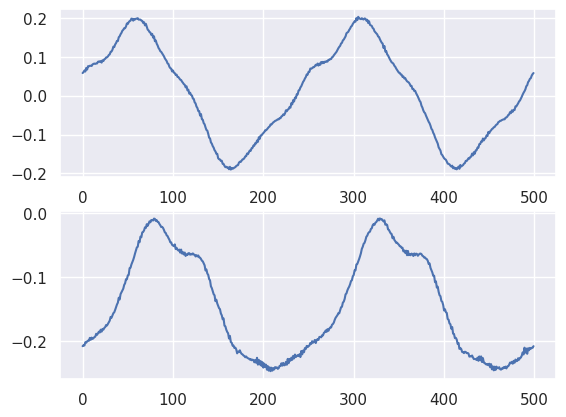

************************************************


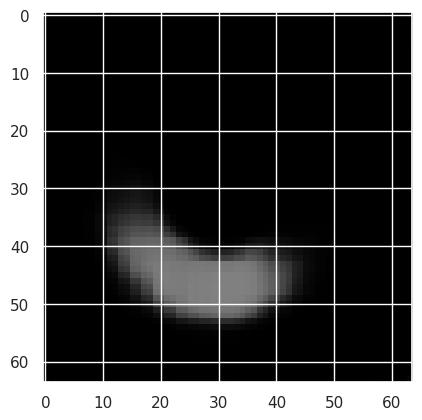

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


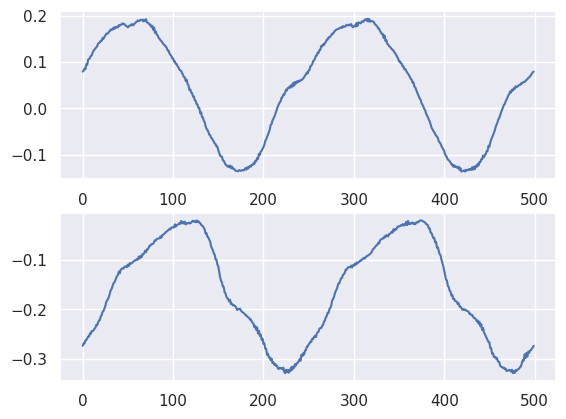

************************************************


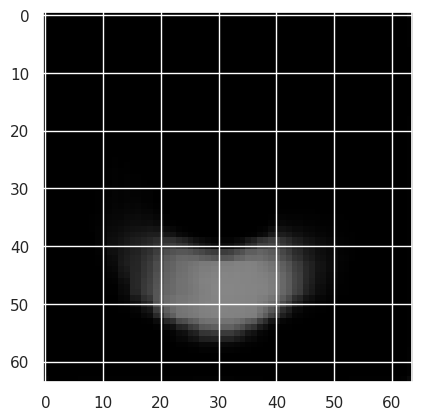

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


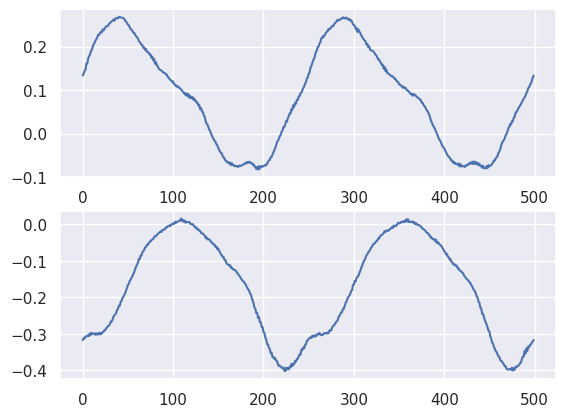

************************************************


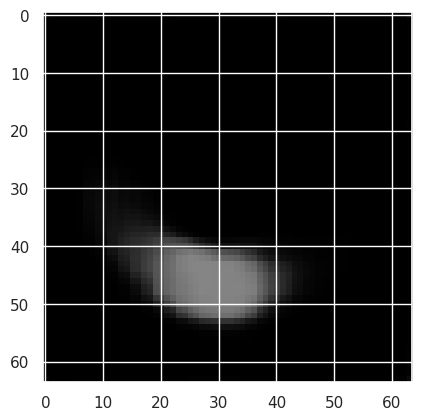

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


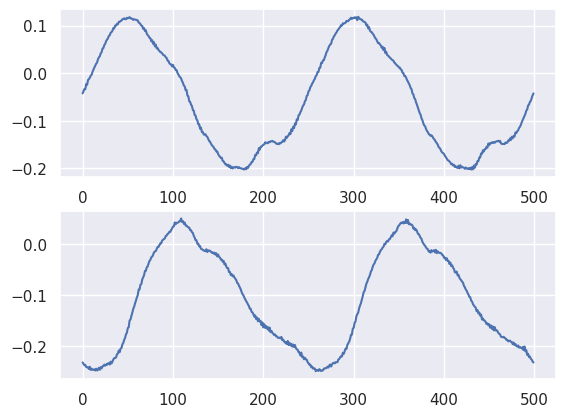

************************************************


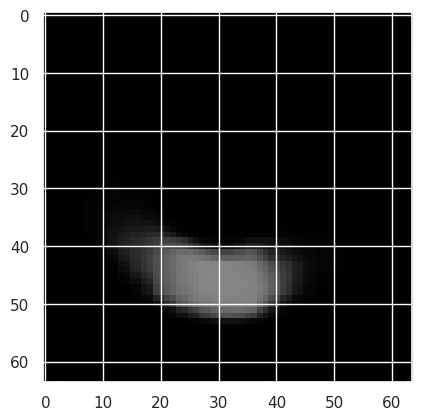

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


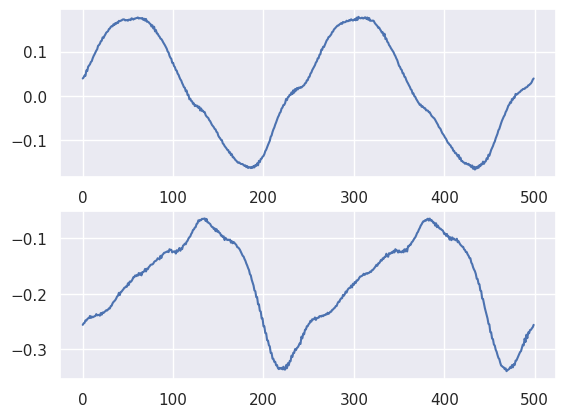

************************************************


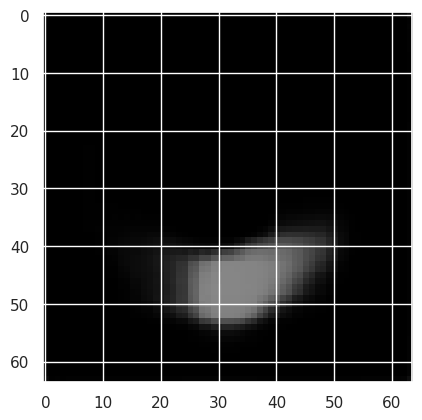

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


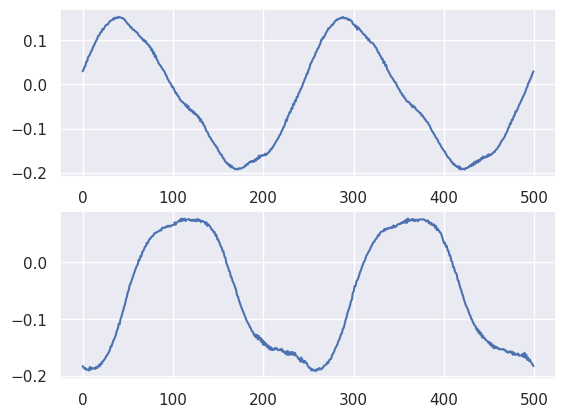

************************************************


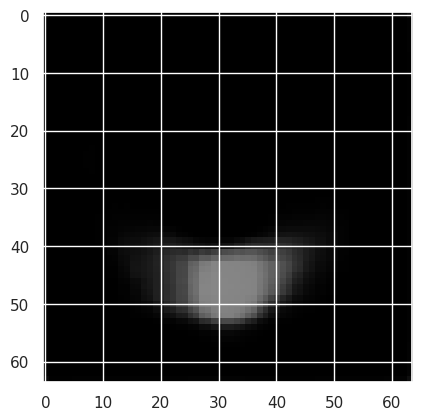

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


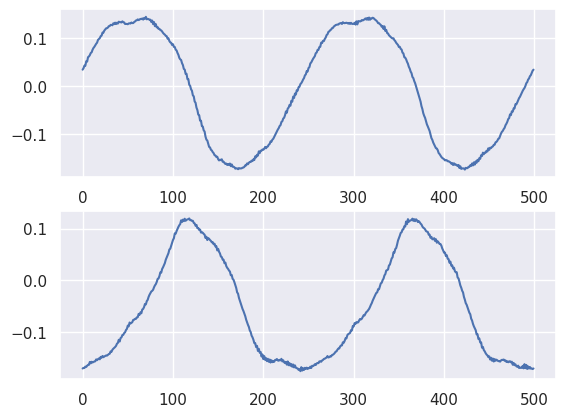

************************************************


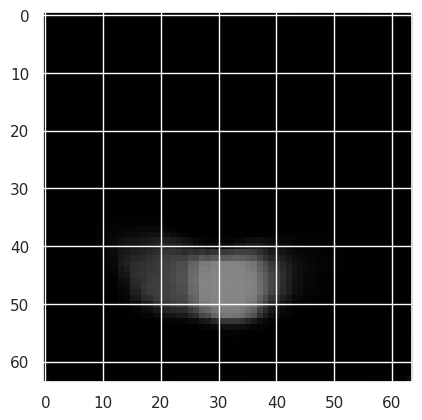

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


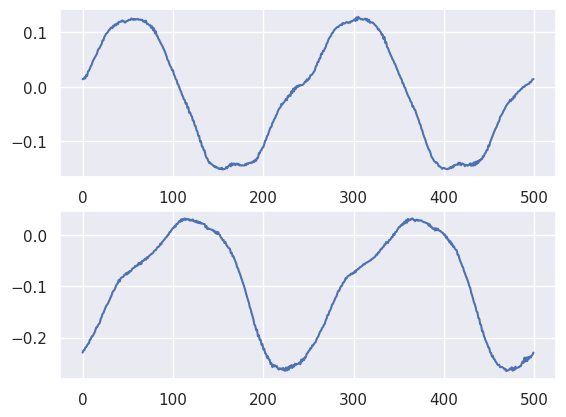

************************************************


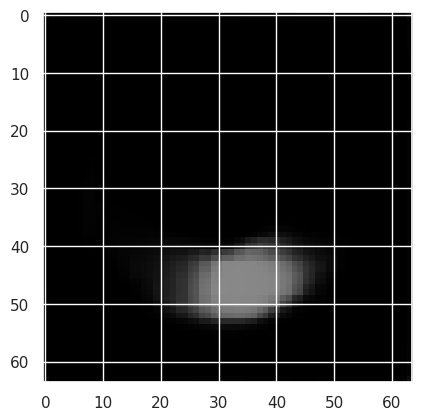

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


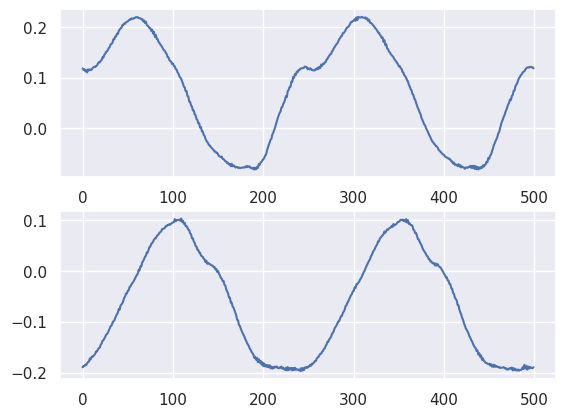

************************************************


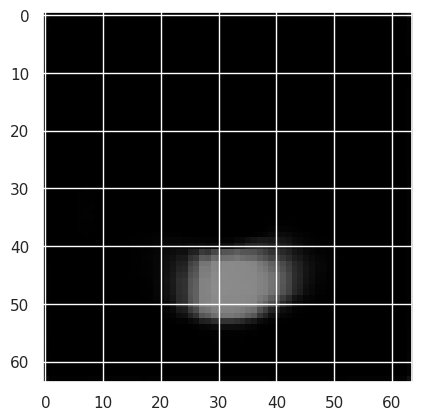

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


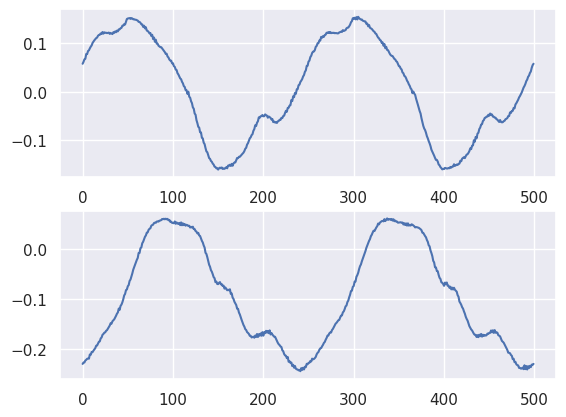

************************************************


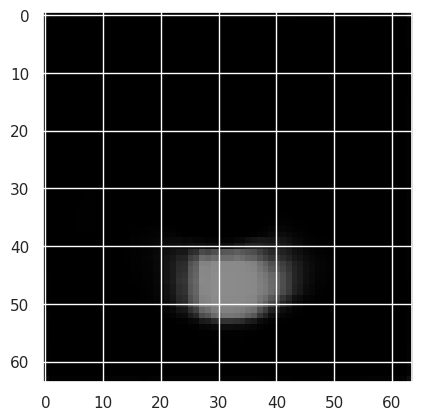

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


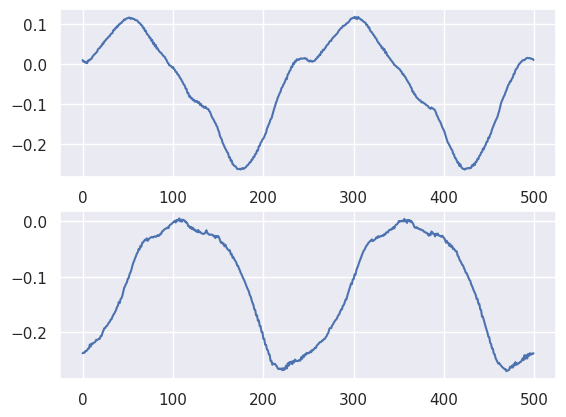

************************************************


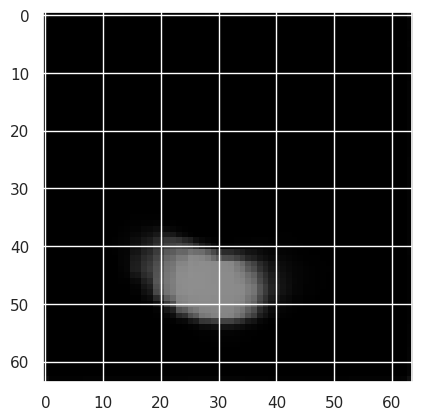

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


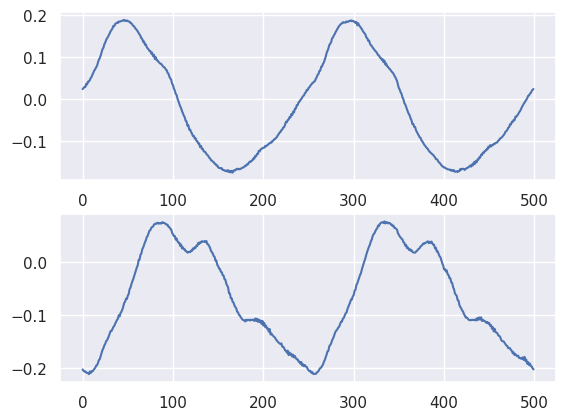

************************************************


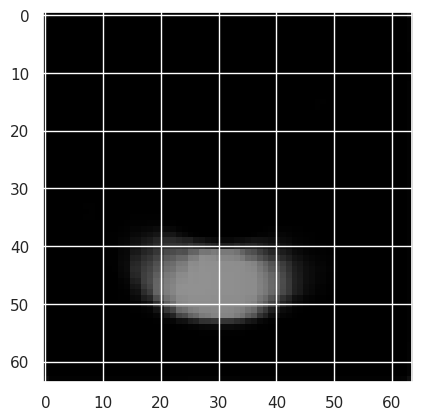

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


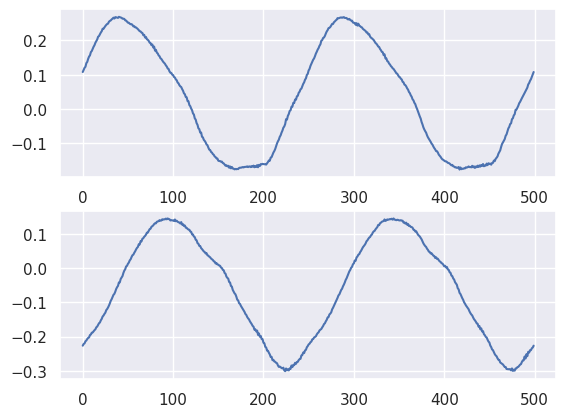

************************************************


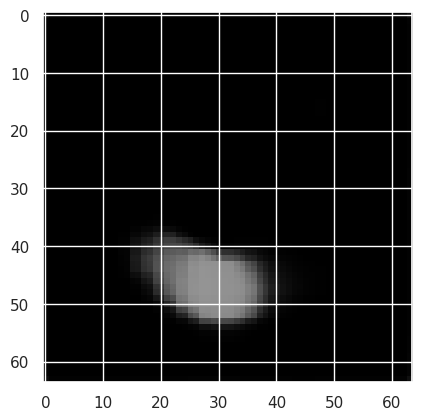

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


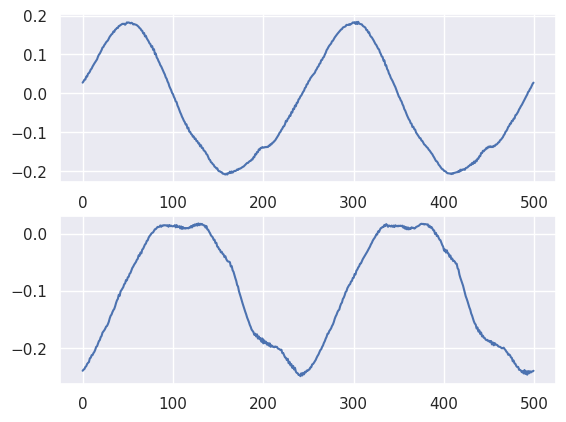

************************************************


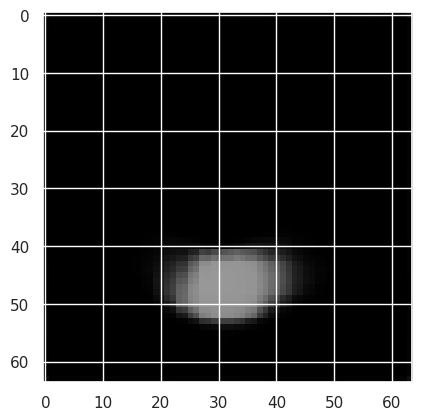

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


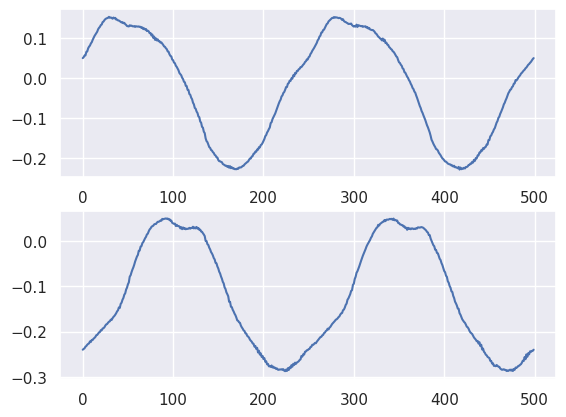

************************************************


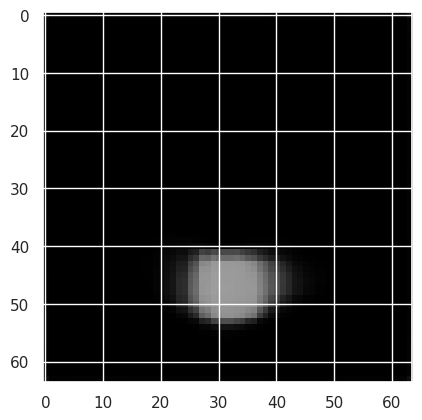

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


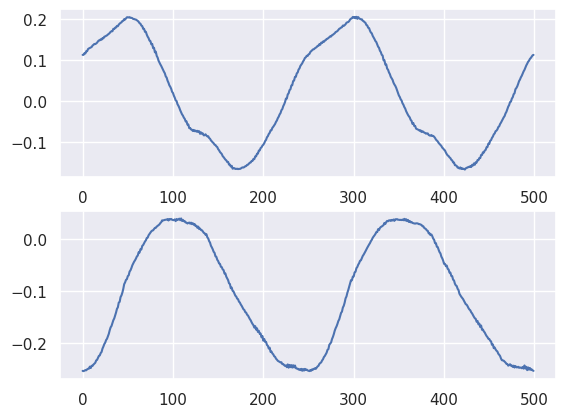

************************************************


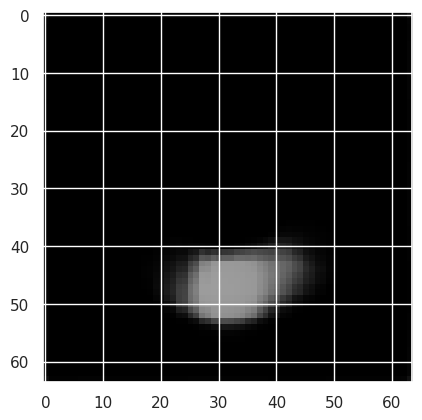

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


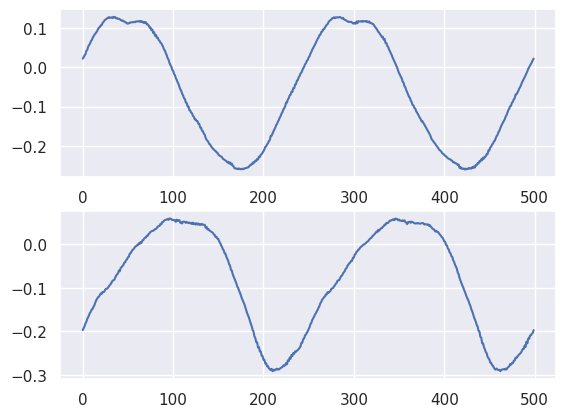

************************************************


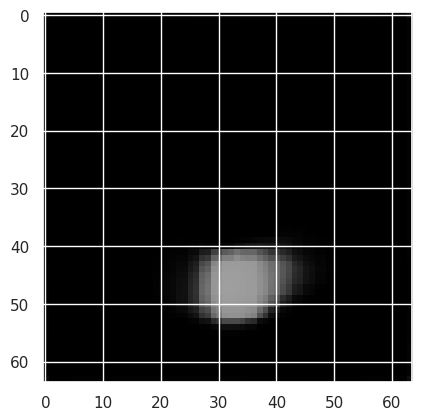

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


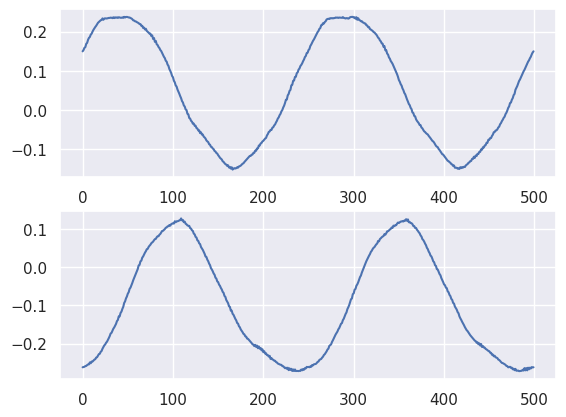

************************************************


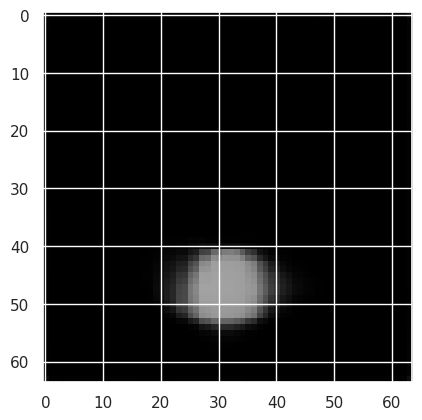

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


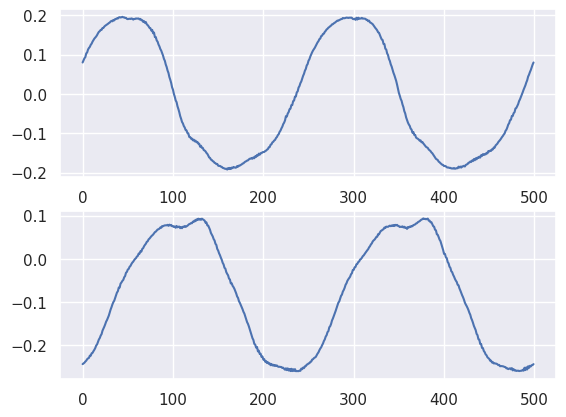

************************************************


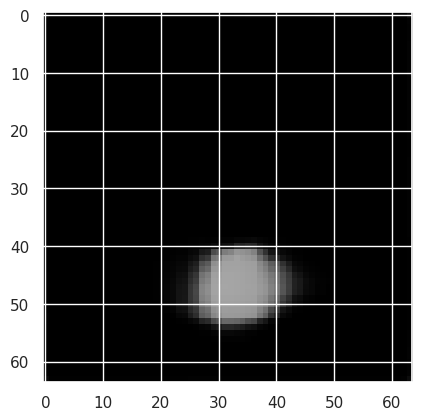

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


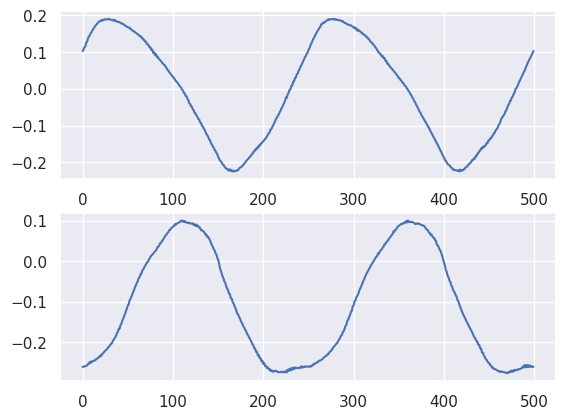

************************************************


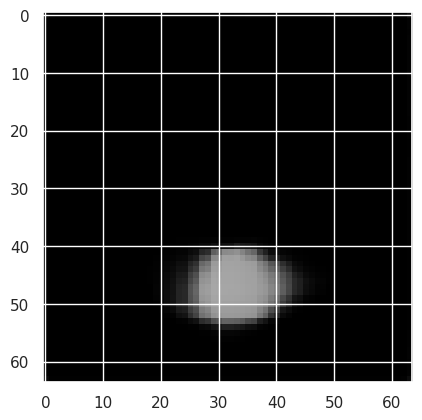

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


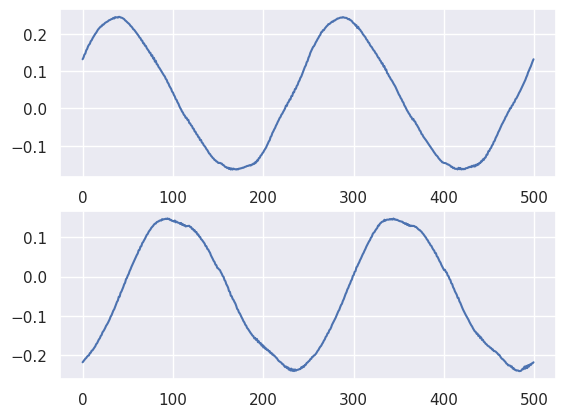

************************************************


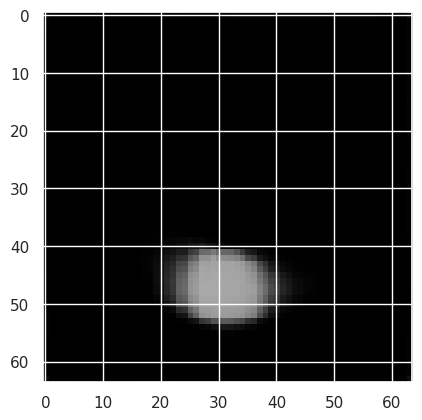

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


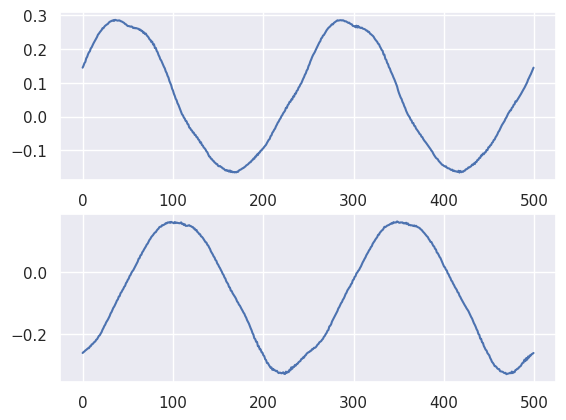

************************************************


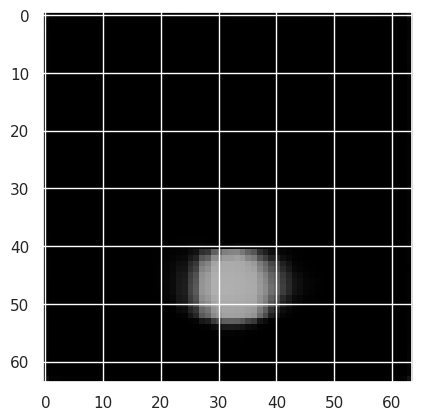

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


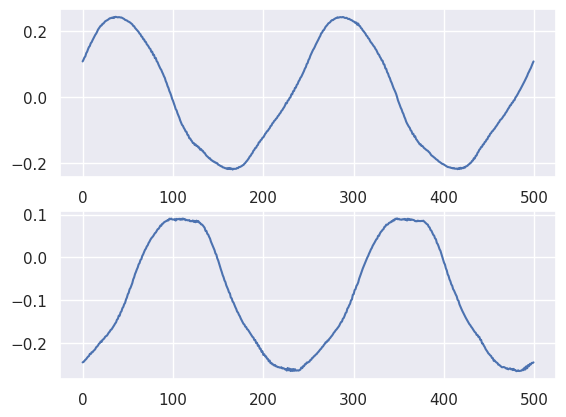

************************************************


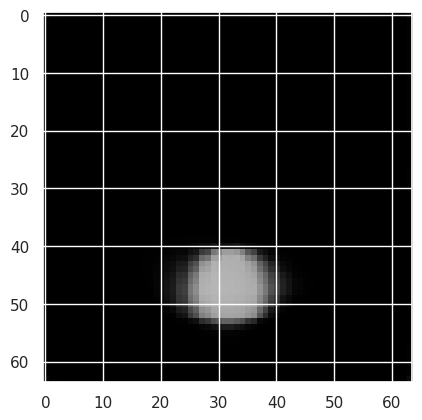

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


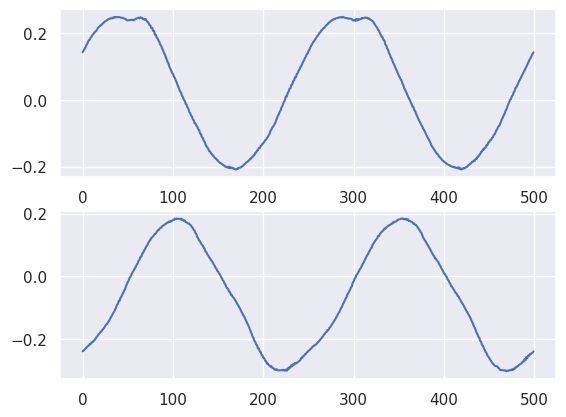

************************************************


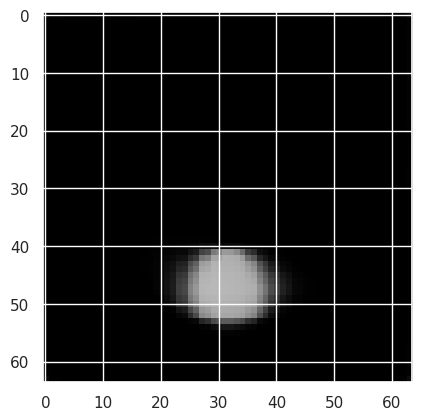

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


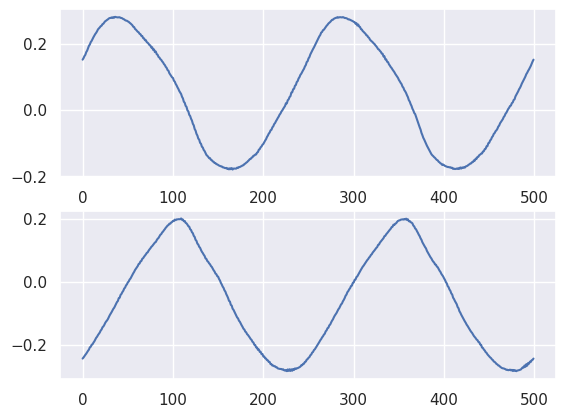

************************************************


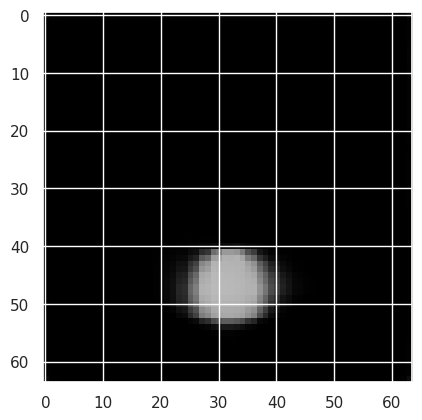

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


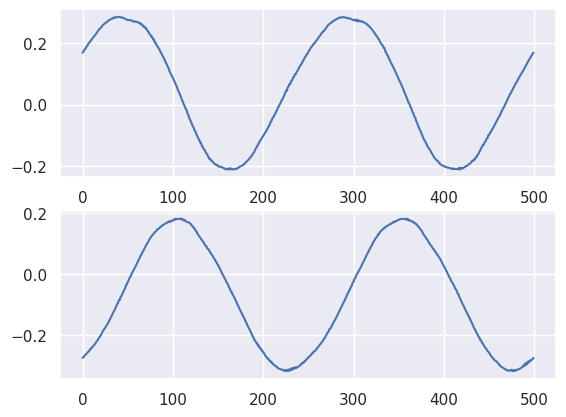

************************************************


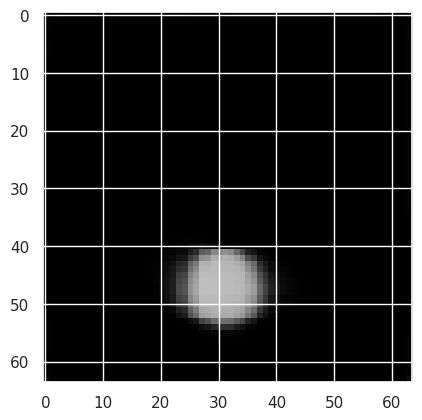

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


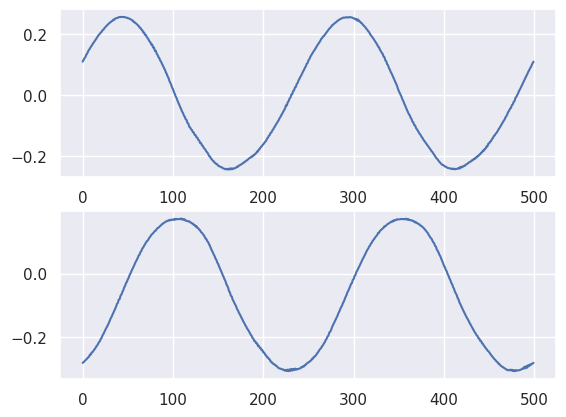

************************************************


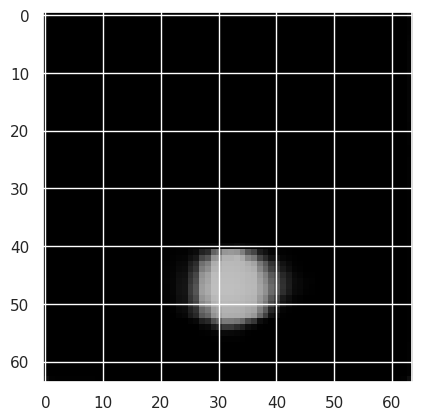

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


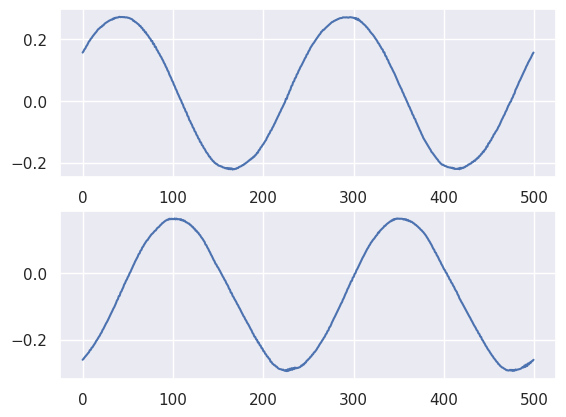

************************************************


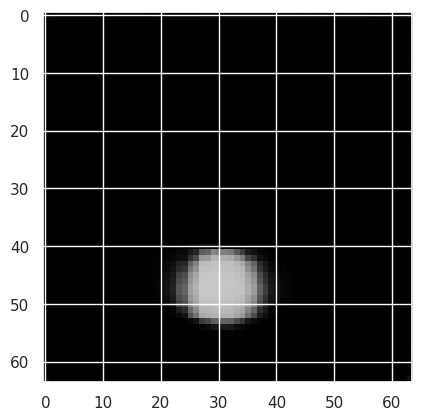

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


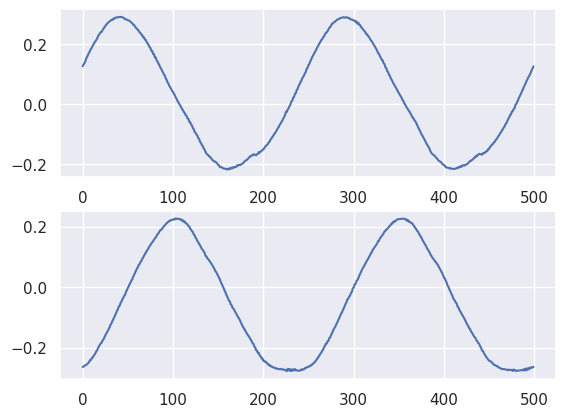

************************************************


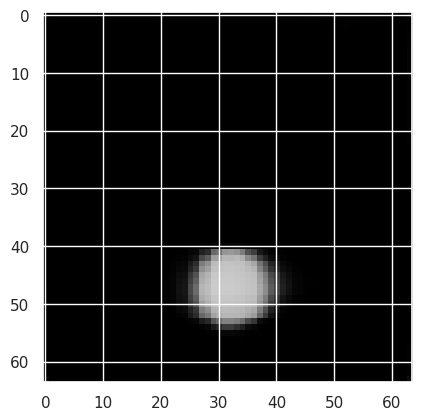

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


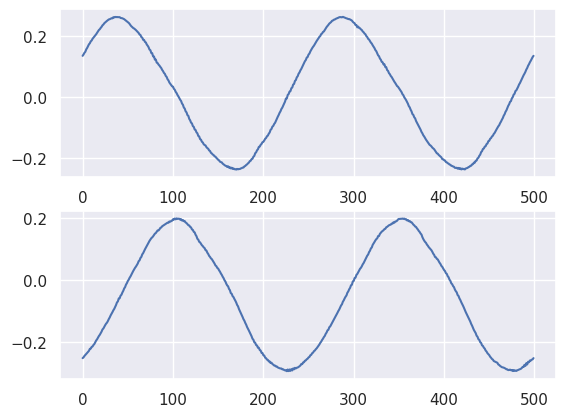

************************************************


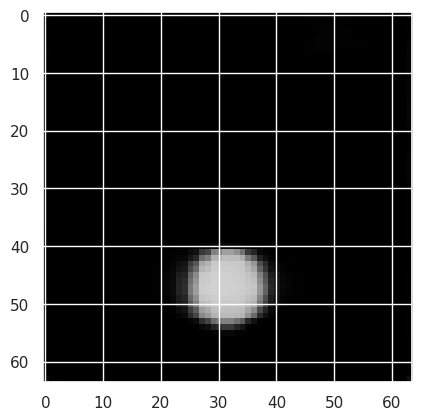

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


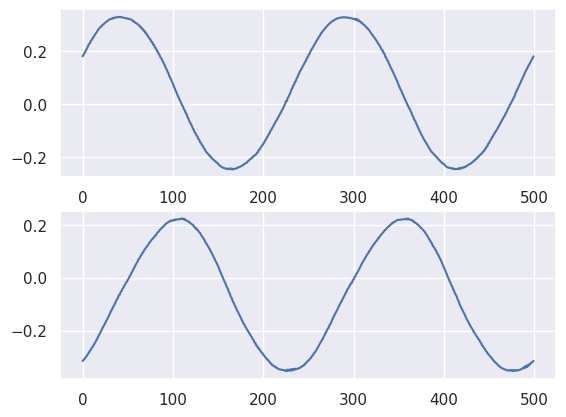

************************************************


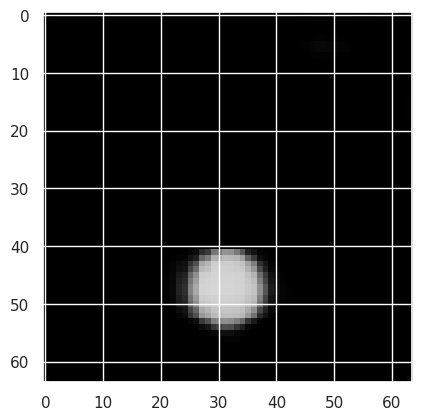

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


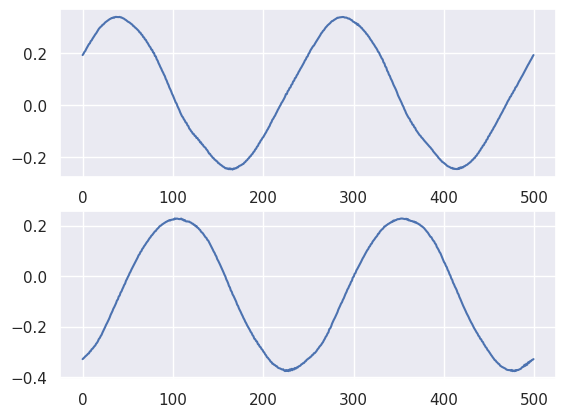

************************************************


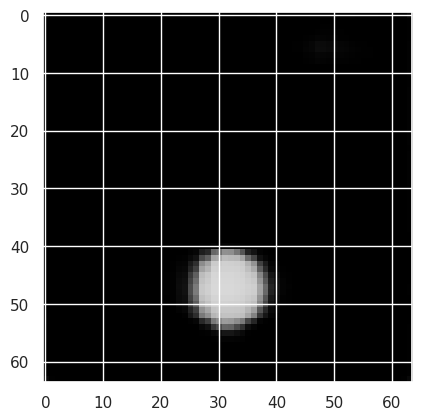

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


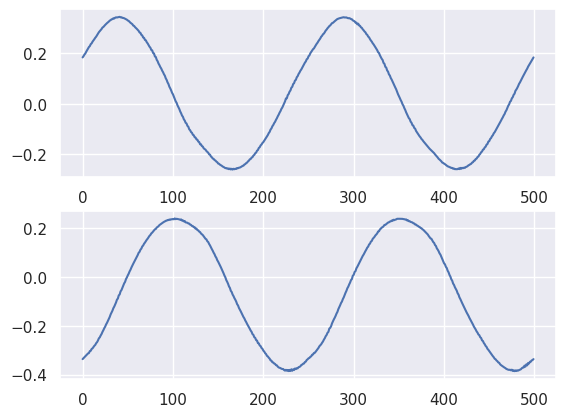

************************************************


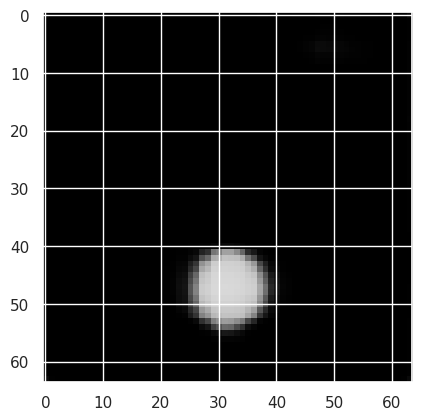

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


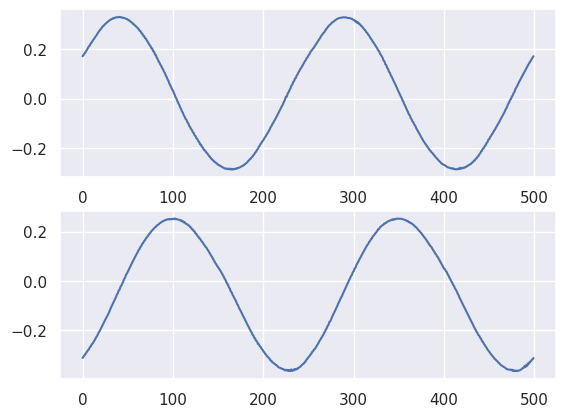

************************************************


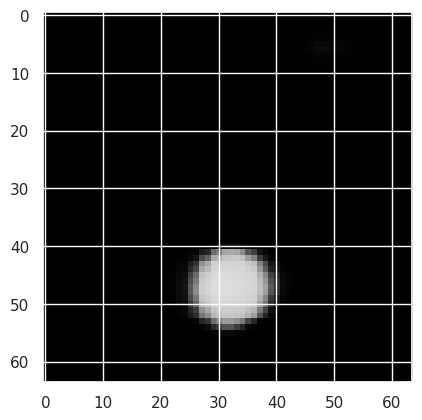

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


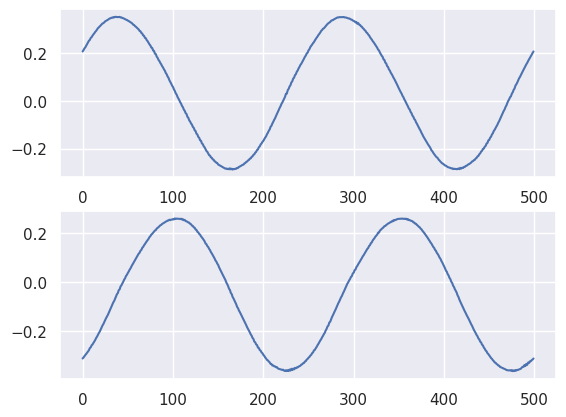

************************************************


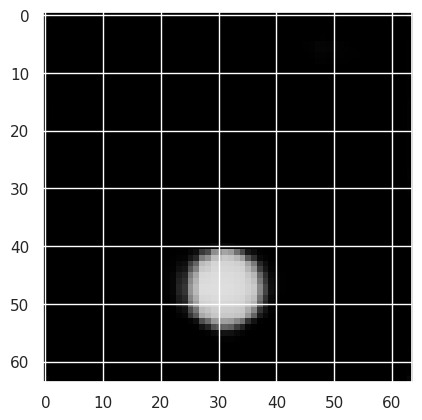

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


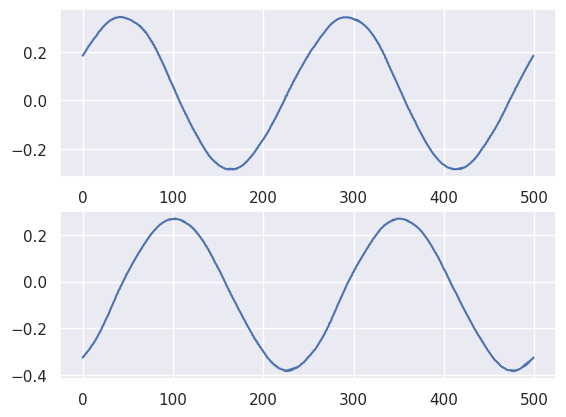

************************************************


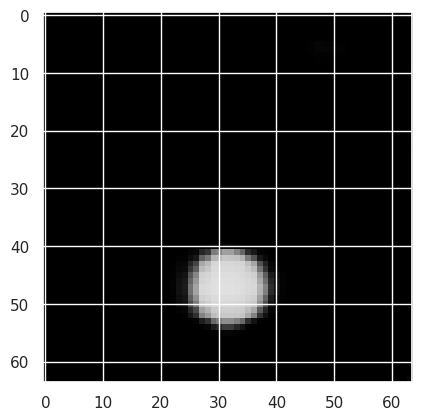

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


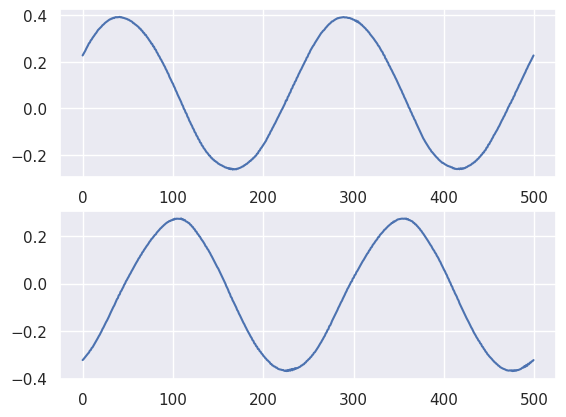

************************************************


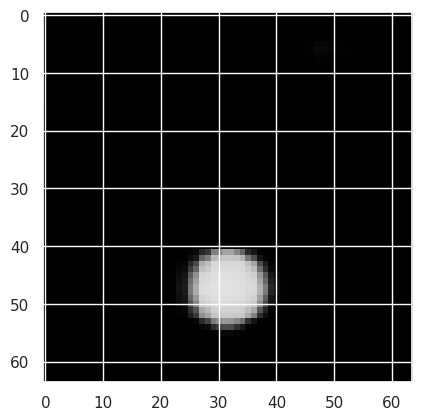

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


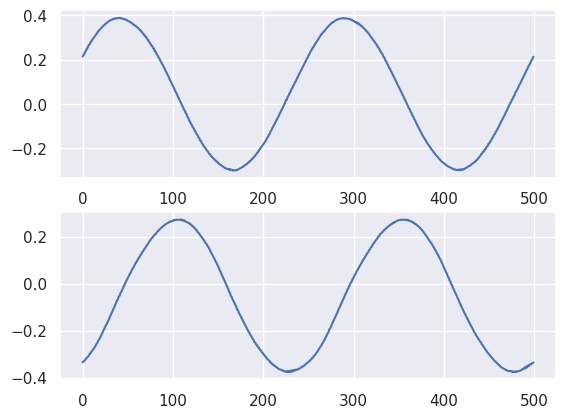

************************************************


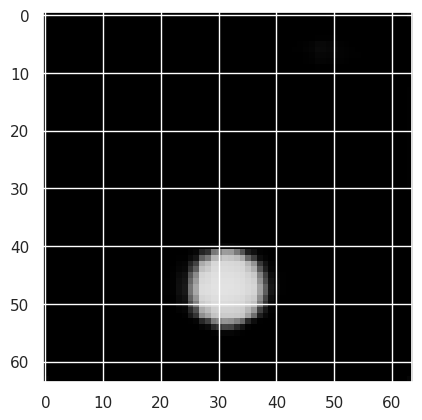

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


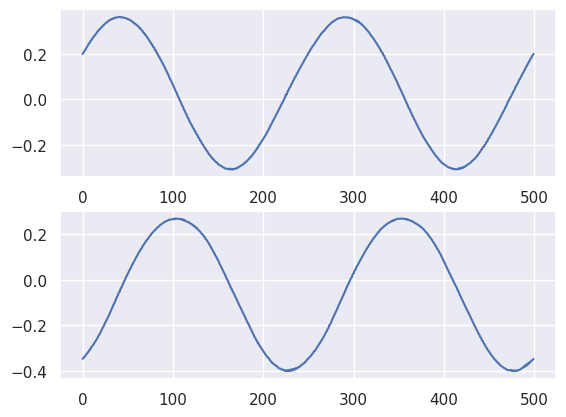

************************************************


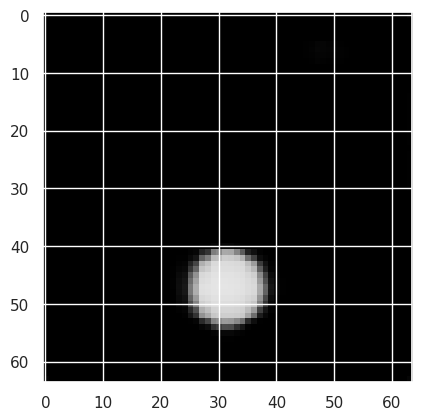

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


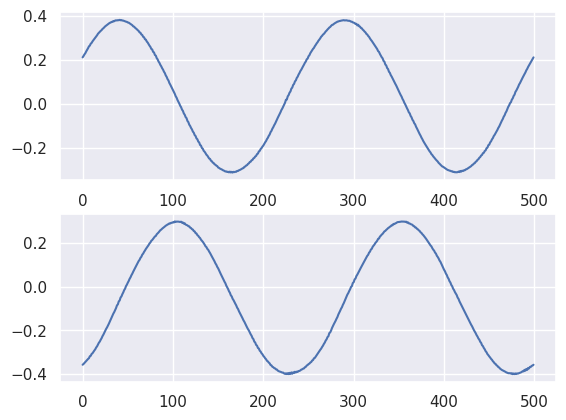

************************************************


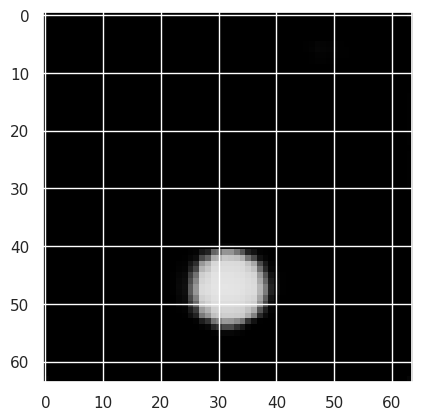

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


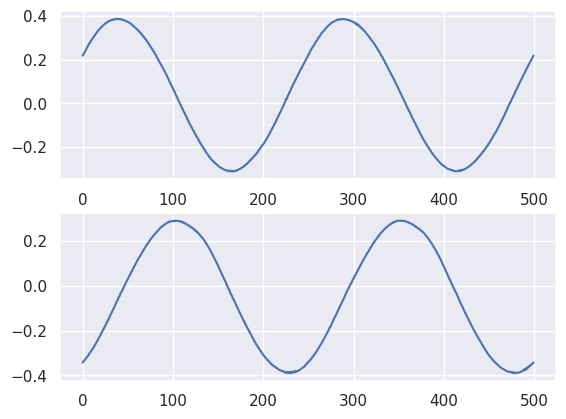

************************************************


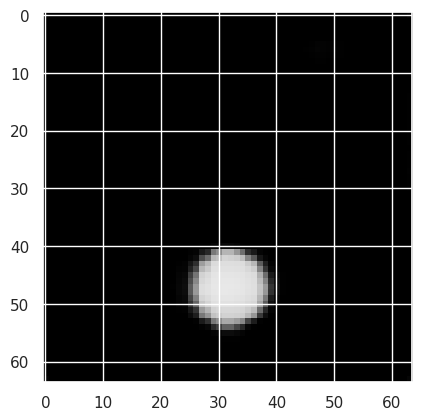

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


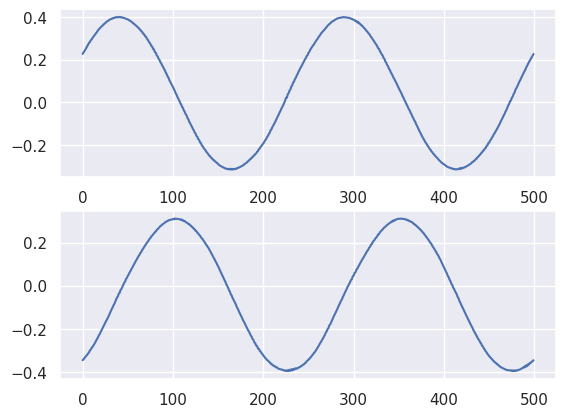

************************************************


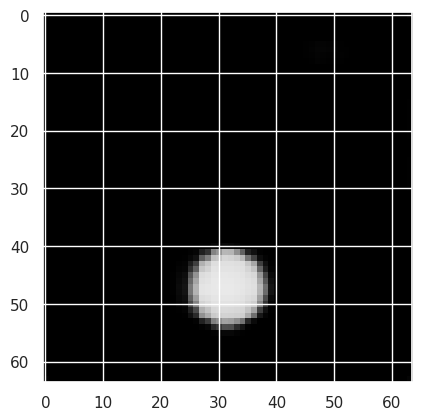

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


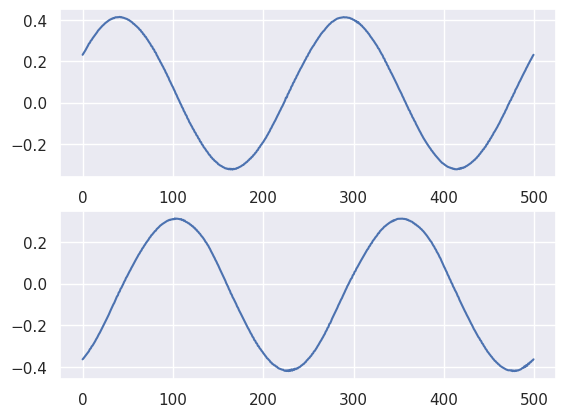

************************************************


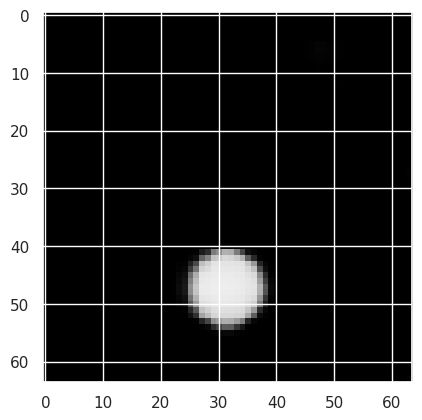

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


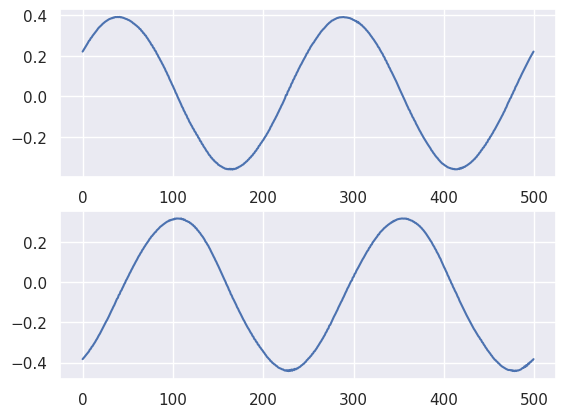

************************************************


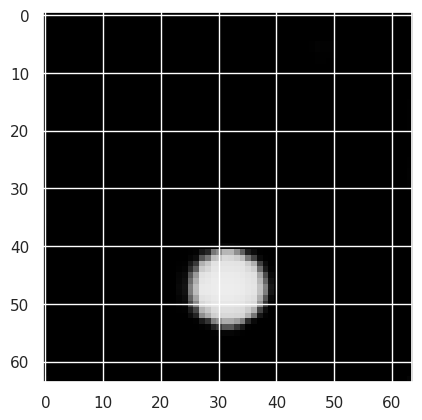

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


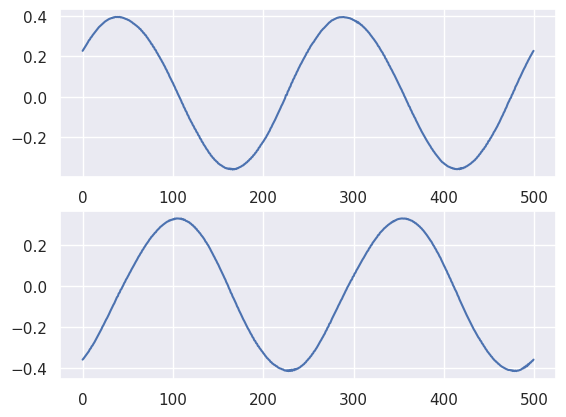

************************************************


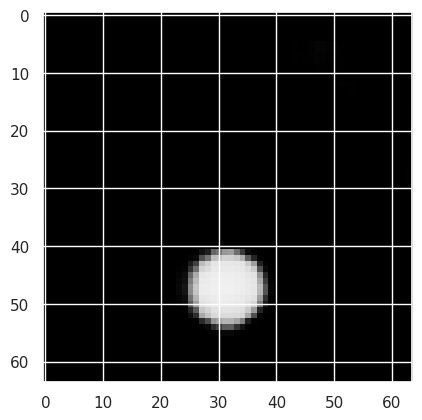

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


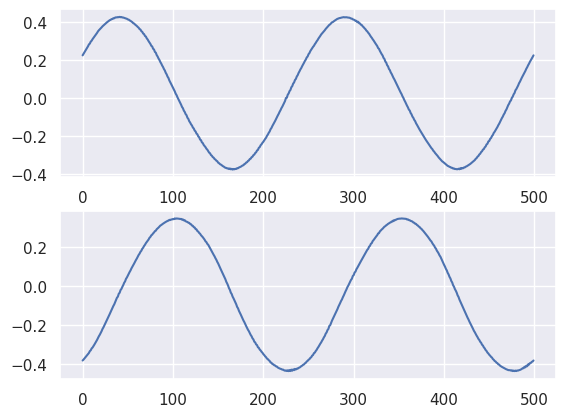

************************************************


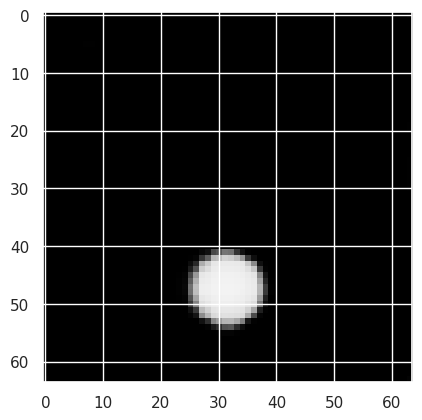

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


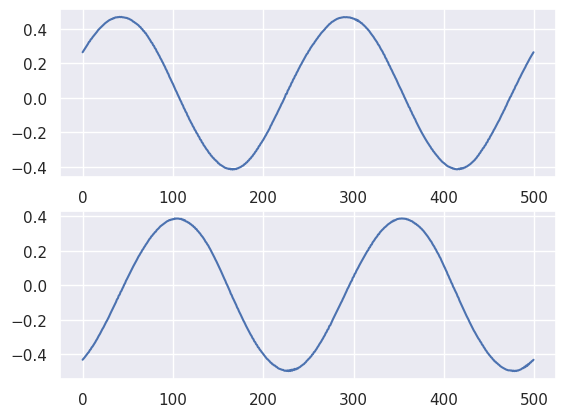

************************************************


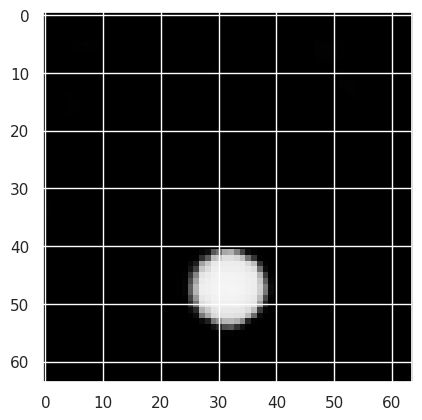

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


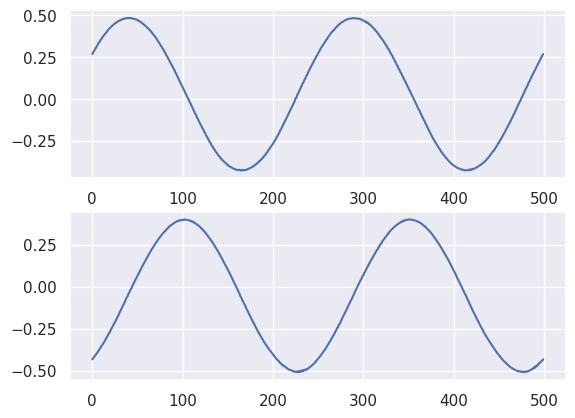

************************************************


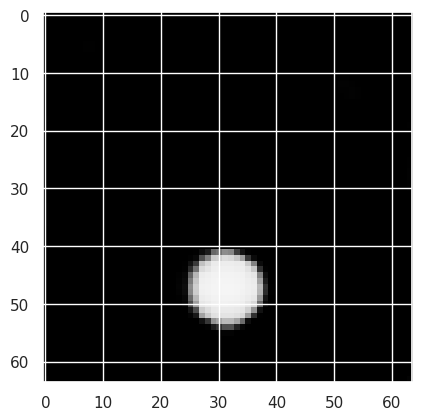

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


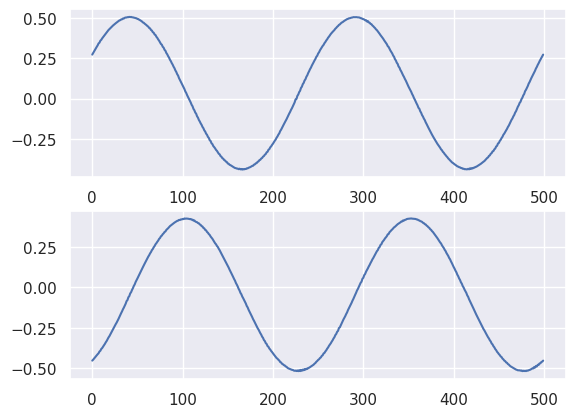

************************************************


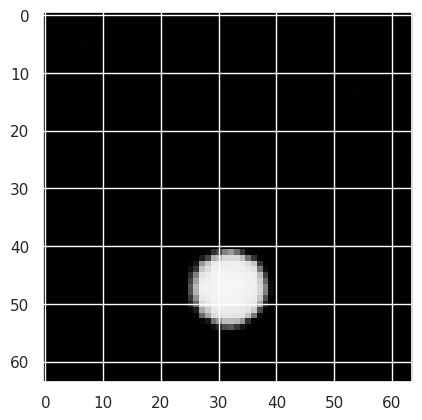

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


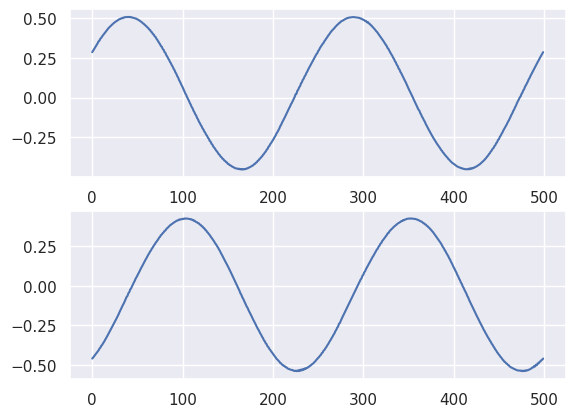

************************************************


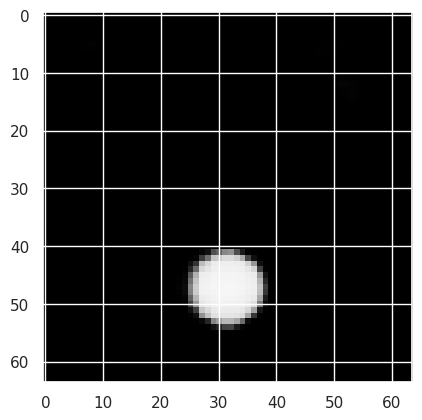

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


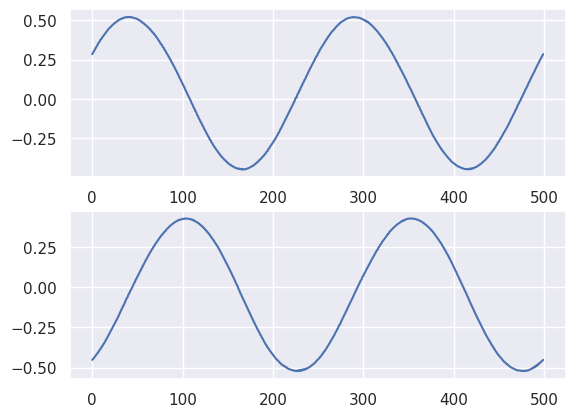

************************************************


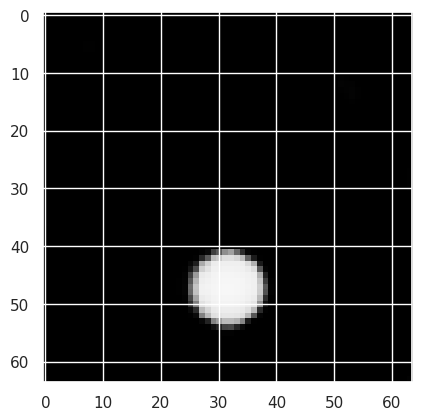

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


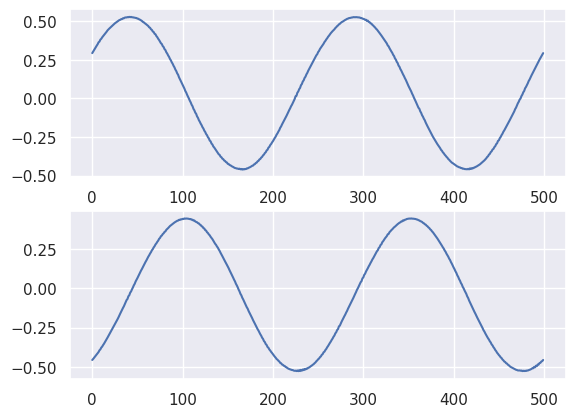

************************************************


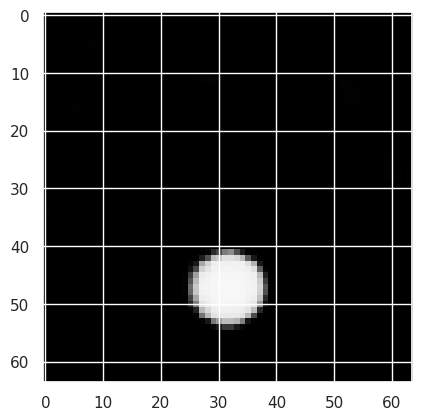

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


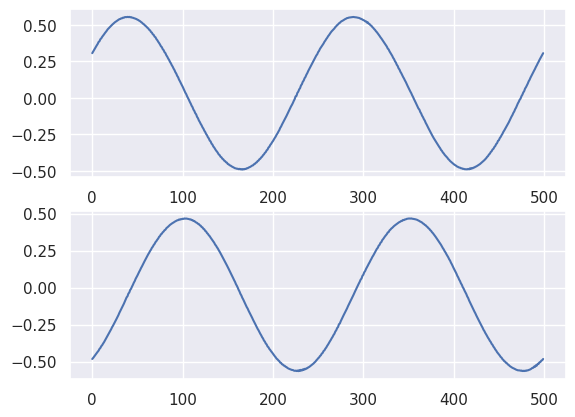

************************************************


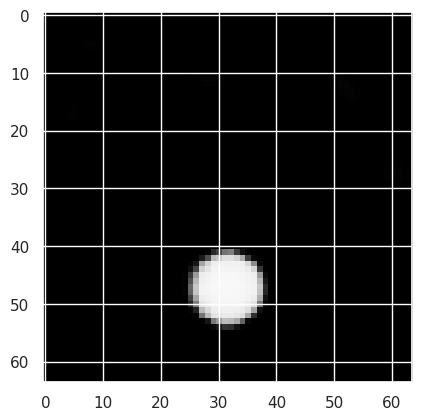

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


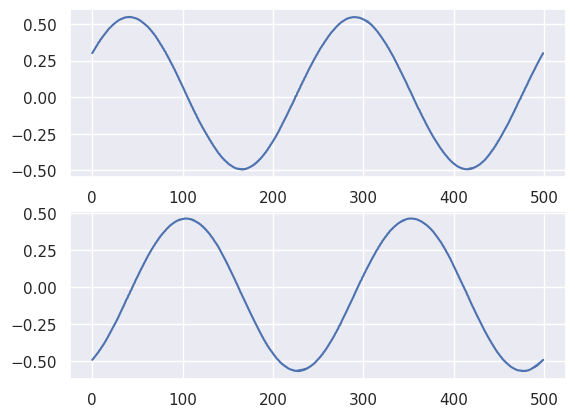

************************************************


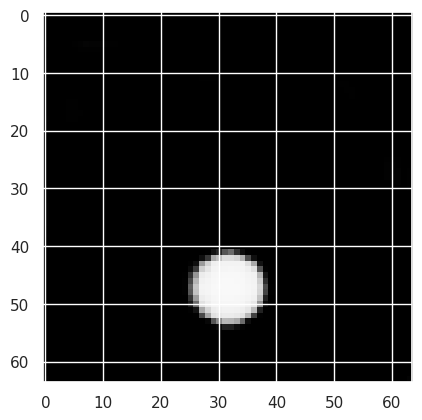

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


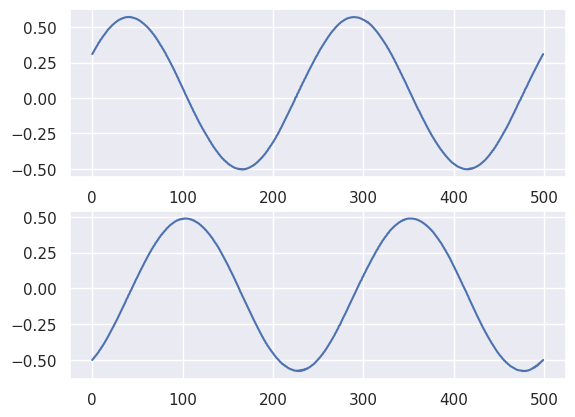

************************************************


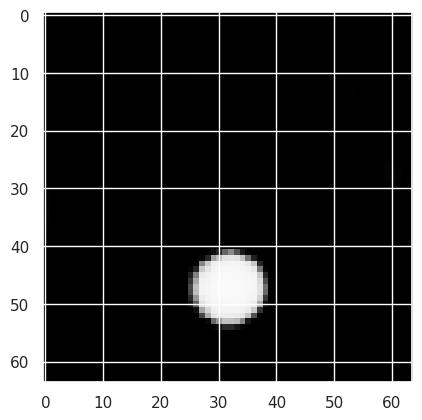

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


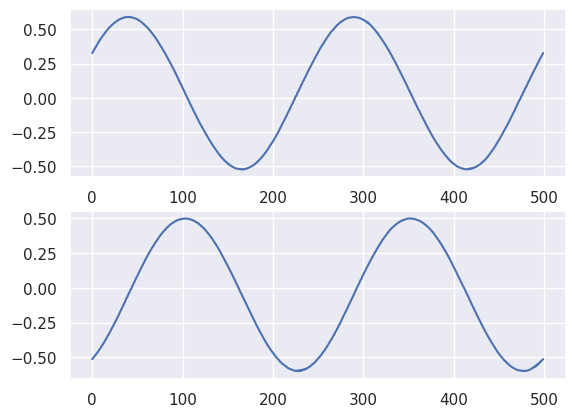

************************************************


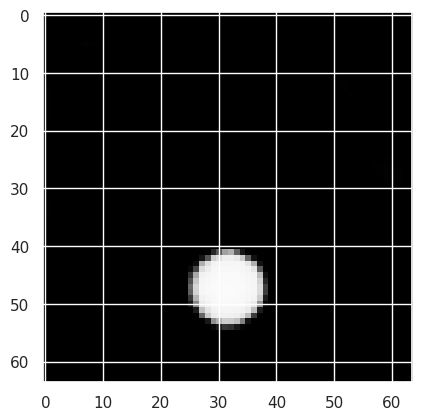

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


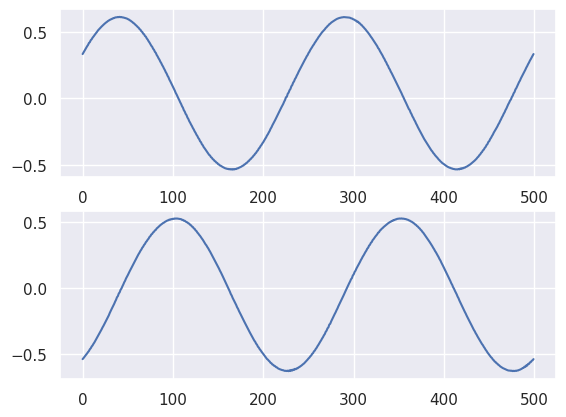

************************************************


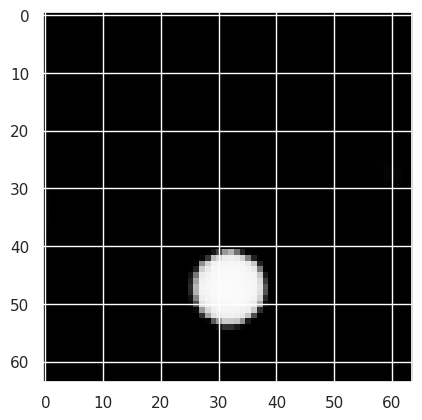

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


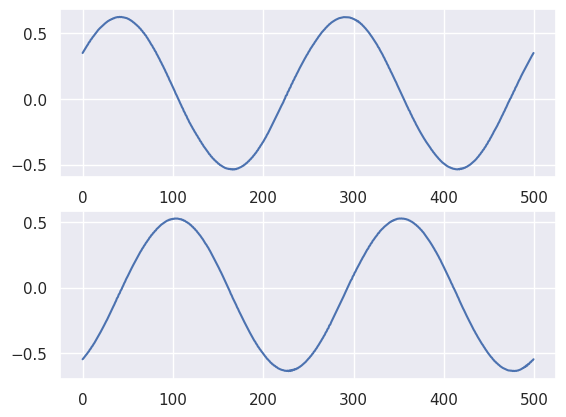

************************************************


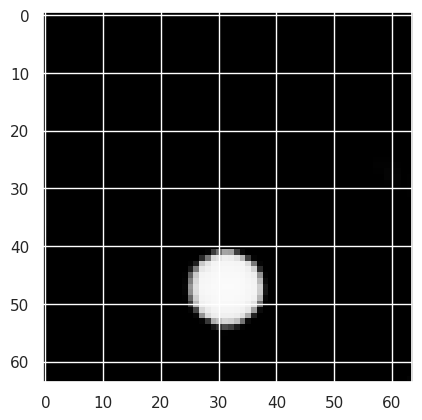

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


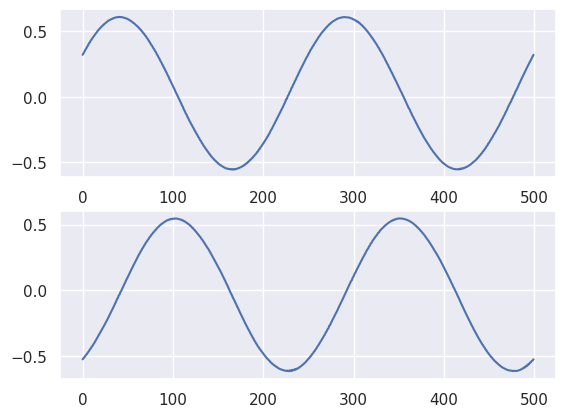

************************************************


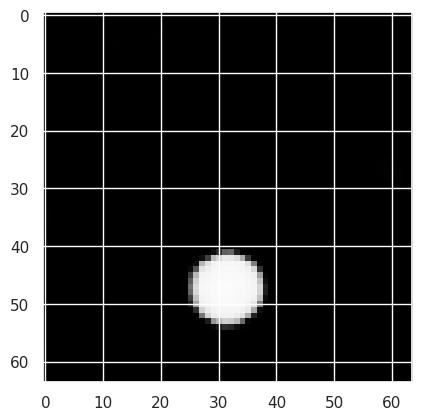

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


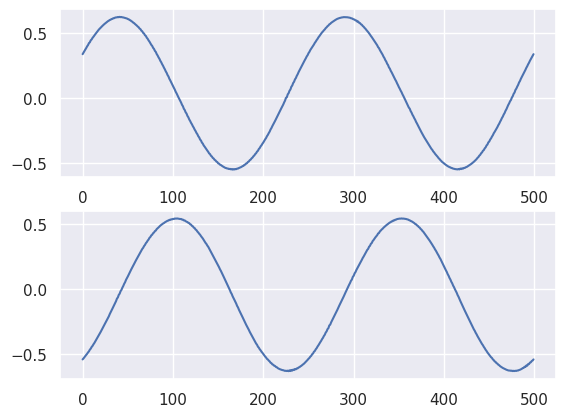

************************************************


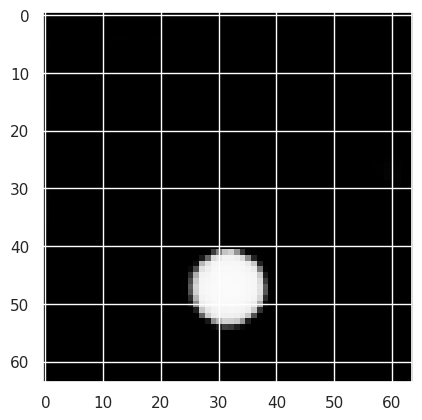

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


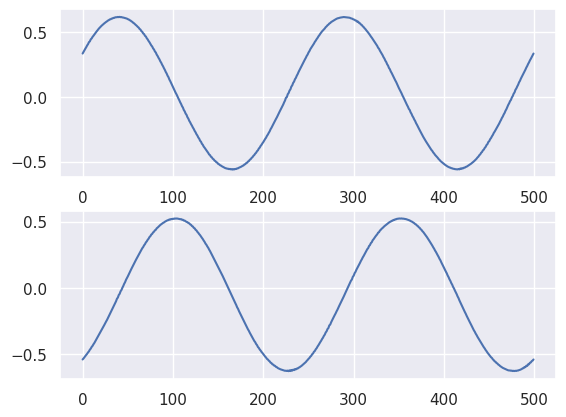

************************************************


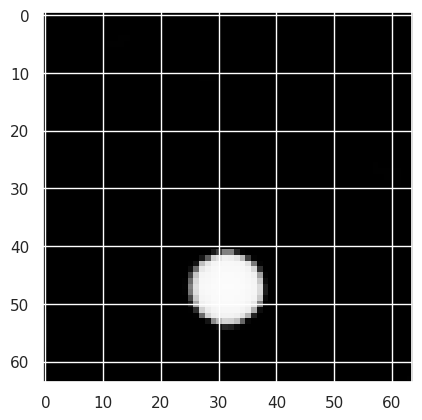

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


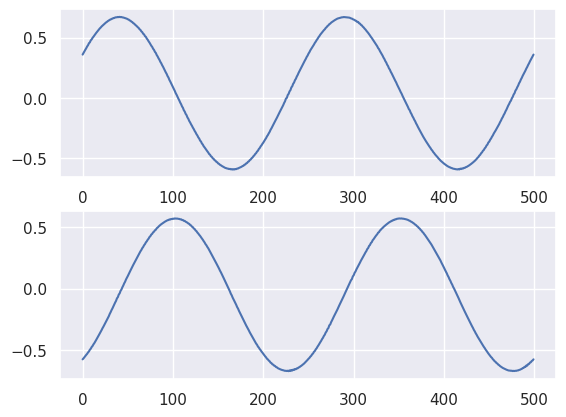

************************************************


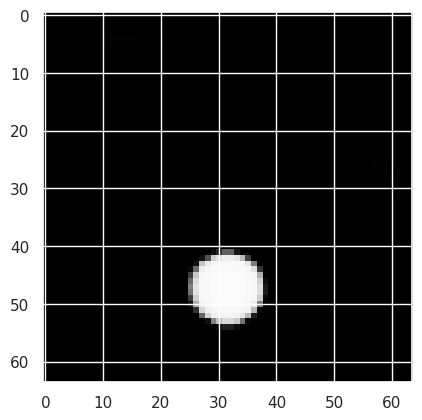

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


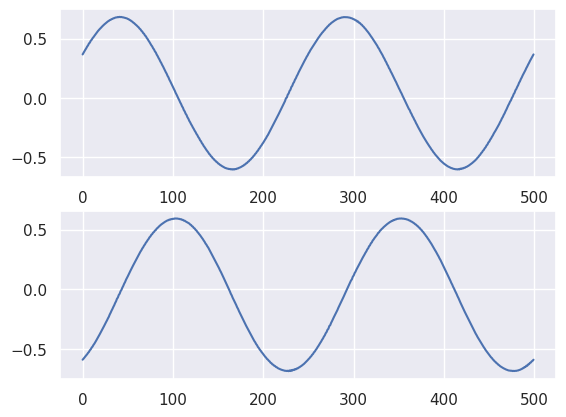

************************************************


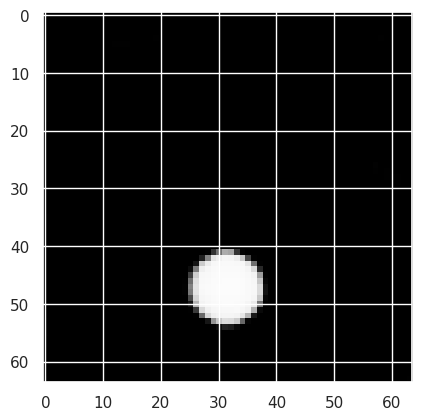

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


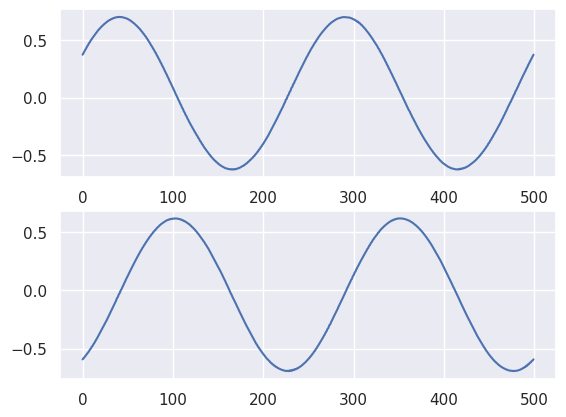

************************************************


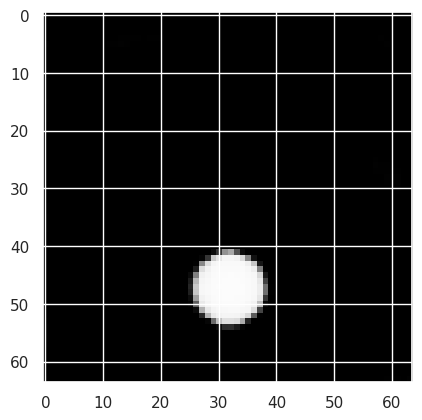

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


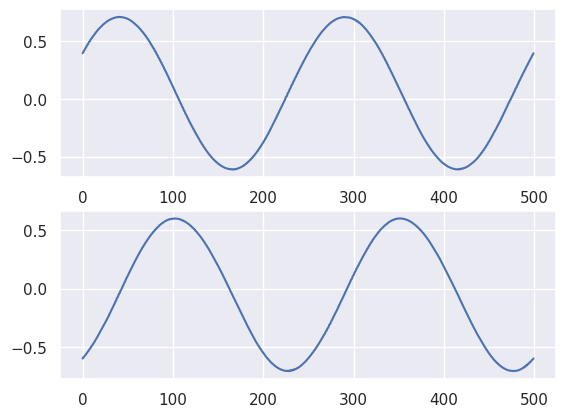

************************************************


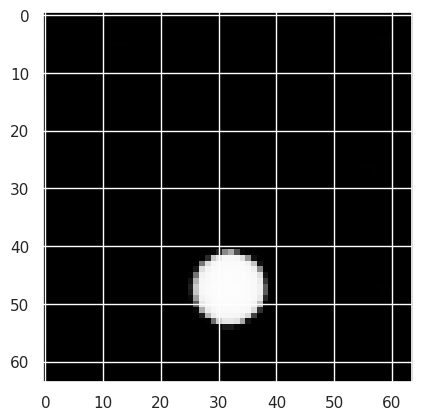

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


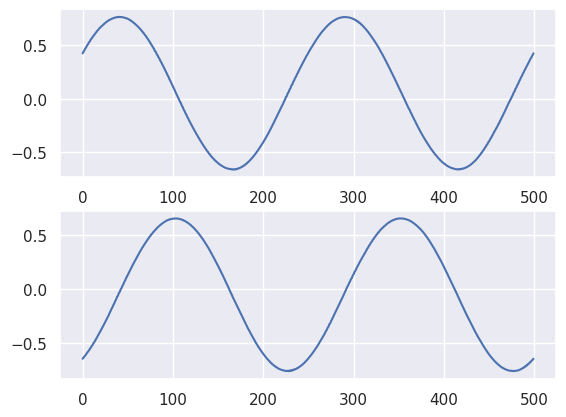

************************************************


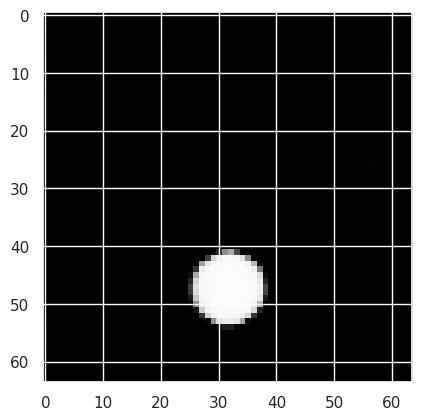

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


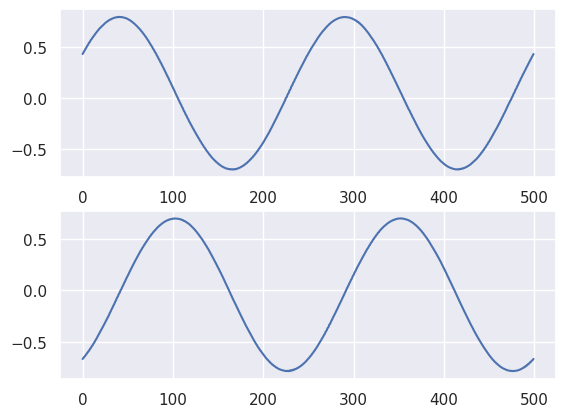

************************************************


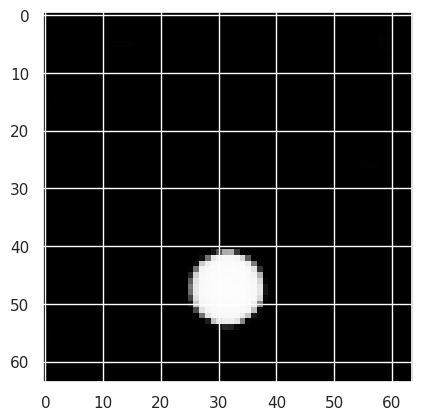

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


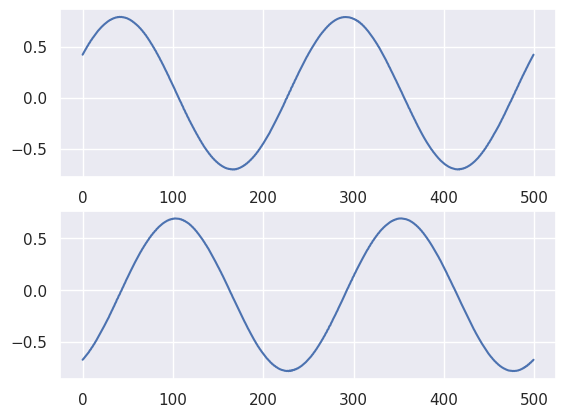

************************************************


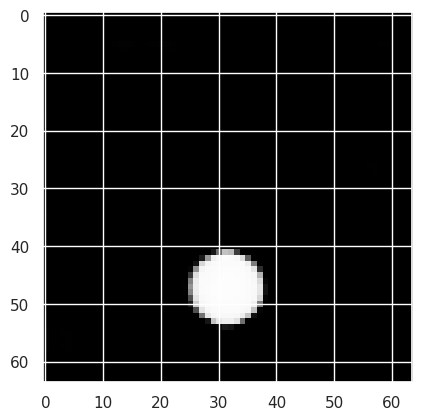

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


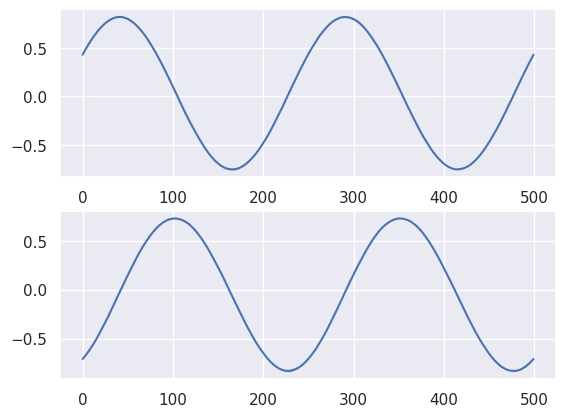

************************************************


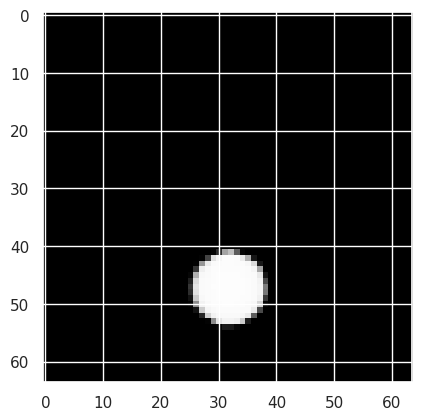

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


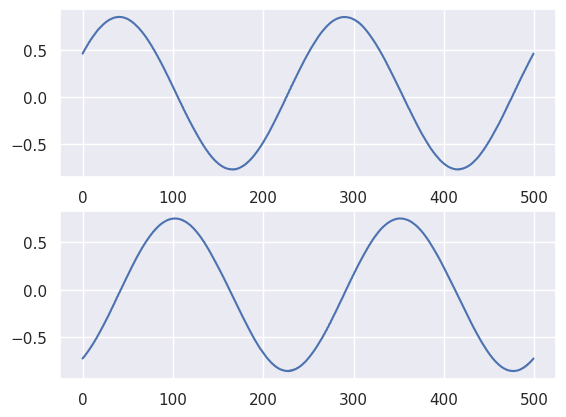

************************************************


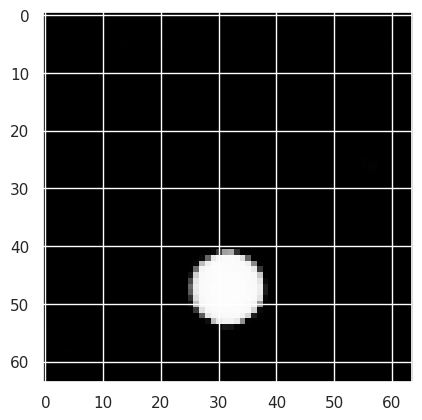

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


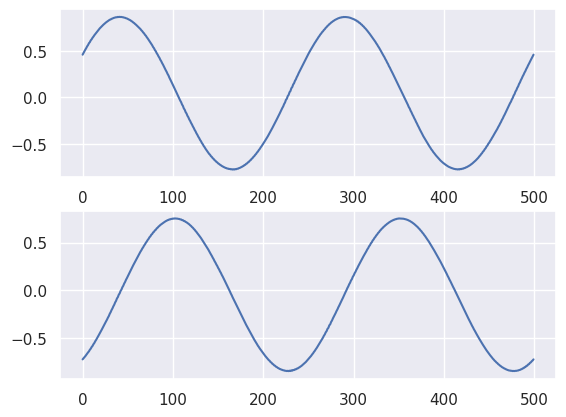

************************************************


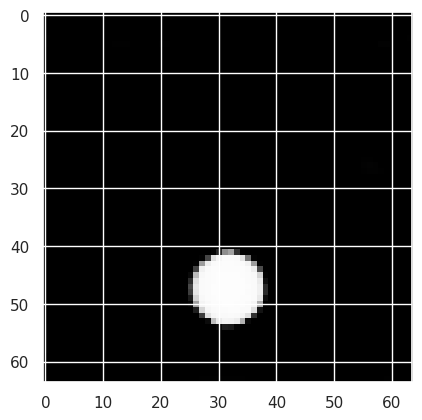

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


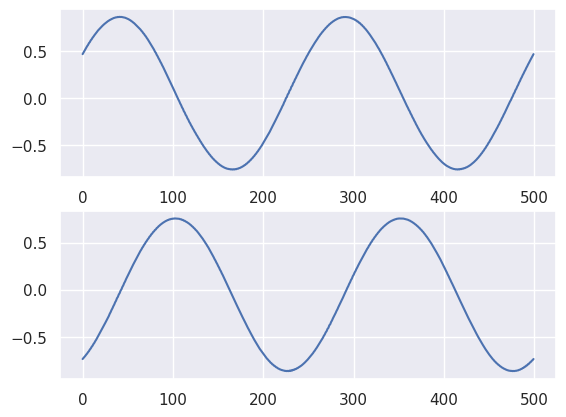

************************************************


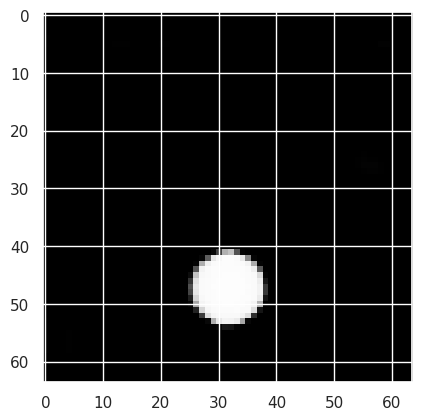

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


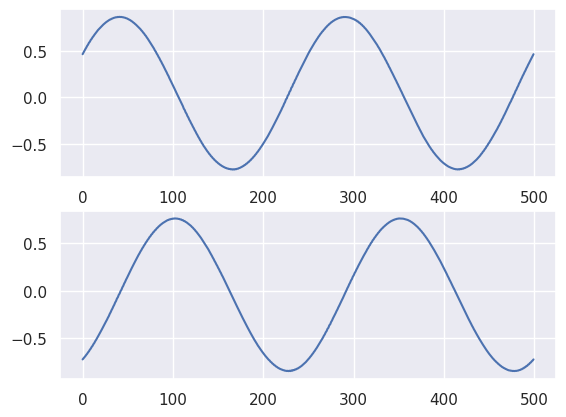

************************************************


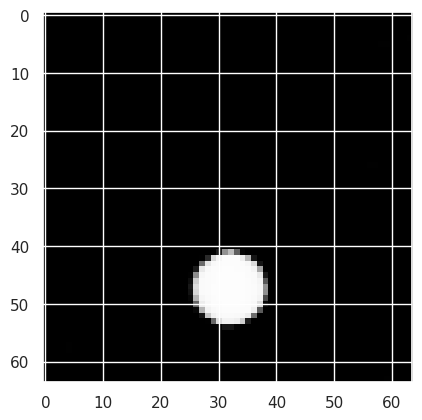

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


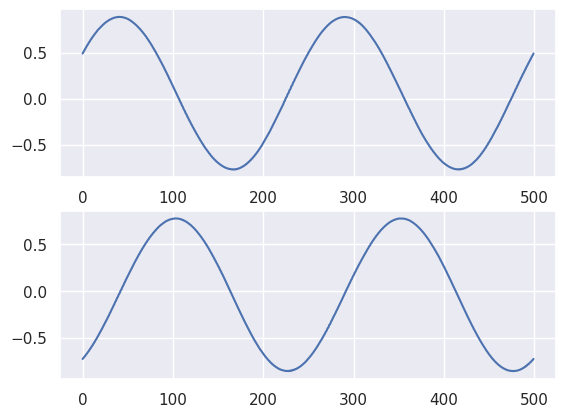

************************************************


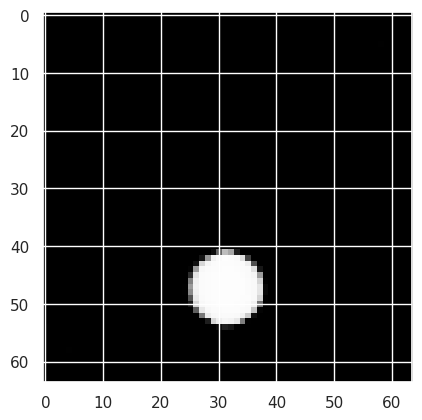

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


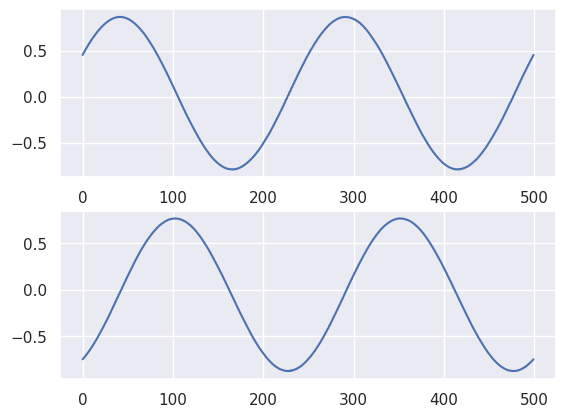

************************************************


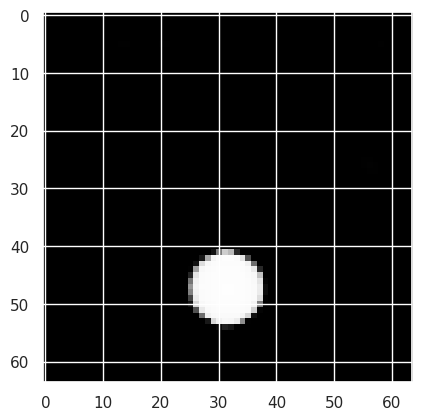

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


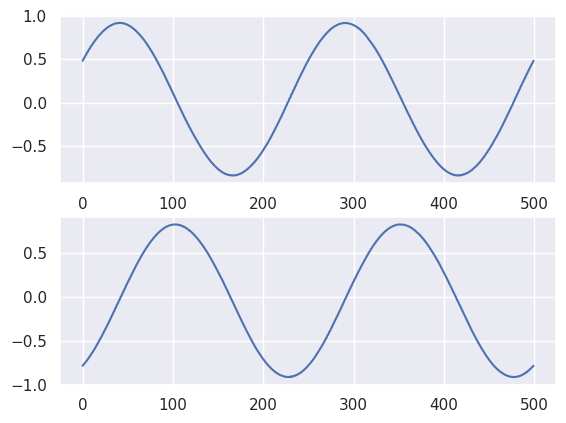

************************************************


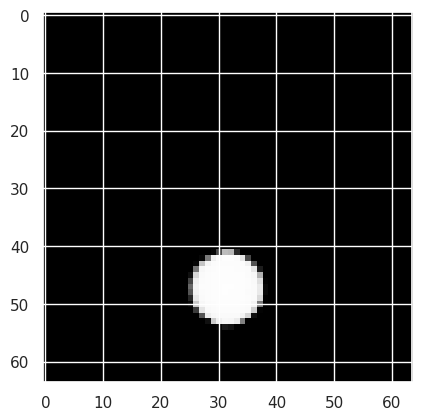

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


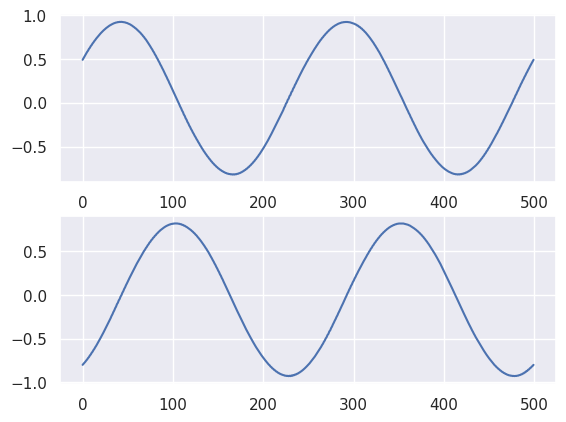

************************************************


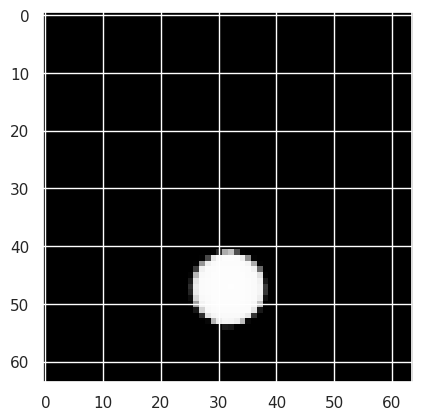

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


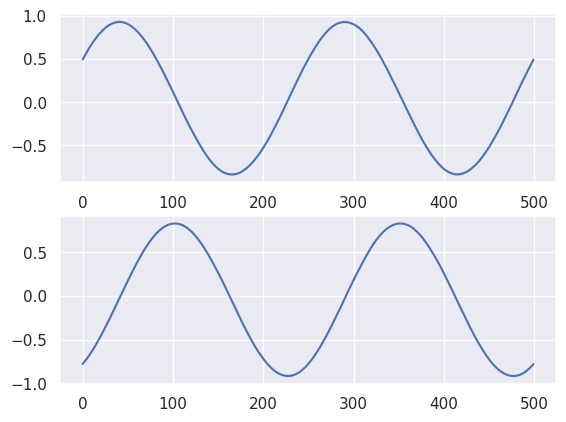

************************************************


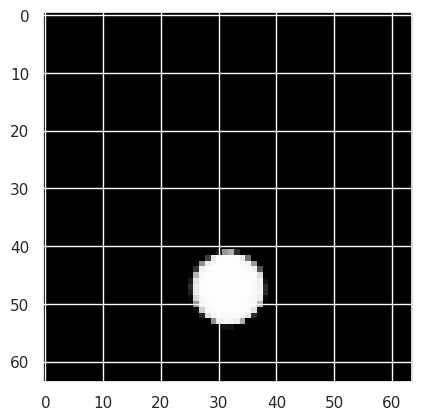

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


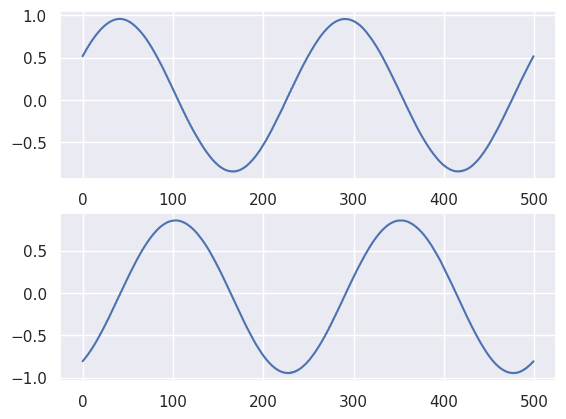

************************************************


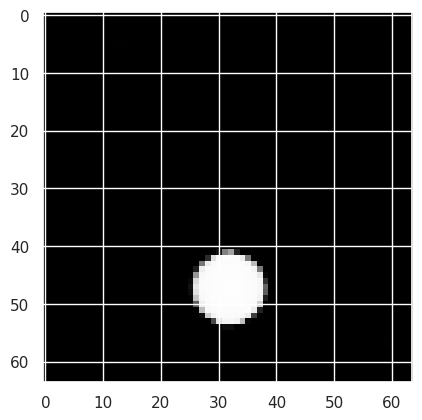

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


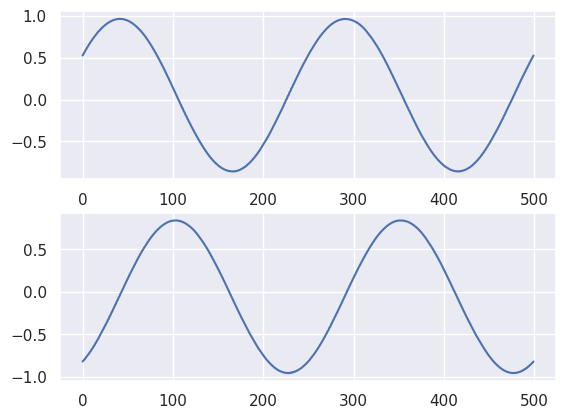

************************************************


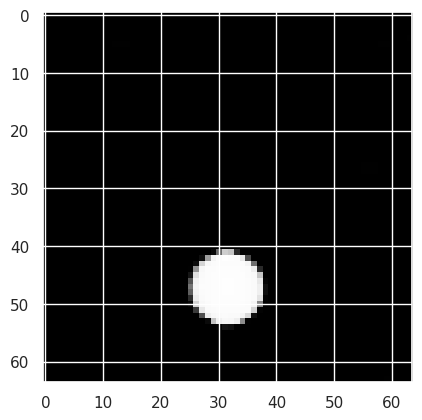

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


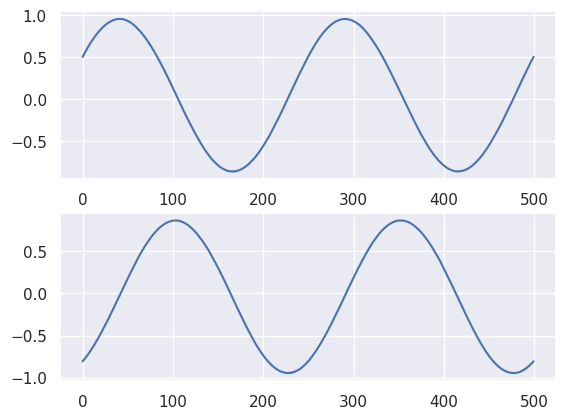

************************************************


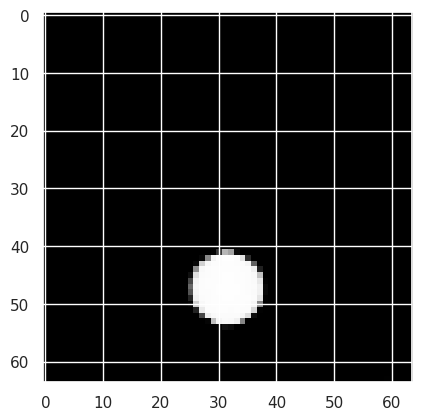

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


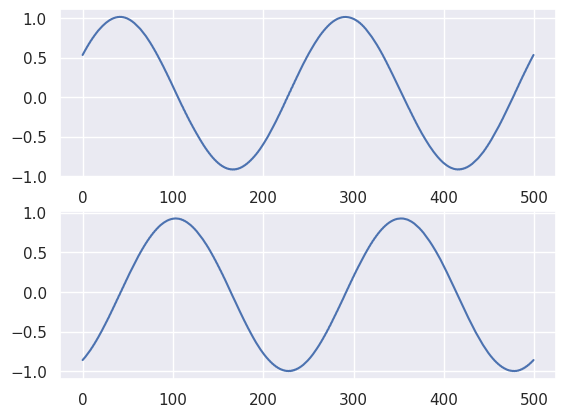

************************************************


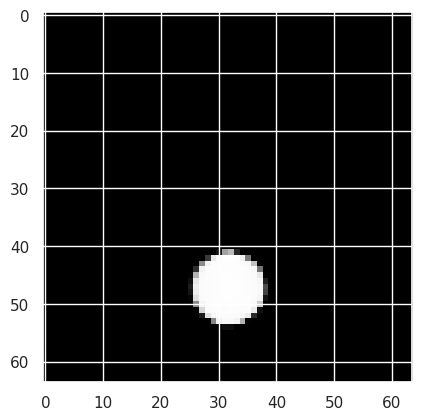

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


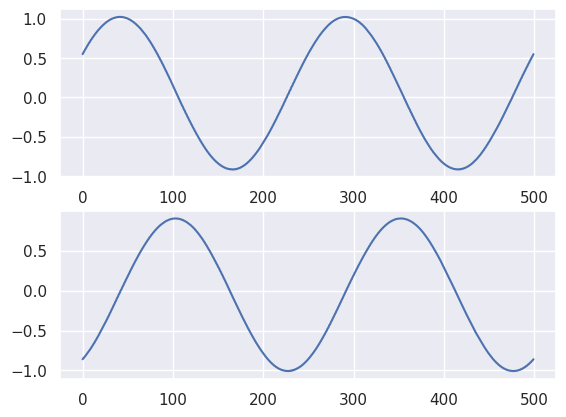

************************************************


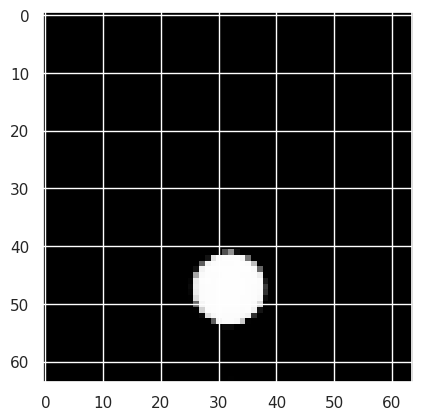

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


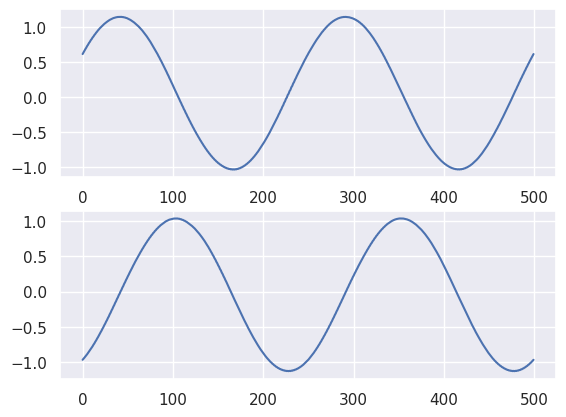

************************************************


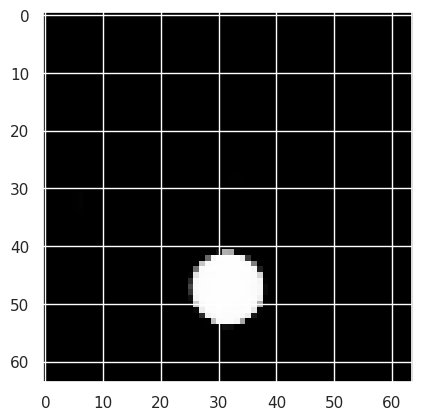

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


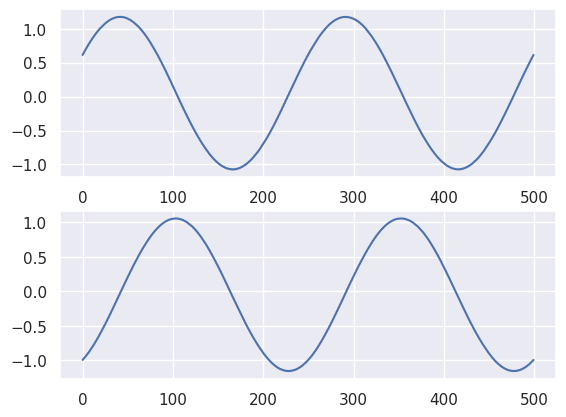

************************************************


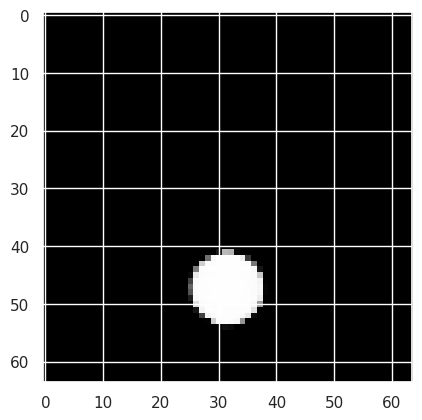

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


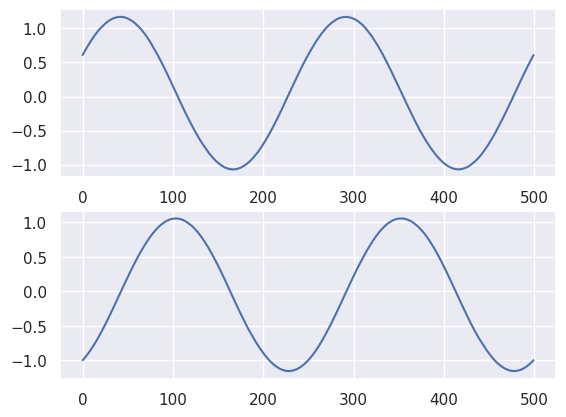

************************************************


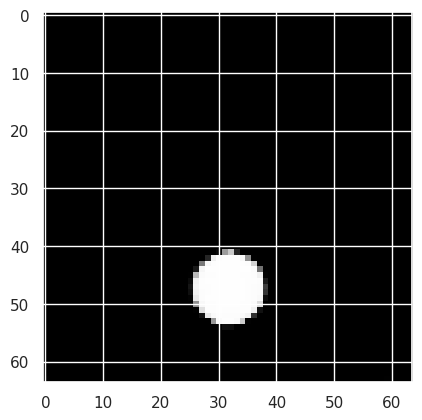

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


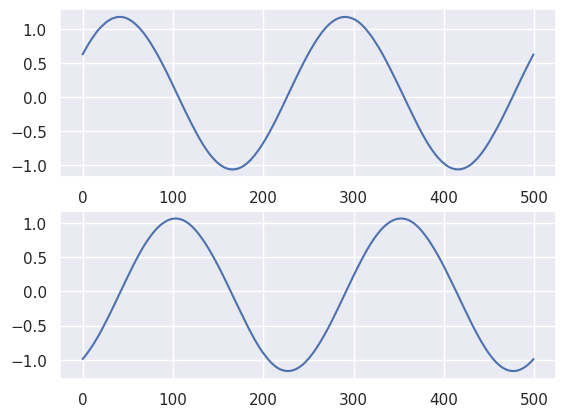

************************************************


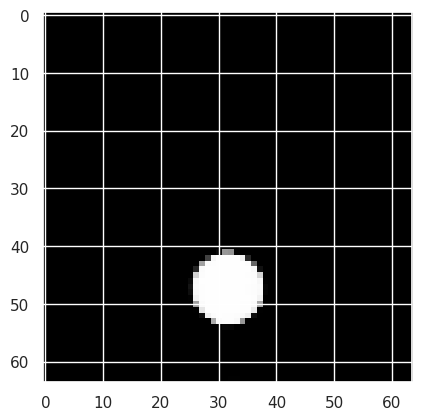

<ipython-input-15-03c46cc09871>:55: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(211)


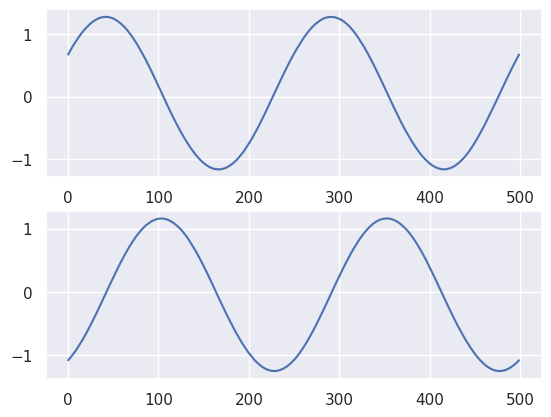

************************************************
Training duration = 838.3125352859497


In [15]:
t1 = time.time()
epochs = 3000
dataset,true_trajec,time_vec,truex,truey = get_dataset()
loss_vec = []
collection = {}
train_loss = []
best_loss = np.inf
batch_size = 500
df_batches = to_batches(dataset,batch_size)
sindy_loss_vec = []
dt = time_vec[1] - time_vec[0]
for epoch in range(1,epochs+1):

  epoch_loss = 0
  epoch_vae_loss = 0
  for X_ in df_batches:
    X = X_.float()
    X = X.to(device)
    X = X.permute(0,3,1,2)
    optimizer.zero_grad()
    mu, logvar, im,z = vae(X)
    dz = data_grad(mu,time_vec,device,1)[1]
    prior_loss = (mu ** 2 + logvar.exp() - 1 - logvar).mean()
    post_loss = loss_func(im,X.reshape(im.shape))
    vae_loss = 0*prior_loss + 10 * post_loss

    #Sindy
    lib = library(mu,1, False,True, device)
    g = lib@coeff
    integrated = integrate(mu, g, dt)
    sindy_loss = loss_func(dz, g)

    tot_loss = 100*vae_loss + 10*sindy_loss
    tot_loss.backward()
    optimizer.step()

  epoch_vae_loss += tot_loss
  train_loss.append(epoch_vae_loss.cpu().detach()/batch_size)
  if vae_loss < best_loss:
      best_loss = vae_loss.item()

      plt.imshow(torch.stack((im[0,0], im[0,0], im[0,0]), 2).cpu().detach())
      plt.savefig('test.png')
      plt.show()
      plt.close('all')

      plt.scatter(mu[:,0].cpu().detach(), mu[:,1].cpu().detach())
      plt.savefig('scatter.pdf')
      plt.close('all')

      plt.plot(loss_vec)
      plt.savefig('loss.pdf')
      plt.close('all')
      plt.title("epoch = "+str(epoch))
      plt.subplot(211)
      plt.plot(mu[:,0].cpu().detach())
      plt.subplot(212)
      plt.plot(mu[:,1].cpu().detach())
      plt.show()
      plt.savefig('path.pdf')
      plt.close('all')
      print("************************************************")
t2 = time.time()
print("Training duration = "+str(t2 - t1))

In [16]:
coeff

Parameter containing:
tensor([[ 0.1122,  6.2284],
        [-6.3340, -0.1122],
        [-0.3043, -0.3528]], device='cuda:0', requires_grad=True)

In [17]:
X_ = torch.tensor(dataset)
X = X_.float()
X = X.to(device)
X = X.permute(0,3,1,2)
mu, logvar, im,z = vae(X)

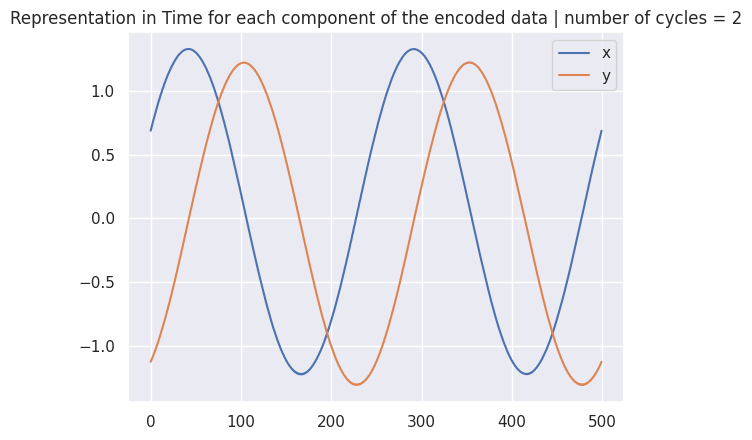

In [18]:
plt.title("Representation in Time for each component of the encoded data | number of cycles = 2")
plt.plot(mu[:,0].cpu().detach().numpy(),label = "x")
plt.plot(mu[:,1].cpu().detach().numpy(),label = "y")
plt.legend(loc ="best")
plt.savefig("encoded data.png")

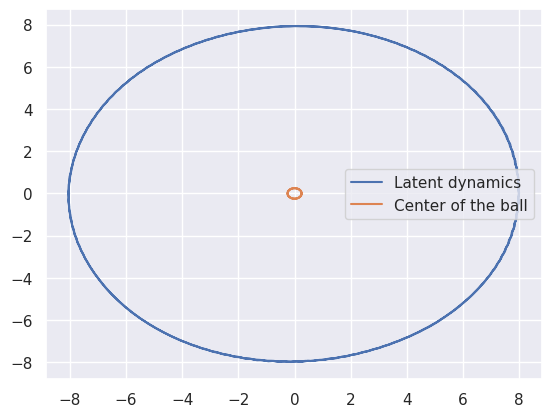

In [23]:
lib = library(mu, 1, False, True, device)
estim = lib@coeff
integrated = integrate(mu, estim, time_vec[1]-time_vec[0])
estim = estim.cpu().detach().numpy()
plt.plot(estim[:,0],estim[:,1], label = "Latent dynamics")
plt.plot(truex, truey,label = "Center of the ball")
plt.legend(loc="best")
plt.savefig("ball_dynamics.png")

The latent dynamics are up to a linear transformation to the true dynamics.

In [25]:
xt_hat = np.stack((estim[:,0],estim[:,1]), axis = 1)
xt = np.stack((truex, truey), axis = 1).reshape((xt_hat.shape[0],xt_hat.shape[1]))
xt_hat_aug = np.concatenate((xt_hat.reshape(estim[:,0].shape[0],2), np.ones((xt_hat.shape[0],1))),axis=1)
# calc affine map
x, residues, rank, s = np.linalg.lstsq(xt_hat_aug, xt)
bias = x[-1]
mat  = x[:-1]
#u, s2, vh = np.linalg.svd(mat)
Q = mat

xt_hat_aug_t = (  ( xt_hat ) @ Q + bias) # from latent to original


#back = ( xt - bias ) @ np.linalg.inv(Q)
mse = ( ( xt_hat_aug_t - xt ) ** 2 ).mean()
rel_error = np.abs( (xt_hat_aug_t - xt ) / xt).mean()
print(rel_error*100)

inf


<ipython-input-25-e4d42f0b88fc>:5: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  x, residues, rank, s = np.linalg.lstsq(xt_hat_aug, xt)
<ipython-input-25-e4d42f0b88fc>:16: RuntimeWarning: divide by zero encountered in true_divide
  rel_error = np.abs( (xt_hat_aug_t - xt ) / xt).mean()


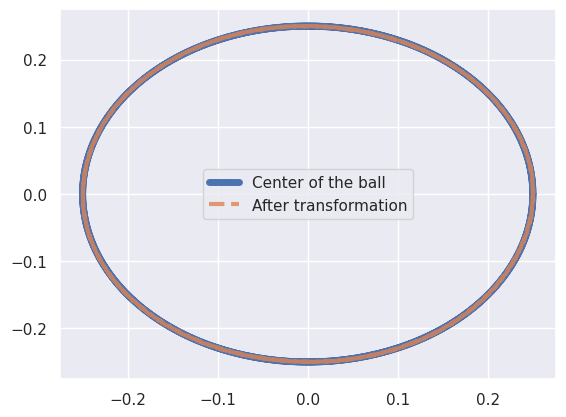

In [26]:
plt.plot(truex,truey,label = "Center of the ball",linewidth = 5)
plt.plot(xt_hat_aug_t[:,0], xt_hat_aug_t[:,1],"--",linewidth = 3, label="After transformation",alpha = 0.8)
plt.legend(loc="best")
plt.savefig("ball_transformation.png")

In [28]:
print("X = {} Z + {}".format(Q, bias))

X = [[ 0.02681989 -0.01590045]
 [ 0.01564902  0.02724666]] Z + [ 0.00088242 -0.00013289]
